<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/Generative-CDTL_0906.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concept drift tolerant machine learning method

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

# 실험을 위한 기본적인 function 들...

In [32]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
#from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

In [33]:
main_figsize=(15,3)

plt.rc('font', size=10)        # 기본 폰트 크기
plt.rc('axes', labelsize=10)   # x,y축 label 폰트 크기
plt.rc('xtick', labelsize=10)  # x축 눈금 폰트 크기
plt.rc('ytick', labelsize=10)  # y축 눈금 폰트 크기
plt.rc('legend', fontsize=10)  # 범례 폰트 크기
plt.rc('figure', titlesize=10) # figure title 폰트 크기


In [34]:
def weights_init_normal(m):
    """Initializes the weight and bias of the model.

    Args:
        m: A torch model to initialize.

    Returns:
        None.
    """

    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find('Linear') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.2)
        torch.nn.init.constant_(m.bias.data, 0)


In [35]:
# Define the Generator
# bucket에 대해 x를 전처리
class Generator(nn.Module):

    def __init__(self,input_dim):
        super(Generator, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        #self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(2, self.input_dim*10))
            #self.fc2.append(nn.BatchNorm1d(num_features=50))
            self.fc3.append(nn.Linear(self.input_dim*10, 1))

        #self.fc = nn.Linear(input_dim, input_dim)

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = F.relu(self.fc2[i](h0))
            #h2 = self.fc3[i](h1)
            h2 = self.fc3[i](F.relu(h0))
            pxy.append(h2)

        #return self.fc(torch.tensor(torch.cat(pxy, dim=1), requires_grad = True))
        return torch.cat(pxy, dim=1)


In [36]:
# Define the Discriminator
# 비즈니스에 해당하는 모델
class Discriminator(nn.Module):

    def __init__(self, input_dim=5):
        """Initializes Discriminator with torch components."""
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, input_dim*4),
            nn.ReLU(),
            nn.Linear(input_dim*4, input_dim),
            nn.ReLU(),
            nn.Linear(input_dim, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.

        Args:
            input_data: The input data.

        Returns:
            The predicted label (y_hat) for the given input data.
        """

        output = self.model(input_data)
        return output


In [37]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
import scipy

def test_model(model_,model2_, train_tensors, test_tensors, avaible_range,columns):
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test

    model_.eval()

    b_dim = XS_test.shape[1]-1

    #test_analysis = {}
    XS = XS_train[:,b_dim].cpu().data.numpy()
    '''
    for bk in np.unique(XS,axis = 0):
        test_analysis[f'Sum(MI{bk})']= []
        test_analysis[f'Std(MI{bk})']= []
        test_analysis[f'Ent(MI{bk})']= []

        test_analysis[f'Sum(DR{bk})']= []
        test_analysis[f'Std(DR{bk})']= []
        test_analysis[f'Ent(DR{bk})']= []

    test_analysis['TrainSum(MI)']= []
    test_analysis['TrainStd(MI)']= []
    test_analysis['TrainEnt(MI)']= []

    test_analysis['Test Sum(MI)']= []
    test_analysis['Test Std(MI)']= []
    test_analysis['Test Ent(MI)']= []

    test_analysis['Test Sum(DR)']= []
    test_analysis['Test Std(DR)']= []
    test_analysis['Test Ent(DR)']= []
    '''
    if model2_ == None:
        ax = XS_test[:,0:b_dim]
        ref_ax = XS_train[:,0:b_dim]
    else:
        model2_.eval()
        ax = model2_(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
        ref_ax = model2_(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.cpu().data.numpy()> 0.5).astype(float)

    ty_ = y_test.data.numpy()
    f1 = f1_score(ty_,y_hat)
    '''
    #################### Test (f(x'),y) #########################
    ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
    #test_analysis['Test Sum(MI)'].append(np.sum(mi_scores))
    #test_analysis['Test Std(MI)'].append(np.std(mi_scores))
    #test_analysis['Test Ent(MI)'].append(scipy.stats.entropy(mi_scores))

    ks = __ks_drift(ax_df.values,XS_test[:,0:b_dim].cpu().data.numpy())
    #test_analysis['Test Sum(DR)'].append(np.sum(ks[:,0]))
    #test_analysis['Test Std(DR)'].append(np.std(ks[:,0]))
    #test_analysis['Test Ent(DR)'].append(scipy.stats.entropy(ks[:,0]))

    #################### Train (f(x'),y) #########################
    ax_df = pd.DataFrame(ref_ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, y_train.data.numpy(), discrete_features="auto")
    #test_analysis['TrainSum(MI)'].append(np.sum(mi_scores))
    #test_analysis['TrainStd(MI)'].append(np.std(mi_scores))
    #test_analysis['TrainEnt(MI)'].append(scipy.stats.entropy(mi_scores))

    #################### Train (f(x'_b),y_b) #########################
    '''
    '''
    for bk in np.unique(XS,axis = 0):
        inx = np.where(XS==bk)[0]
        #print(XS_train[:,b_dim].cpu().data.numpy())
        if model2_ == None:
            ax = XS_train[inx][:,0:b_dim]
        else:
            ax = model2_(XS_train[inx][:,0:b_dim],XS_train[inx][:,b_dim].reshape(-1,1)/avaible_range)


        ty_ = y_train[inx].data.numpy()

        ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
        mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
        #test_analysis[f'Sum(MI{bk})'].append(np.sum(mi_scores))
        #test_analysis[f'Std(MI{bk})'].append(np.std(mi_scores))
        #test_analysis[f'Ent(MI{bk})'].append(scipy.stats.entropy(mi_scores))

        ks = __ks_drift(XS_train[:,0:b_dim].cpu().data.numpy(),ax_df.values)
        #test_analysis[f'Sum(DR{bk})'].append(np.sum(ks[:,0]))
        #test_analysis[f'Std(DR{bk})'].append(np.std(ks[:,0]))
        #test_analysis[f'Ent(DR{bk})'].append(scipy.stats.entropy(ks[:,0]))
    '''
    print("Test f1 score: {}".format(f1))

    #test_analysis_df = pd.DataFrame(test_analysis)
    #print(test_analysis_df)

    return f1#,test_analysis_df

In [38]:

def test_all_data(discriminator,generator,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break


    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        if generator == None:
            xs = X_live_unit[:,0:b_dim]
        else:
            xs = generator(X_live_unit[:,0:b_dim],X_live_unit[:,b_dim].reshape(-1,1)/avaible_range)
        predicted_y = discriminator(xs)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = xs.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [39]:
H=20

class Net(nn.Module):
    def __init__(self,input_dim):
        super(Net, self).__init__()
        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        #self.fc4 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(1, H))
            self.fc2.append(nn.Linear(1, H))
            self.fc3.append(nn.Linear(H, 1))

    def forward(self, x, y):
        h = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](x[:,i].reshape(-1,1))+self.fc2[i](y.reshape(-1,1)))
            h1 = self.fc3[i](h0)
            h.append(h1)

        mi = torch.cat(h, dim=1)
        return mi

class customLoss(nn.Module):
    def __init__(self, model):
        super(customLoss, self).__init__()
        self.model = model

    def forward(self, x,y):
        minibatch = int(x.shape[0] * 0.8)
        s = np.random.choice(x.shape[0],minibatch)
        #x_sample = Variable(torch.from_numpy(x[s,:]).type(torch.FloatTensor), requires_grad = True)
        #y_sample = Variable(torch.from_numpy(y[s]).type(torch.FloatTensor), requires_grad = True)
        #y_shuffle = Variable(torch.from_numpy(np.random.permutation(y[s])).type(torch.FloatTensor), requires_grad = True)
        x_sample = x[s,:] #Variable(x[s,:], requires_grad = True)
        y_sample = y[s] #Variable(, requires_grad = True)
        y_shuffle = y[torch.randperm(minibatch)] #Variable(, requires_grad = True)
        p_xy = self.model(x_sample, y_sample)
        p_x_y = self.model(x_sample, y_shuffle)
        ret = torch.mean(p_xy,0) - torch.log(torch.mean(torch.exp(p_x_y),0))
        loss = - ret

        return loss #, ret.sum().reshape(-1,)

In [40]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, avaible_range, alpha, columns,ShowChart = False, do_mine=True):
    #seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    lambda_f = torch.tensor([lambda_f],dtype=torch.float32).to(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    #s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch

    b_dim = XS_train.shape[1]-1

    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []
    m_losses =[]
    f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss(reduce=False)  # mean square error

    # Initializes generator and discriminator
    discriminator = Discriminator(b_dim).to(device)
    discriminator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(discriminator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]


    adapter = Generator(b_dim).to(device)
    if train_opt.weight_init:
        adapter.apply(weights_init_normal)

    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net(b_dim).to(device)

    mine_loss = customLoss(mine).to(device)
    optimizer_M = torch.optim.Adam(mine_loss.parameters(), lr=0.001)
    #kld_loss = nn.KLDivLoss(reduction='batchmean')
    default_value = torch.tensor([0.5],dtype=torch.float32).to(device)

    for epoch in tqdm(range(n_epochs)):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range) # z0, b

            #org = torch.histc(XS_train[:,0:b_dim], bins=100, min=0, max=1)
            #trg = torch.histc(xs, bins=100, min=0, max=1)

            ml = torch.mean(mse_loss(xs, XS_train[:,0:b_dim]),dim=0)

            ## distribution의 변차를 최소화 한다. kld_loss ??
            #kl = torch.mean(kld_loss(trg.log(), org),dim=0)
            #
            a_loss =  torch.sum(ml) # + torch.std(ml)
        else:
            xs = XS_train[:,0:b_dim]
            a_loss = torch.tensor(0.0)

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = discriminator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) #+ torch.log(mine_loss.mean()+1)*0.001

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()
        '''
        if lambda_f >= 0.0:
            # -------------------
            #  Forwards MINE
            # -------------------

            xs_test = adapter(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
            #x_sample = Variable(torch.clone(xs_test), requires_grad = True)

            m_loss, lmd = mine_loss(xs_test,
                                    y_test, #generator(xs_test).reshape(-1,1),
                                    default_value)

            m_losses.append(-m_loss.cpu().data.numpy())
            f_losses.append(lmd.cpu().data.numpy())

            m_loss = m_loss.sum() * 0.01
            #m_loss.mean().backward()

            #lambda_f = lmd #.detach()
        else:
            m_loss = torch.tensor(0.0)
        '''

        lambda1 = 0.6

        if lambda_f >= 0.0:
            #loss =  lambda1*g_loss + (1-lambda1)*a_loss + torch.std(torch.tensor((g_loss,a_loss)))   #(1.0-lambda_f) * g_loss + lambda_f * a_loss + m_loss.mean()*0.01
            loss =  g_loss + a_loss #+ torch.std(torch.tensor((g_loss,a_loss)))
        else:
            loss = g_loss

        loss.backward()

        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        a_losses.append(a_loss.cpu().data.numpy())
        g_losses.append(g_loss.cpu().data.numpy())

        '''
        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )
        '''
        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1 = test_model(discriminator,adapter, train_tensors, test_tensors, avaible_range,columns)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Generator loss':a_losses,'Predictor loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({XS_train.shape[0]})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    if lambda_f >= 0.0:
        plt.figure(figsize=main_figsize)
        mi_df = pd.DataFrame(m_losses,columns=columns)
        mi_df.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='epoch',fontsize=10)
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

        plt.figure(figsize=main_figsize)
        #plt.plot(a_losses,linewidth=1,label='Adapter loss')
        #plt.plot(g_losses,linewidth=1,label='classifier loss')
        plt.plot(f_losses,linewidth=1,label='lambda')
        plt.ylabel('lambda')
        plt.xlabel('epoch')
        plt.legend(loc=1,ncol=1)
        plt.show()
    '''
    return f1,discriminator,adapter,df_loss

In [41]:
plt.style.use('bmh')

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)

    #if ks_stat == minS:
    #    ks_stat = -ks_stat

    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [42]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [43]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    columns = X.columns
    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]

        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            #print(xl.shape)
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    return X,Y

In [44]:
import copy
import torch.optim as optim

def train_classificaion_model(X,Y,train_size, test_size):
    seed_everything()

    mi_scores = make_mi_scores(X[test_size:test_size+train_size], Y[test_size:test_size+train_size], discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)
    # Convert to 2D PyTorch tensors
    X_train = torch.tensor(X[:train_size].values, dtype=torch.float32).to(device)
    y_train = torch.tensor(Y[:train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    X_test = torch.tensor(X[test_size:test_size+train_size].values, dtype=torch.float32).to(device)
    y_test = torch.tensor(Y[test_size:test_size+train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    in_dim = X_train.shape[1]
    # Define the model
    model = nn.Sequential(
        nn.Linear(in_dim, in_dim*4),
        nn.ReLU(),
        nn.Linear(in_dim*4, in_dim),
        nn.ReLU(),
        nn.Linear(in_dim, 1),
        nn.Sigmoid()
    ).to(device)

    # loss function and optimizer
    loss_fn = nn.BCELoss()  # mean square error
    optimizer = optim.Adam(model.parameters(), lr=0.0001)

    n_epochs = 1000   # number of epochs to run
    batch_size = 100  # size of each batch
    batch_start = torch.arange(0, len(X_train), batch_size)

    # Hold the best model
    best_mse = np.inf   # init to infinity
    best_weights = None
    history = []

    for epoch in tqdm(range(n_epochs)):
        model.train()
        with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
            bar.set_description(f"Epoch {epoch}")
            for start in bar:
                # take a batch
                X_batch = X_train[start:start+batch_size]
                y_batch = y_train[start:start+batch_size]
                # forward pass
                y_pred = model(X_batch)
                loss = loss_fn(y_pred, y_batch)
                # backward pass
                optimizer.zero_grad()
                loss.backward()
                # update weights
                optimizer.step()
                # print progress
                bar.set_postfix(mse=float(loss))
        # evaluate accuracy at end of each epoch
        model.eval()
        y_pred = model(X_test)
        mse = loss_fn(y_pred, y_test)
        mse = float(mse)
        history.append(mse)
        if mse < best_mse:
            best_mse = mse
            best_weights = copy.deepcopy(model.state_dict())

    # restore model and return best accuracy
    model.load_state_dict(best_weights)
    print("MSE: %.2f" % best_mse)
    print("RMSE: %.2f" % np.sqrt(best_mse))
    plt.plot(history)
    plt.show()

    from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
    predicted_y = model(X_test)
    f1_ = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
    print(f'F1 Score:{f1_:.5f}')

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = truncate_count + len(xl)

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set), dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []

    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        predicted_y = model(X_live_unit)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        f1s.append(f1_)

    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({test_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

    result_table3 = {}
    #result_table3['lambda']=[]
    result_table3['test_f1']=[]
    result_table3['init_f1']=[]
    result_table3['mean_f1']=[]
    result_table3['last_f1']=[]
    result_table3['SUM(MI)']=[]

    #result_table3['lambda'].append('Case #1 Feature 5')
    result_table3['test_f1'].append(f1_)
    result_table3['init_f1'].append(f1s[0])
    result_table3['mean_f1'].append(np.mean(f1s))
    result_table3['last_f1'].append(f1s[-1])
    result_table3['SUM(MI)'].append(np.sum(mi_scores))

    result = pd.DataFrame(result_table3)
    print(result)
    return model, result

In [45]:

def draw_chart(axis,legends,title, df,color,showfliers=True):
    if legends == None:
        legends = []

    legends.append((title,color))

    axis.set_xticks([])
    flierprops = dict(marker='.', markerfacecolor=color, markeredgecolor='none')
    if showfliers:
        df.T.plot.box(ax=axis, flierprops=flierprops,ylabel='F1 Score',fontsize=10,color=color)
    else:
        df.T.plot.box(ax=axis, showfliers=False,ylabel='F1 Score',fontsize=10,color=color)
    med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':df.T.median().values})],axis=0).reset_index(drop=True)
    med_df.plot(ax = axis,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color=color)
    return legends

def set_legend(axis,legends,title):
    axis.set_title(title,fontdict={'fontsize':10})
    #axis.legend([v for v,c in legends],ncol=len(legends),bbox_to_anchor=(1.05, 1.0), loc='upper left')
    axis.legend([v for v,c in legends],bbox_to_anchor=(1.05, 1.0), loc='upper left')
    leg = axis.get_legend()
    for i,(v,c) in enumerate(legends):
        leg.legendHandles[i].set_color(c)

def prepare_result_data():
    result_data = {} # Original
    train_data = {}
    result_table = {}
    result_table['Trial']=[]
    result_table['Testset F1']=[]
    result_table['Initial F1']=[]
    result_table['Mean F1']=[]
    result_table['Last F1']=[]
    result_table['Elapsed time']=[]
    return result_data,train_data,result_table

def set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,result_data,train_data,result_table):
    result_data[f'T{idx}'] = tad
    result_table['Trial'].append(idx)
    train_data[f'T{idx}'] = (df_loss,df_mis,df_drf)
    result_table['Testset F1'].append(tad[0])
    result_table['Initial F1'].append(tad[1])
    result_table['Mean F1'].append(np.mean(tad))
    result_table['Last F1'].append(tad[-1])
    result_table['Elapsed time'].append(et)

def set_mean_sem(df):
    df.loc[len(df)] = df.median()
    df.loc[len(df)] = df[0:len(df)-1].std()
    df.at[len(df)-2,'Trial'] = 'median'
    df.at[len(df)-1,'Trial'] = 'std'

In [46]:
# importing the modules
from IPython.display import display
import time

def drift_tolerant(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.001, lr_f=0.001, lr_r=0.001)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    # Normal model
    nor_result_data,nor_train_data,nor_result_table = prepare_result_data()
    #G-CDTL
    gcd_result_data,gcd_train_data,gcd_result_table = prepare_result_data()


    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:

            idx = len(nor_result_table['Testset F1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
        else:
            idx = len(gcd_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx} for Drift tolerant model ###########################')

        f1,last_discriminator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        start = time.time()
        tad,df_mis,df_drf = test_all_data(last_discriminator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        et = time.time() - start
        if lambda_f < 0.0:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,nor_result_data,nor_train_data,nor_result_table)
            #org_discriminators.append(last_discriminator)
        else:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,gcd_result_data,gcd_train_data,gcd_result_table)
            print('Normal model mean        :',np.mean(nor_result_table['Mean F1']))
            print('G-CDTL model mean:',np.mean(gcd_result_table['Mean F1']))


    Orginal_df = pd.DataFrame(nor_result_data)
    Driftto_df = pd.DataFrame(gcd_result_data)

    original_statistics_df = pd.DataFrame(nor_result_table)
    drift_statistics_df = pd.DataFrame(gcd_result_table)
    set_mean_sem(original_statistics_df)
    set_mean_sem(drift_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'F1 score trend by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'F1 score trend without outlier by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    max_mean_trial = int(drift_statistics_df[drift_statistics_df['Mean F1']==np.max(drift_statistics_df['Mean F1'])]['Trial'].values[0])
    print('max_mean_trial=',max_mean_trial)

    fig, ax = plt.subplots(figsize=main_figsize)
    Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
    Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    ax.set_title('Max F1 score of drift tolerant model with normal model median',fontdict={'fontsize':10})
    plt.tight_layout()
    plt.show()


    og_loss,og_mis,og_drf = nor_train_data['T0']
    df_loss,df_mis,df_drf = gcd_train_data[f'T{max_mean_trial}']

    ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
    ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
    og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
    ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
    df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
    ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
    ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
    df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
    ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    display(original_statistics_df)

    display(drift_statistics_df)

    return Orginal_df, Driftto_df, nor_train_data, gcd_train_data, original_statistics_df,drift_statistics_df

## SEA

In [47]:

class Ensemble_SEA():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.models = []
        self.current_retrain_count = 0
        self.early_stop_at = []

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target):
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        temp_loss = 10000
        for itr in range(epoch):
            predicted_y = discriminator(data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            # Early stop condition...
            if loss > temp_loss:
                self.early_stop_at.append(itr)
                break

            temp_loss = loss

        return discriminator

    def add_model(self,model,data,target):
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if len(self.models) >= self.length:
            # Full of ensemble
            target = target.cpu().data.numpy()
            predicted_y = (model(data).cpu().data.numpy()> 0.5).astype(float)
            cur_f1 = f1_score(target,predicted_y)
            hist_f1 = [f1_score(target,(m(data).cpu().data.numpy()> 0.5).astype(float)) for m in self.models]
            min_f1 = np.min(hist_f1)
            #print(f'min_f1:{min_f1:.4f} cur_f1:{cur_f1:.4f}')
            if min_f1 < cur_f1:
                # Ensemble 에 있는 모델보다 성능이 좋으므로 않좋은 것은 삭제하고 새것을 넣는다.
                self.models.pop(hist_f1.index(min_f1))
                self.models.append(model)
        else:
            self.models.append(model)

    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        return np.mean(np.asarray([m(data).cpu().data.numpy() for m in self.models]),axis=0)


## AUE2

In [48]:

class Ensemble_AUE2():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.models = []
        self.weights = []
        self.current_retrain_count = 0
        self.early_stop_at = []

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target):
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        temp_loss = 10000
        for itr in range(epoch):
            predicted_y = discriminator(f_data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, f_target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Early stop condition...
            if loss > temp_loss:
                self.early_stop_at.append(itr)
                break

            temp_loss = loss
        return (discriminator,loss.cpu().data.numpy())

    def add_model(self,model,data,target):
        # model = (model,loss)
        # 여기서 m은 실제 model 이고, loss는 weight를 계산하기 위해서...
        # model[0] -> model
        # model[1] -> loss
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if len(self.models) >= self.length:
            # Full of ensemble
            target = target.cpu().data.numpy()
            predicted_y = (model[0](data).cpu().data.numpy()> 0.5).astype(float)
            cur_f1 = f1_score(target,predicted_y)
            hist_f1 = [f1_score(target,(m(data).cpu().data.numpy()> 0.5).astype(float)) for m in self.models]
            min_f1 = np.min(hist_f1)
            #print(f'min_f1:{min_f1:.4f} cur_f1:{cur_f1:.4f}')
            if min_f1 < cur_f1:
                # Ensemble 에 있는 모델보다 성능이 좋으므로 않좋은 것은 삭제하고 새것을 넣는다.
                pop_index = hist_f1.index(min_f1)
                self.models.pop(pop_index)
                self.weights.pop(pop_index)
                self.models.append(model[0])
                self.weights.append(model[1])
        else:
            self.models.append(model[0])
            self.weights.append(model[1])

    def predict(self,data):

        weights = np.asarray([1/w for w in self.weights])
        normalized_weights = weights / np.linalg.norm(weights)
        return np.sum(np.asarray([normalized_weights[i]*m(data).cpu().data.numpy() for i,m in enumerate(self.models)]),axis=0)


## DTEL

In [49]:

class Ensemble_DTEL():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.transfered_model = None
        self.current_model = None
        self.current_retrain_count = 0
        self.epoch = 400
        self.data = None
        self.target = None
        self.early_stop_at = []

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target):
        self.data = data
        self.target = target
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        self.epoch = epoch
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        temp_loss = 10000
        for itr in range(epoch):
            predicted_y = discriminator(data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Early stop condition...
            if loss > temp_loss:
                self.early_stop_at.append(itr)
                break

            temp_loss = loss

        return discriminator

    def add_model(self,model,data,target):
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if self.transfered_model == None:
            self.transfered_model = model
        else:
            self.current_model = model

            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
            bce_loss = nn.BCELoss()
            optimizer = torch.optim.Adam(self.transfered_model.parameters(), lr=0.001)
            for itr in range(self.epoch):
                predicted_y = self.transfered_model(self.data).reshape(-1,1)
                loss = bce_loss(predicted_y, self.target.reshape(-1,1))
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()


    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        if self.current_model == None:
            return self.transfered_model(data).cpu().data.numpy()

        return np.mean(np.asarray([self.transfered_model(data).cpu().data.numpy(), self.current_model(data).cpu().data.numpy()]),axis=0)


In [50]:

def compare_algorithm(discriminator,ensemble,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    '''
    for i in range(int(X_live[(train_size-test_size):].shape[0]/test_size)):
        xl = X_live[train_size+i*test_size - test_size:train_size+i*test_size]
        yl = Y_live[train_size+i*test_size - test_size:train_size+i*test_size]
        if len(xl) ==  test_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break
    '''
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = X_live_unit[:,0:b_dim]
        predicted_y = (ensemble.predict(X_live_unit) > 0.5).astype(float)
        #predicted_y = (predicted_y.cpu().data.numpy()

        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = X_live_unit.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

        # 여기서 새로운 liveset으로 새로운 모델 하나를 학습한다.
        Y_live_unit = torch.tensor(np.asarray(Y_live_unit),dtype=torch.float32).to(device)
        new_model = ensemble.train_new_model(b_dim,4000,X_live_unit[-test_size:],Y_live_unit[-test_size:],X_live_unit,Y_live_unit)
        ensemble.add_model(new_model,X_live_unit[-test_size:],Y_live_unit[-test_size:])

    print('Early stop at ',np.mean(ensemble.early_stop_at))

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'Mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [51]:
# importing the modules
from IPython.display import display
import time

def drift_tolerant2(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20,lr_g=0.001,weight_init = False):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=lr_g, lr_f=0.001, lr_r=0.001,weight_init=weight_init)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    # Normal model
    nor_result_data,nor_train_data,nor_result_table = prepare_result_data()
    #G-CDTL
    gcd_result_data,gcd_train_data,gcd_result_table = prepare_result_data()
    #SEA
    sea_result_data,sea_train_data,sea_result_table = prepare_result_data()
    #AUE
    aue_result_data,aue_train_data,aue_result_table = prepare_result_data()
    #DTEL
    dte_result_data,dte_train_data,dte_result_table = prepare_result_data()

    org_discriminators = []

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(nor_result_table['Testset F1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
        else:
            idx = len(gcd_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx} for Drift tolerant model ###########################')

        f1,last_discriminator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        start = time.time()
        tad,df_mis,df_drf = test_all_data(last_discriminator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        et = time.time() - start
        if lambda_f < 0.0:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,nor_result_data,nor_train_data,nor_result_table)
            org_discriminators.append((last_discriminator,df_loss['Predictor loss'][-1:].values[0]))
        else:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,gcd_result_data,gcd_train_data,gcd_result_table)

            print('Normal model median        :',np.median(nor_result_table['Mean F1']))
            print('Drift tolerant model median:',np.median(gcd_result_table['Mean F1']))

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(sea_result_table['Testset F1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
            retrain_interval = int(len(tad)/2) + 1
            # 중간에 1회 retrain 하도록 함.
            print('retrain_interval:',retrain_interval)
            ensemble_sea = Ensemble_SEA(3,retrain_interval)
            ensemble_sea.add_model(org_discriminators[idx][0],None,None)

            ensemble_aue = Ensemble_AUE2(3,retrain_interval)
            ensemble_aue.add_model(org_discriminators[idx],None,None)

            ensemble_dte = Ensemble_DTEL(3,retrain_interval)
            ensemble_dte.add_model(org_discriminators[idx][0],None,None)

        else:

            # f1 은 normal model과 같다.

            idx = len(sea_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx} for SEA ###########################')
            start = time.time()
            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_sea,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,sea_result_data,sea_train_data,sea_result_table)
            print('SEA median:',np.median(sea_result_table['Mean F1']))

            print(f'######################### Trial {idx} for AUE ###########################')
            start = time.time()
            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_aue,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,aue_result_data,aue_train_data,aue_result_table)
            print('AUE median:',np.median(aue_result_table['Mean F1']))

            print(f'######################### Trial {idx} for DTEL ###########################')
            start = time.time()
            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_dte,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,dte_result_data,dte_train_data,dte_result_table)
            print('DTEL median:',np.median(dte_result_table['Mean F1']))


    Orginal_df = pd.DataFrame(nor_result_data)
    Driftto_df = pd.DataFrame(gcd_result_data)
    SEA_df = pd.DataFrame(sea_result_data)
    AUE_df = pd.DataFrame(aue_result_data)
    DTEL_df = pd.DataFrame(dte_result_data)

    original_statistics_df = pd.DataFrame(nor_result_table)
    drift_statistics_df = pd.DataFrame(gcd_result_table)
    sea_statistics_df = pd.DataFrame(sea_result_table)
    aue_statistics_df = pd.DataFrame(aue_result_table)
    dte_statistics_df = pd.DataFrame(dte_result_table)

    set_mean_sem(original_statistics_df)
    set_mean_sem(drift_statistics_df)
    set_mean_sem(sea_statistics_df)
    set_mean_sem(aue_statistics_df)
    set_mean_sem(dte_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'Comparison of F1 trends of Normal model and G-CDTL')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'Comparison of F1 trends of Normal model and G-CDTL without outlier')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=True)
    lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown',showfliers=True)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'purple',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'F1 score trend by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=False)
    lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown',showfliers=False)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'purple',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'F1 score trend without outlier by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    max_mean_trial = int(drift_statistics_df[drift_statistics_df['Mean F1']==np.max(drift_statistics_df['Mean F1'])]['Trial'].values[0])
    print('max_mean_trial=',max_mean_trial)

    fig, ax = plt.subplots(figsize=main_figsize)
    Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
    Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    ax.set_title('Max F1 score of drift tolerant model with normal model median',fontdict={'fontsize':10})
    plt.tight_layout()
    plt.show()


    og_loss,og_mis,og_drf = nor_train_data['T0']
    df_loss,df_mis,df_drf = gcd_train_data[f'T{max_mean_trial}']

    ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
    ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
    og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
    ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
    df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
    ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
    ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
    df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
    ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    print('@ Normal model')
    display(original_statistics_df)
    print('@ SEA')
    display(sea_statistics_df)
    print('@ AUE2')
    display(aue_statistics_df)
    print('@ DTEL')
    display(dte_statistics_df)
    print('@ G-CDTL')
    display(drift_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    # mean f1
    box = ax[0].boxplot([original_statistics_df['Mean F1'][0:trial_count].values,
                 sea_statistics_df['Mean F1'][0:trial_count].values,
                 aue_statistics_df['Mean F1'][0:trial_count].values,
                 dte_statistics_df['Mean F1'][0:trial_count].values,
                 drift_statistics_df['Mean F1'][0:trial_count].values] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[0].axhline(y = np.median(drift_statistics_df['Mean F1'][0:trial_count].values), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[0].set_title('Boxplot of f1 for each algorithm')

    # mean f1
    box = ax[1].boxplot([original_statistics_df['Elapsed time'][0:trial_count].values,
                 sea_statistics_df['Elapsed time'][0:trial_count].values,
                 aue_statistics_df['Elapsed time'][0:trial_count].values,
                 dte_statistics_df['Elapsed time'][0:trial_count].values,
                 drift_statistics_df['Elapsed time'][0:trial_count].values] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[1].axhline(y = np.median(drift_statistics_df['Elapsed time'][0:trial_count].values), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[1].set_title('Boxplot of elapsed time for each algorithm')

    plt.show()

    return Orginal_df, Driftto_df, nor_train_data, gcd_train_data, original_statistics_df,drift_statistics_df

# 이론

## A Streaming Ensemble Algorithm (SEA)
+ https://citeseerx.ist.psu.edu/document?repid=rep1&type=pdf&doi=3d9f3f1f85c1f854060285fd95fd476dfed2c808

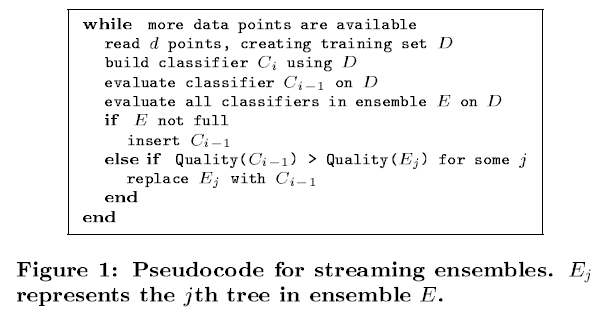

## Reacting to Different Types of Concept Drift:The Accuracy Updated Ensemble Algorithm (AUE2)

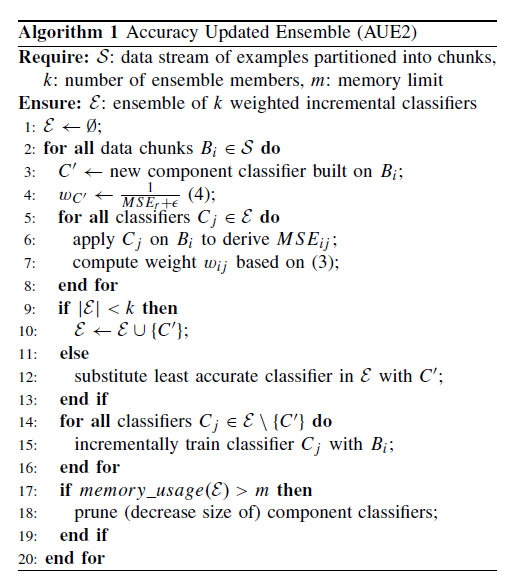

## Concept Drift Adaptation by Exploiting HistoricalKnowledge (DTEL)

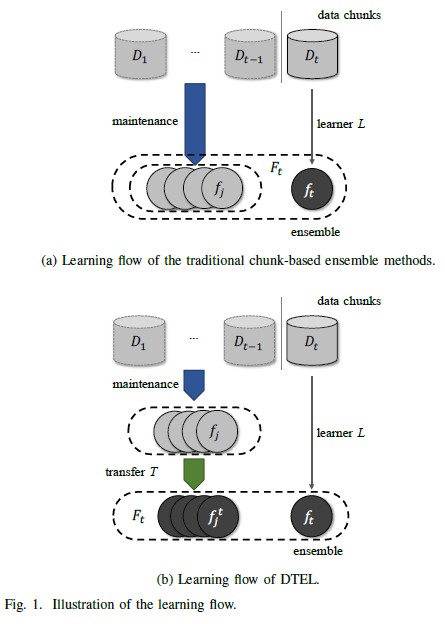

## Generative-CDTL

+ 사실 입력 $x_i$ 에서 어떤 feature가 시간에 따라 importance가 변하는지 알기 어렵다. trainset의 경우, bucket size가 크지 않을 수 있으며, 또한 I(z,b)가 분명하게 나타나지 않을 수도 있기 때문이다.
+ 따라서 아래와 같은 구조를 제안한다.
+ 실험3~4는 sensitive featrue z에 대해, G(z,b)으로 전처리 하였으나, 이번 구조는 모든 feature에 대하여 $G(x_i,b)$으로 전처리한다.
+ $I(x_i,b) > 0$ 인 feature는 G에 의해 전처리 될 것이고,$I(x_j,b) = 0$ 인 feature는 G에 의해 by-pass 되도록 학습될 것이다.

<pre>
x0 ------>|                     |- x'0 --> |                        |
x1 ------>|  Generator G(xi,b)  |- x'1 --> |                        |
x2 ------>|  (Adaptive model)   |- x'2 --> | Discriminator (D(x,g)) | -> y^
x3 ------>|                     |- x'3 --> | predictive model       |
z0 ------>|                     |- z'0 --> |                        |
                     ^
                     |
                     b
</pre>

$$
b = \{1,2,3,...N\} \in B
$$
$$
N << M
$$
$$
b_{norm} = b/M
\tag{17}
$$
$$
L_D = H(y,\hat{y}) = H(y,D(G(x_i,b_{norm})))=\mathbb{E}_{y}[-log(D(G(x_i,b_{norm})))]
\tag{21}
$$

$$
L_G = \sum_{i}MSE(G(x_i,b_{norm}),x_i)
\tag{22}
$$

$$
\min_{G(.)} L_D + L_G
\tag{23}
$$

$$
\min_{G(.)} L_D + L_G+ std(L_1,L_2)
\tag{24}
$$

# 실험
+ synthetic data를 만든다.
+ 해당 data는 data drift가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다.

## synthetic data의 생성 (Case #1 MI의 감소, Drift의 증가 )

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature z에 대해서 MI 감소, ks-test 통계량 증가



+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift

### Dataset 준비

In [24]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [25]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    #sns.scatterplot(x=x[:,ix],y=y)

In [26]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
#sns.scatterplot(x=x[0:200,4],y=y[0:200])
#sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

### 실험

MI Analysis MI Max 0.20278, Min 0.02707, Mean 0.09885, Std 0.06305
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


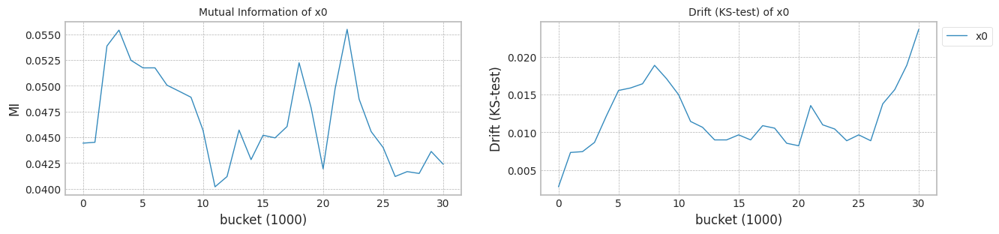

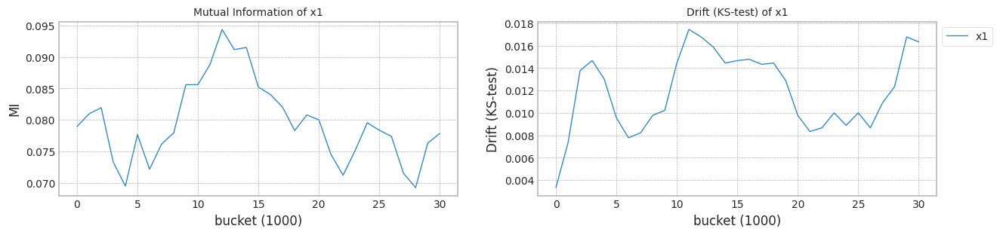

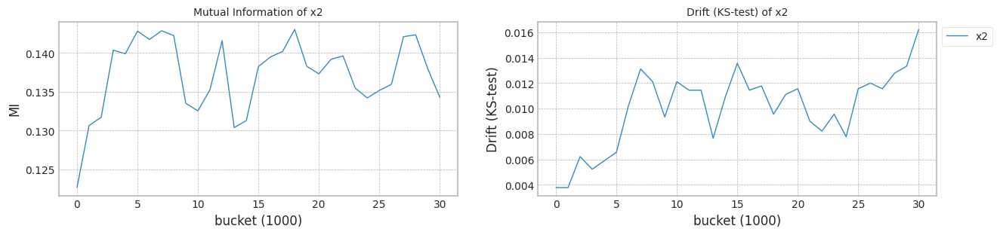

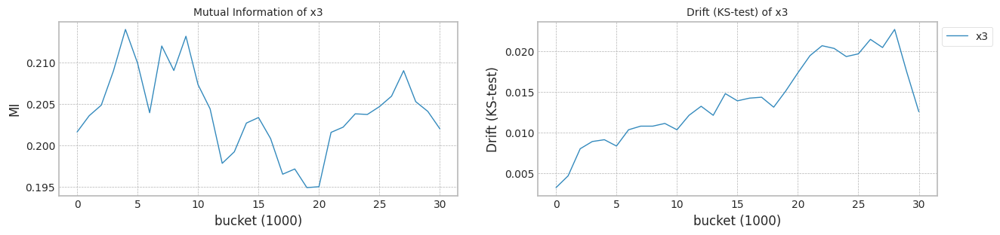

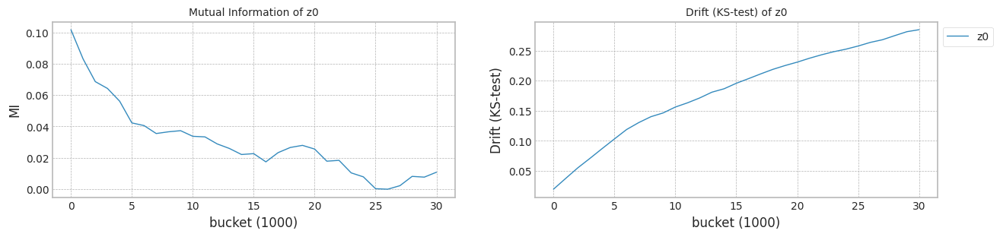

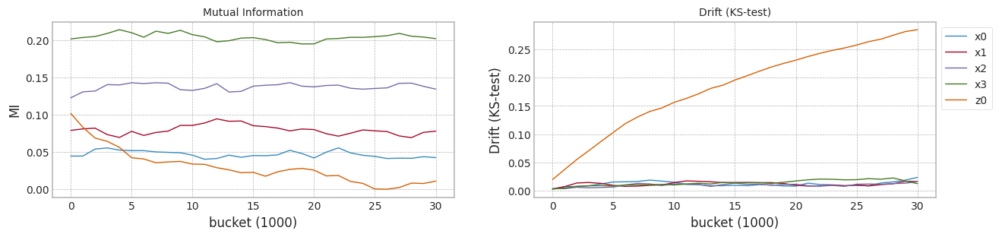

In [27]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
Y = y

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X, Y,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [42]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.366139,0
1,0.610533,0.420412,0.508390,0.580336,0.662926,0
2,0.556874,0.464734,0.669603,0.724770,0.486574,0
3,0.344341,0.646524,0.340976,0.528780,0.611850,0
4,0.503142,0.550860,0.598773,0.465698,0.487044,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.709407,39
39996,0.358451,0.483875,0.341855,0.574439,0.695384,39
39997,0.559469,0.343824,0.542547,0.575250,0.504288,39
39998,0.433692,0.530132,0.301231,0.282353,0.762158,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.43it/s]


Test f1 score: 0.9909926993457855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989694761955246
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.73it/s]


Test f1 score: 0.9954215948111408
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.054143
x1    0.036125
x2    0.029222
x3    0.106047
z0    0.112090
dtype: float64
Mean F1 for all data: 0.930530639925817
Normal model median        : 0.8989694761955246
Drift tolerant model median: 0.930530639925817
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 622.92it/s]


Test f1 score: 0.9909875723365904
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989576249229013
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.10it/s]


Test f1 score: 0.9979087452471483
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.09it/s]


mean of drift:
x0    0.071760
x1    0.071792
x2    0.075953
x3    0.052394
z0    0.094756
dtype: float64
Mean F1 for all data: 0.9457022958842308
Normal model median        : 0.898963550559213
Drift tolerant model median: 0.9381164679050239
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.42it/s]


Test f1 score: 0.9908013276434329
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.08it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8983627661702751
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.06it/s]


Test f1 score: 0.9970563099420758
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.138265
x1    0.037082
x2    0.018495
x3    0.058903
z0    0.073079
dtype: float64
Mean F1 for all data: 0.9196330961202115
Normal model median        : 0.8989576249229013
Drift tolerant model median: 0.930530639925817
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.86it/s]


Test f1 score: 0.9909944070528012
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988337822823614
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.79it/s]


Test f1 score: 0.9971477467199088
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.082111
x1    0.031552
x2    0.023423
x3    0.070491
z0    0.176903
dtype: float64
Mean F1 for all data: 0.916060767492406
Normal model median        : 0.8988957036026314
Drift tolerant model median: 0.9250818680230142
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.63it/s]


Test f1 score: 0.9909021986353299
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8991451389878478
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.21it/s]


Test f1 score: 0.997047900199981
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.074652
x1    0.021498
x2    0.026355
x3    0.350115
z0    0.080663
dtype: float64
Mean F1 for all data: 0.949159770356253
Normal model median        : 0.8989576249229013
Drift tolerant model median: 0.930530639925817
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 616.76it/s]


Test f1 score: 0.9911823267279796
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8991650213207394
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.33it/s]


Test f1 score: 0.9980039920159681
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.059753
x1    0.016677
x2    0.145004
x3    0.066176
z0    0.116846
dtype: float64
Mean F1 for all data: 0.916672743643268
Normal model median        : 0.898963550559213
Drift tolerant model median: 0.9250818680230142
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 619.20it/s]


Test f1 score: 0.990990990990991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.98it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8985478463360144
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.13it/s]


Test f1 score: 0.9980024731285075
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.081441
x1    0.024373
x2    0.027215
x3    0.068265
z0    0.188258
dtype: float64
Mean F1 for all data: 0.9310425856719159
Normal model median        : 0.8989576249229013
Drift tolerant model median: 0.930530639925817
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.92it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988895462608276
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 239.96it/s]


Test f1 score: 0.9979107312440645
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.073079
x1    0.016265
x2    0.012409
x3    0.357746
z0    0.068373
dtype: float64
Mean F1 for all data: 0.9393211935492665
Normal model median        : 0.8989235855918645
Drift tolerant model median: 0.9307866127988664
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 616.83it/s]


Test f1 score: 0.990990990990991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8986867650821286
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.62it/s]


Test f1 score: 0.997148288973384
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.072444
x1    0.013477
x2    0.070427
x3    0.361387
z0    0.081581
dtype: float64
Mean F1 for all data: 0.9485885825879513
Normal model median        : 0.8988895462608276
Drift tolerant model median: 0.9310425856719159
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.70it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.898833701553643
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.29it/s]


Test f1 score: 0.9980977743960433
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.091577
x1    0.026495
x2    0.014885
x3    0.056290
z0    0.089122
dtype: float64
Mean F1 for all data: 0.9391300705641823
Normal model median        : 0.8988616642715945
Drift tolerant model median: 0.935086328118049
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.33it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.01it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988908726445222
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.13it/s]


Test f1 score: 0.9964832240281342
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.092427
x1    0.032111
x2    0.022599
x3    0.017054
z0    0.115333
dtype: float64
Mean F1 for all data: 0.9286757297764378
Normal model median        : 0.8988895462608276
Drift tolerant model median: 0.9310425856719159
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.13it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989276516057924
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.44it/s]


Test f1 score: 0.9977164605137964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.087677
x1    0.050194
x2    0.022165
x3    0.065455
z0    0.154301
dtype: float64
Mean F1 for all data: 0.9014969968369391
Normal model median        : 0.898890209452675
Drift tolerant model median: 0.9307866127988664
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 593.65it/s]


Test f1 score: 0.9912796208530807
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.98it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8984573478541628
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.70it/s]


Test f1 score: 0.9971493728620296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.114057
x1    0.230907
x2    0.091272
x3    0.399470
z0    0.042247
dtype: float64
Mean F1 for all data: 0.9469718018817121
Normal model median        : 0.8988895462608276
Drift tolerant model median: 0.9310425856719159
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.65it/s]


Test f1 score: 0.990990990990991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.898718747043126
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.40it/s]


Test f1 score: 0.9973384030418251
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.065219
x1    0.040513
x2    0.064430
x3    0.070297
z0    0.127728
dtype: float64
Mean F1 for all data: 0.9245413049152086
Normal model median        : 0.8988616642715945
Drift tolerant model median: 0.9307866127988664
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 602.14it/s]


Test f1 score: 0.9907978370173609
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.96it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987939636379492
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.41it/s]


Test f1 score: 0.9970495859902921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.085118
x1    0.084412
x2    0.059552
x3    0.086419
z0    0.052201
dtype: float64
Mean F1 for all data: 0.9396517227023009
Normal model median        : 0.8988337822823614
Drift tolerant model median: 0.9310425856719159
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.92it/s]


Test f1 score: 0.991088357982556
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988315606449967
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.84it/s]


Test f1 score: 0.9977173292752521
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.086111
x1    0.076846
x2    0.022710
x3    0.025082
z0    0.097513
dtype: float64
Mean F1 for all data: 0.9376049732900023
Normal model median        : 0.8988337419180021
Drift tolerant model median: 0.9343237794809591
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 603.63it/s]


Test f1 score: 0.991088357982556
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.02it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988738455974927
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.39it/s]


Test f1 score: 0.9982886480319452
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.92it/s]


mean of drift:
x0    0.112452
x1    0.180072
x2    0.018208
x3    0.125652
z0    0.033480
dtype: float64
Mean F1 for all data: 0.9285038531522269
Normal model median        : 0.8988337822823614
Drift tolerant model median: 0.9310425856719159
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 617.72it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989276516057924
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.56it/s]


Test f1 score: 0.9980970504281638
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.072022
x1    0.019792
x2    0.021925
x3    0.045545
z0    0.113172
dtype: float64
Mean F1 for all data: 0.9389830244463548
Normal model median        : 0.8988538139399271
Drift tolerant model median: 0.9343237794809591
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 601.93it/s]


Test f1 score: 0.9909926993457855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.04it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989858533673062
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.31it/s]


Test f1 score: 0.9972477934896079
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.069011
x1    0.034247
x2    0.014986
x3    0.029068
z0    0.216090
dtype: float64
Mean F1 for all data: 0.8862352369747032
Normal model median        : 0.8988738455974927
Drift tolerant model median: 0.9310425856719159
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.19it/s]


Test f1 score: 0.9912779673871825
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8986012371576424
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.33it/s]


Test f1 score: 0.9971515381693885
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.087978
x1    0.069111
x2    0.033624
x3    0.140885
z0    0.070086
dtype: float64
Mean F1 for all data: 0.9207472632294788
Normal model median        : 0.8988538139399271
Drift tolerant model median: 0.9307866127988664
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.85it/s]


Early stop at  3573.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9309463667023609
SEA median: 0.9309463667023609
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.50it/s]


Early stop at  2322.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9097208364392462
AUE median: 0.9097208364392462
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


Early stop at  3115.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514902196024267
DTEL median: 0.9514902196024267
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.83it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9257962299056034
SEA median: 0.9283712983039821
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.84it/s]


Early stop at  3968.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9106046587123494
AUE median: 0.9101627475757978
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:16<00:00,  1.92it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515241973481674
DTEL median: 0.9515072084752971
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.77it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9381108598117645
SEA median: 0.9309463667023609
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.96it/s]


Early stop at  3464.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9140436936936527
AUE median: 0.9106046587123494
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.98it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512303680791537
DTEL median: 0.9514902196024267
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9277274277114619
SEA median: 0.9293368972069114
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.24it/s]


Early stop at  2990.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9085666258101525
AUE median: 0.9101627475757978
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.04it/s]


Early stop at  3467.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512249698255482
DTEL median: 0.9513602938407902
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.80it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9283827888250555
SEA median: 0.9283827888250555
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  3740.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9092933544872154
AUE median: 0.9097208364392462
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.99it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515105157978611
DTEL median: 0.9514902196024267
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  3891.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9318035282781786
SEA median: 0.9296645777637083
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.11it/s]


Early stop at  3067.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9104369022707499
AUE median: 0.910078869354998
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:16<00:00,  1.93it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9513181594246249
DTEL median: 0.9514041895135259
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.16it/s]


Early stop at  3276.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9371146464350808
SEA median: 0.9309463667023609
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.28it/s]


Early stop at  2737.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9144337716984197
AUE median: 0.9104369022707499
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.27it/s]


Early stop at  2366.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512486630616498
DTEL median: 0.9513181594246249
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.86it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9329922604319935
SEA median: 0.9313749474902697
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.03it/s]


Early stop at  3446.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9107278298502366
AUE median: 0.9105207804915496
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:16<00:00,  1.93it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515037187734162
DTEL median: 0.9514041895135259
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.98it/s]


Early stop at  3692.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9277324886315863
SEA median: 0.9309463667023609
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.38it/s]


Early stop at  2752.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9084256574023943
AUE median: 0.9104369022707499
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.98it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512894745629367
DTEL median: 0.9513181594246249
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.88it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9343642786988927
SEA median: 0.9313749474902697
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.29it/s]


Early stop at  2683.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9094405310969753
AUE median: 0.910078869354998
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.95it/s]


Early stop at  3579.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514928668300657
DTEL median: 0.9514041895135259
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.927036564860547
SEA median: 0.9309463667023609
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.11it/s]


Early stop at  3231.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9091981533621097
AUE median: 0.9097208364392462
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.18it/s]


Early stop at  2964.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.951437925567367
DTEL median: 0.951437925567367
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.85it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.93022820898907
SEA median: 0.9305872878457154
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.08it/s]


Early stop at  3248.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9021566187239004
AUE median: 0.9095806837681107
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.18it/s]


Early stop at  2913.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515231083015899
DTEL median: 0.9514640725848968
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.83it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9343315037082549
SEA median: 0.9309463667023609
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9120804932149065
AUE median: 0.9097208364392462
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.94it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9510417722044734
DTEL median: 0.951437925567367
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9314260400809835
SEA median: 0.9311862033916722
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.14it/s]


Early stop at  3307.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9086475238894708
AUE median: 0.9095806837681107
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


Early stop at  3181.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9513833847077383
DTEL median: 0.9514106551375526
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9227201409616949
SEA median: 0.9309463667023609
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.16it/s]


Early stop at  3077.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9090579567070066
AUE median: 0.9094405310969753
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.97it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514861017157081
DTEL median: 0.951437925567367
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  3954.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9252823880518956
SEA median: 0.9305872878457154
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.42it/s]


Early stop at  2625.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9071654388335244
AUE median: 0.9093669427920954
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515943406091751
DTEL median: 0.9514620136415375
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9260325324887183
SEA median: 0.93022820898907
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9096878276403941
AUE median: 0.9094405310969753
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.00it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514856768813698
DTEL median: 0.9514856768813698
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9312215566901662
SEA median: 0.9305872878457154
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.36it/s]


Early stop at  2679.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9095177485508077
AUE median: 0.9094791398238915
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.97it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514484837173798
DTEL median: 0.9514670802993748
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.10it/s]


Early stop at  3391.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.928938803522992
SEA median: 0.93022820898907
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.13it/s]


Early stop at  3317.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9098043370757661
AUE median: 0.9095177485508077
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.951620174973492
DTEL median: 0.9514856768813698
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9280237736208783
SEA median: 0.9295835062560309
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.11it/s]


Early stop at  3473.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.908201814198592
AUE median: 0.9094791398238915
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.05it/s]


Early stop at  3387.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9510162046058817
DTEL median: 0.9514670802993748


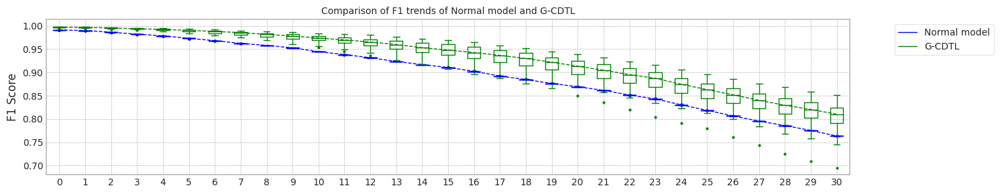

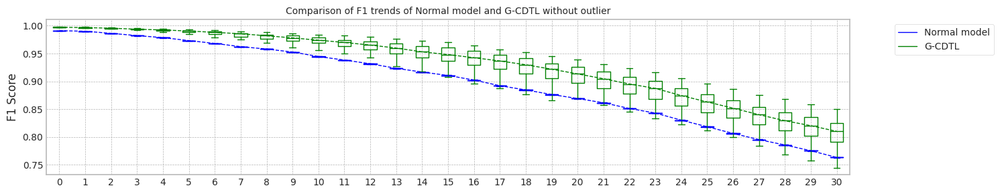

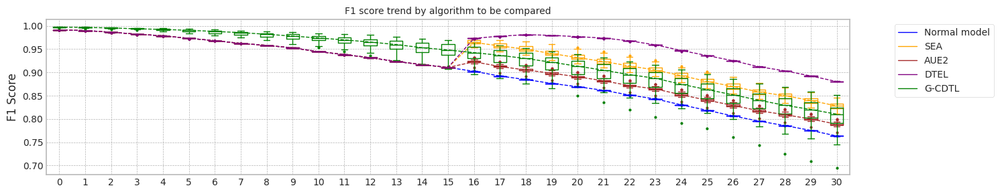

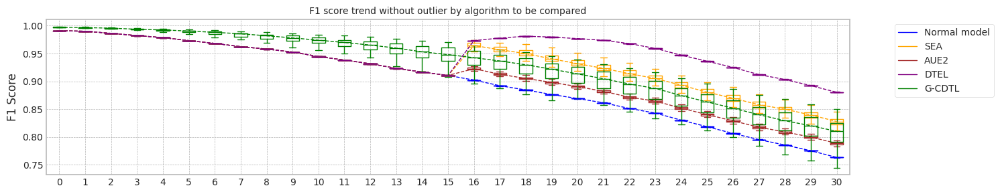

max_mean_trial= 4


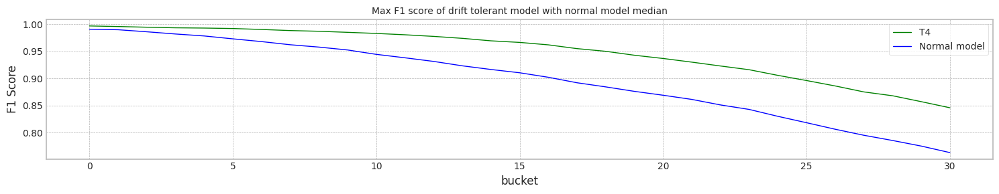

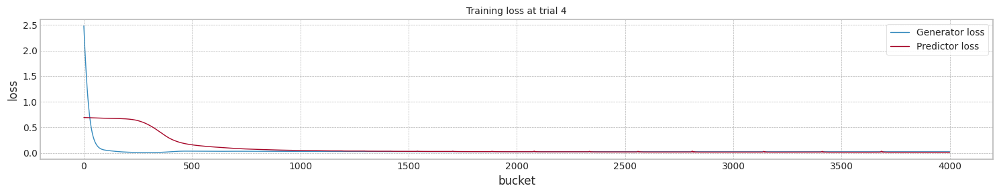

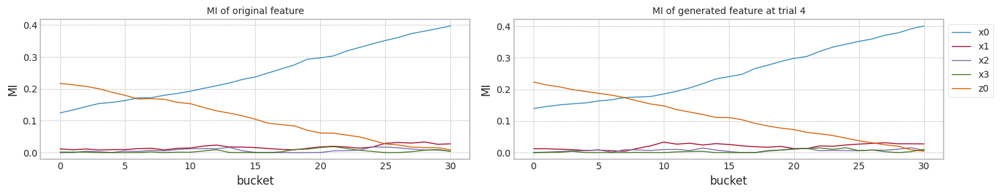

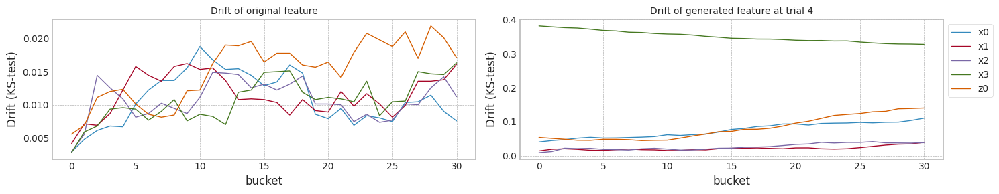

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990993,0.989979,0.898969,0.763477,6.123658
1,1.0,0.990988,0.990165,0.898958,0.763328,5.802918
2,2.0,0.990801,0.989597,0.898363,0.763009,6.143252
3,3.0,0.990994,0.989981,0.898834,0.763397,5.908319
4,4.0,0.990902,0.989794,0.899145,0.763754,6.088114
5,5.0,0.991182,0.989504,0.899165,0.763975,5.965379
6,6.0,0.990991,0.989880,0.898548,0.763139,6.263865
7,7.0,0.991087,0.990073,0.898890,0.763427,5.904452
8,8.0,0.990991,0.990073,0.898687,0.763158,6.121047
9,9.0,0.991087,0.990073,0.898834,0.763427,5.993229


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990993,0.989979,0.930946,0.829274,10.935716
1,1.0,0.990988,0.990165,0.925796,0.819517,10.996749
2,2.0,0.990801,0.989597,0.938111,0.846009,11.238308
3,3.0,0.990994,0.989981,0.927727,0.824061,10.838162
4,4.0,0.990902,0.989794,0.928383,0.825621,11.123747
5,5.0,0.991182,0.989504,0.931804,0.831655,10.840294
6,6.0,0.990991,0.989880,0.937115,0.843567,9.874607
7,7.0,0.991087,0.990073,0.932992,0.833749,10.901217
8,8.0,0.990991,0.990073,0.927732,0.822664,10.439991
9,9.0,0.991087,0.990073,0.934364,0.836856,10.823740


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990993,0.989979,0.909721,0.788955,8.904566
1,1.0,0.990988,0.990165,0.910605,0.791137,10.978212
2,2.0,0.990801,0.989597,0.914044,0.798237,10.536728
3,3.0,0.990994,0.989981,0.908567,0.786969,9.620100
4,4.0,0.990902,0.989794,0.909293,0.788594,10.605960
5,5.0,0.991182,0.989504,0.910437,0.790607,10.009907
6,6.0,0.990991,0.989880,0.914434,0.799057,9.490129
7,7.0,0.991087,0.990073,0.910728,0.791060,10.288858
8,8.0,0.990991,0.990073,0.908426,0.786720,9.222878
9,9.0,0.991087,0.990073,0.909441,0.788582,9.451833


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990993,0.989979,0.951490,0.880177,14.612848
1,1.0,0.990988,0.990165,0.951524,0.880274,16.228882
2,2.0,0.990801,0.989597,0.951230,0.880813,15.689188
3,3.0,0.990994,0.989981,0.951225,0.880371,15.256934
4,4.0,0.990902,0.989794,0.951511,0.880274,15.586980
5,5.0,0.991182,0.989504,0.951318,0.880239,16.122688
6,6.0,0.990991,0.989880,0.951249,0.880327,13.717827
7,7.0,0.991087,0.990073,0.951504,0.880513,16.130363
8,8.0,0.990991,0.990073,0.951289,0.880000,15.722204
9,9.0,0.991087,0.990073,0.951493,0.880671,15.914714


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.995422,0.994374,0.930531,0.809339,6.048965
1,1.0,0.997909,0.997340,0.945702,0.833841,6.136827
2,2.0,0.997056,0.996299,0.919633,0.778381,6.025135
3,3.0,0.997148,0.996293,0.916061,0.777992,5.882075
4,4.0,0.997048,0.996003,0.949160,0.846075,6.020188
5,5.0,0.998004,0.997439,0.916673,0.782943,5.958648
6,6.0,0.998002,0.996957,0.931043,0.811108,5.906587
7,7.0,0.997911,0.997153,0.939321,0.823449,6.100765
8,8.0,0.997148,0.996294,0.948589,0.850879,6.076001
9,9.0,0.998098,0.997243,0.939130,0.820595,5.942023


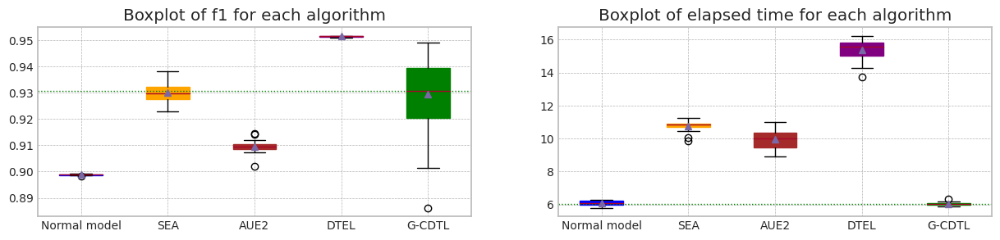

In [43]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20) #np.max(X1['b']+1))

## synthetic data의 생성 (Case #2 MI의 증감(상대적), Drift의 고정)

+ $P_t(y|X) \ne P_{t+w}(y|X)$ and $P_t(X) = P_{t+w}(X)$
+ Actual Drift
+ 즉, P(X)의 변화없이, Concept (본 Dataset에서 MI의 변화)만 변경


+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature에 대해 y의 비중이 시간에 따라 감소하도록 생성

### Dataset 준비

In [30]:
data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 2.5])

In [31]:
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

In [32]:
x1.shape

(40000, 5)

In [33]:
import matplotlib.pyplot as plt

seed_everything()

y1_array = []
cor_const = cor[4]
for ii in range(x1.shape[0]):
    cor[4] = cor[4] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    y1_array.append(np.sum(cor * x1[ii])+e)

In [34]:
m = 5 #np.mean(y1_array[0:2000])
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
print(sum(y1))

5
21325


### 실험

MI Analysis MI Max 0.22746, Min 0.00677, Mean 0.06988, Std 0.08433
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


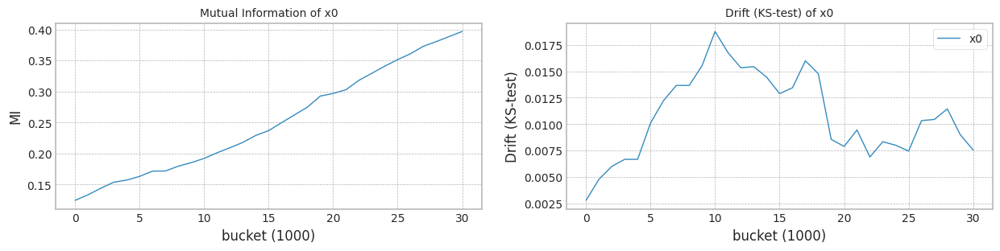

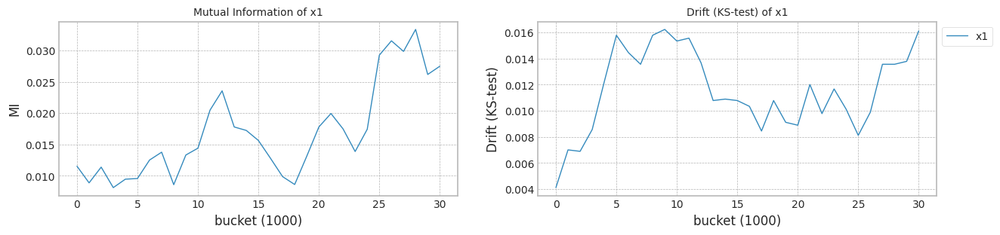

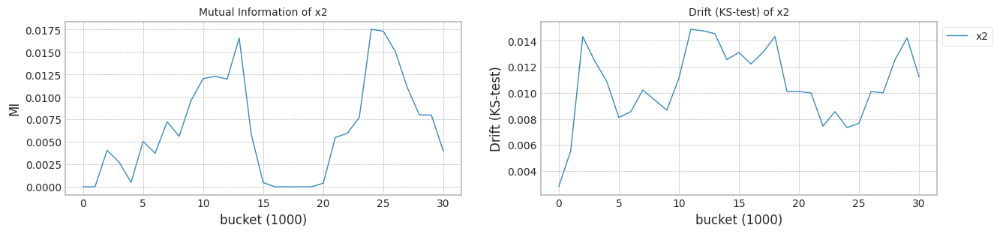

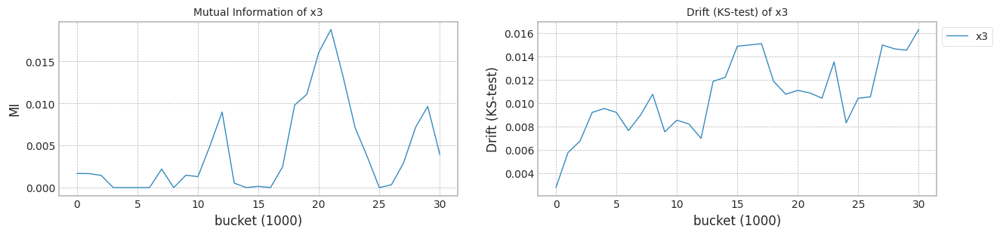

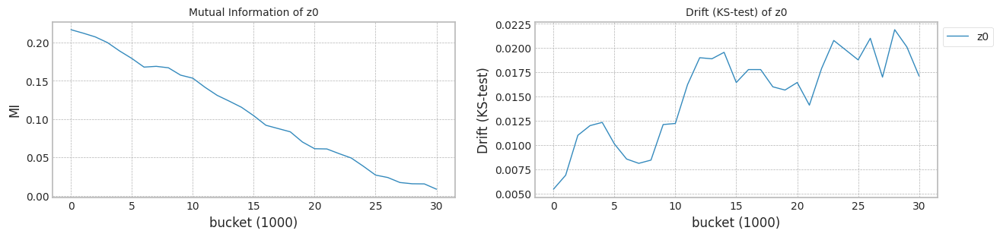

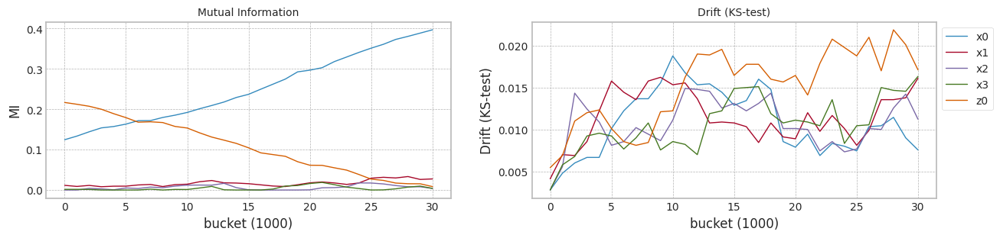

In [35]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [36]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.366139,0
1,0.610533,0.420412,0.508390,0.580336,0.662926,0
2,0.556874,0.464734,0.669603,0.724770,0.486574,0
3,0.344341,0.646524,0.340976,0.528780,0.611850,0
4,0.503142,0.550860,0.598773,0.465698,0.487044,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.709407,39
39996,0.358451,0.483875,0.341855,0.574439,0.695384,39
39997,0.559469,0.343824,0.542547,0.575250,0.504288,39
39998,0.433692,0.530132,0.301231,0.282353,0.762158,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 563.95it/s]


Test f1 score: 0.9909926993457855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.75it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989694761955246
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.11it/s]


Test f1 score: 0.9954215948111408
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.054143
x1    0.036125
x2    0.029222
x3    0.106047
z0    0.112090
dtype: float64
Mean F1 for all data: 0.930530639925817
Normal model median        : 0.8989694761955246
Drift tolerant model median: 0.930530639925817
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.95it/s]


Test f1 score: 0.9909875723365904
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989576249229013
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.80it/s]


Test f1 score: 0.9979087452471483
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.071760
x1    0.071792
x2    0.075953
x3    0.052394
z0    0.094756
dtype: float64
Mean F1 for all data: 0.9457022958842308
Normal model median        : 0.898963550559213
Drift tolerant model median: 0.9381164679050239
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.53it/s]


Test f1 score: 0.9908013276434329
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8983627661702751
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.97it/s]


Test f1 score: 0.9970563099420758
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.138265
x1    0.037082
x2    0.018495
x3    0.058903
z0    0.073079
dtype: float64
Mean F1 for all data: 0.9196330961202115
Normal model median        : 0.8989576249229013
Drift tolerant model median: 0.930530639925817
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.06it/s]


Test f1 score: 0.9909944070528012
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988337822823614
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.90it/s]


Test f1 score: 0.9971477467199088
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.082111
x1    0.031552
x2    0.023423
x3    0.070491
z0    0.176903
dtype: float64
Mean F1 for all data: 0.916060767492406
Normal model median        : 0.8988957036026314
Drift tolerant model median: 0.9250818680230142
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 599.62it/s]


Test f1 score: 0.9909021986353299
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8991451389878478
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.79it/s]


Test f1 score: 0.997047900199981
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.074652
x1    0.021498
x2    0.026355
x3    0.350115
z0    0.080663
dtype: float64
Mean F1 for all data: 0.949159770356253
Normal model median        : 0.8989576249229013
Drift tolerant model median: 0.930530639925817
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.44it/s]


Test f1 score: 0.9911823267279796
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8991650213207394
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.15it/s]


Test f1 score: 0.9980039920159681
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.059753
x1    0.016677
x2    0.145004
x3    0.066176
z0    0.116846
dtype: float64
Mean F1 for all data: 0.916672743643268
Normal model median        : 0.898963550559213
Drift tolerant model median: 0.9250818680230142
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.07it/s]


Test f1 score: 0.990990990990991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8985478463360144
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.29it/s]


Test f1 score: 0.9980024731285075
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.081441
x1    0.024373
x2    0.027215
x3    0.068265
z0    0.188258
dtype: float64
Mean F1 for all data: 0.9310425856719159
Normal model median        : 0.8989576249229013
Drift tolerant model median: 0.930530639925817
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.35it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988895462608276
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.43it/s]


Test f1 score: 0.9979107312440645
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.073079
x1    0.016265
x2    0.012409
x3    0.357746
z0    0.068373
dtype: float64
Mean F1 for all data: 0.9393211935492665
Normal model median        : 0.8989235855918645
Drift tolerant model median: 0.9307866127988664
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.47it/s]


Test f1 score: 0.990990990990991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8986867650821286
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.30it/s]


Test f1 score: 0.997148288973384
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.072444
x1    0.013477
x2    0.070427
x3    0.361387
z0    0.081581
dtype: float64
Mean F1 for all data: 0.9485885825879513
Normal model median        : 0.8988895462608276
Drift tolerant model median: 0.9310425856719159
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.12it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.898833701553643
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.42it/s]


Test f1 score: 0.9980977743960433
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.091577
x1    0.026495
x2    0.014885
x3    0.056290
z0    0.089122
dtype: float64
Mean F1 for all data: 0.9391300705641823
Normal model median        : 0.8988616642715945
Drift tolerant model median: 0.935086328118049
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.47it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988908726445222
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.73it/s]


Test f1 score: 0.9964832240281342
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.092427
x1    0.032111
x2    0.022599
x3    0.017054
z0    0.115333
dtype: float64
Mean F1 for all data: 0.9286757297764378
Normal model median        : 0.8988895462608276
Drift tolerant model median: 0.9310425856719159
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.02it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989276516057924
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.82it/s]


Test f1 score: 0.9977164605137964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.087677
x1    0.050194
x2    0.022165
x3    0.065455
z0    0.154301
dtype: float64
Mean F1 for all data: 0.9014969968369391
Normal model median        : 0.898890209452675
Drift tolerant model median: 0.9307866127988664
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.21it/s]


Test f1 score: 0.9912796208530807
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8984573478541628
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.21it/s]


Test f1 score: 0.9971493728620296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.114057
x1    0.230907
x2    0.091272
x3    0.399470
z0    0.042247
dtype: float64
Mean F1 for all data: 0.9469718018817121
Normal model median        : 0.8988895462608276
Drift tolerant model median: 0.9310425856719159
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.86it/s]


Test f1 score: 0.990990990990991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.898718747043126
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.94it/s]


Test f1 score: 0.9973384030418251
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.065219
x1    0.040513
x2    0.064430
x3    0.070297
z0    0.127728
dtype: float64
Mean F1 for all data: 0.9245413049152086
Normal model median        : 0.8988616642715945
Drift tolerant model median: 0.9307866127988664
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.66it/s]


Test f1 score: 0.9907978370173609
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987939636379492
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.23it/s]


Test f1 score: 0.9970495859902921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.085118
x1    0.084412
x2    0.059552
x3    0.086419
z0    0.052201
dtype: float64
Mean F1 for all data: 0.9396517227023009
Normal model median        : 0.8988337822823614
Drift tolerant model median: 0.9310425856719159
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.47it/s]


Test f1 score: 0.991088357982556
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988315606449967
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.27it/s]


Test f1 score: 0.9977173292752521
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.086111
x1    0.076846
x2    0.022710
x3    0.025082
z0    0.097513
dtype: float64
Mean F1 for all data: 0.9376049732900023
Normal model median        : 0.8988337419180021
Drift tolerant model median: 0.9343237794809591
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 615.95it/s]


Test f1 score: 0.991088357982556
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988738455974927
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.69it/s]


Test f1 score: 0.9982886480319452
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.09it/s]


mean of drift:
x0    0.112452
x1    0.180072
x2    0.018208
x3    0.125652
z0    0.033480
dtype: float64
Mean F1 for all data: 0.9285038531522269
Normal model median        : 0.8988337822823614
Drift tolerant model median: 0.9310425856719159
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.91it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989276516057924
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.21it/s]


Test f1 score: 0.9980970504281638
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.072022
x1    0.019792
x2    0.021925
x3    0.045545
z0    0.113172
dtype: float64
Mean F1 for all data: 0.9389830244463548
Normal model median        : 0.8988538139399271
Drift tolerant model median: 0.9343237794809591
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.63it/s]


Test f1 score: 0.9909926993457855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989858533673062
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.22it/s]


Test f1 score: 0.9972477934896079
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.069011
x1    0.034247
x2    0.014986
x3    0.029068
z0    0.216090
dtype: float64
Mean F1 for all data: 0.8862352369747032
Normal model median        : 0.8988738455974927
Drift tolerant model median: 0.9310425856719159
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.65it/s]


Test f1 score: 0.9912779673871825
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8986012371576424
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.25it/s]


Test f1 score: 0.9971515381693885
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.087978
x1    0.069111
x2    0.033624
x3    0.140885
z0    0.070086
dtype: float64
Mean F1 for all data: 0.9207472632294788
Normal model median        : 0.8988538139399271
Drift tolerant model median: 0.9307866127988664
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.03it/s]


Early stop at  3573.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9309463667023609
SEA median: 0.9309463667023609
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.57it/s]


Early stop at  2322.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9097208364392462
AUE median: 0.9097208364392462
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


Early stop at  3115.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514902196024267
DTEL median: 0.9514902196024267
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9257962299056034
SEA median: 0.9283712983039821
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.88it/s]


Early stop at  3968.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9106046587123494
AUE median: 0.9101627475757978
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.98it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515241973481674
DTEL median: 0.9515072084752971
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9381108598117645
SEA median: 0.9309463667023609
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.06it/s]


Early stop at  3464.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9140436936936527
AUE median: 0.9106046587123494
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.98it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512303680791537
DTEL median: 0.9514902196024267
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.82it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9277274277114619
SEA median: 0.9293368972069114
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.29it/s]


Early stop at  2990.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9085666258101525
AUE median: 0.9101627475757978
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.11it/s]


Early stop at  3467.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512249698255482
DTEL median: 0.9513602938407902
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9283827888250555
SEA median: 0.9283827888250555
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.96it/s]


Early stop at  3740.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9092933544872154
AUE median: 0.9097208364392462
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.98it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515105157978611
DTEL median: 0.9514902196024267
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  3891.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9318035282781786
SEA median: 0.9296645777637083
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.20it/s]


Early stop at  3067.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9104369022707499
AUE median: 0.910078869354998
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.01it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9513181594246249
DTEL median: 0.9514041895135259
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.19it/s]


Early stop at  3276.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9371146464350808
SEA median: 0.9309463667023609
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.36it/s]


Early stop at  2737.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9144337716984197
AUE median: 0.9104369022707499
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.29it/s]


Early stop at  2366.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512486630616498
DTEL median: 0.9513181594246249
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9329922604319935
SEA median: 0.9313749474902697
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.07it/s]


Early stop at  3446.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9107278298502366
AUE median: 0.9105207804915496
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.00it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515037187734162
DTEL median: 0.9514041895135259
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.00it/s]


Early stop at  3692.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9277324886315863
SEA median: 0.9309463667023609
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.37it/s]


Early stop at  2752.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9084256574023943
AUE median: 0.9104369022707499
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512894745629367
DTEL median: 0.9513181594246249
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9343642786988927
SEA median: 0.9313749474902697
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.35it/s]


Early stop at  2683.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9094405310969753
AUE median: 0.910078869354998
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  3579.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514928668300657
DTEL median: 0.9514041895135259
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.927036564860547
SEA median: 0.9309463667023609
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.10it/s]


Early stop at  3231.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9091981533621097
AUE median: 0.9097208364392462
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.16it/s]


Early stop at  2964.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.951437925567367
DTEL median: 0.951437925567367
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.93022820898907
SEA median: 0.9305872878457154
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.19it/s]


Early stop at  3248.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9021566187239004
AUE median: 0.9095806837681107
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.19it/s]


Early stop at  2913.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515231083015899
DTEL median: 0.9514640725848968
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9343315037082549
SEA median: 0.9309463667023609
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.84it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9120804932149065
AUE median: 0.9097208364392462
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.01it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9510417722044734
DTEL median: 0.951437925567367
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.93it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9314260400809835
SEA median: 0.9311862033916722
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.09it/s]


Early stop at  3307.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9086475238894708
AUE median: 0.9095806837681107
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.14it/s]


Early stop at  3181.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9513833847077383
DTEL median: 0.9514106551375526
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9227201409616949
SEA median: 0.9309463667023609
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.23it/s]


Early stop at  3077.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9090579567070066
AUE median: 0.9094405310969753
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.04it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514861017157081
DTEL median: 0.951437925567367
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  3954.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9252823880518956
SEA median: 0.9305872878457154
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.48it/s]


Early stop at  2625.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9071654388335244
AUE median: 0.9093669427920954
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.01it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515943406091751
DTEL median: 0.9514620136415375
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9260325324887183
SEA median: 0.93022820898907
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9096878276403941
AUE median: 0.9094405310969753
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514856768813698
DTEL median: 0.9514856768813698
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.95it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9312215566901662
SEA median: 0.9305872878457154
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.43it/s]


Early stop at  2679.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9095177485508077
AUE median: 0.9094791398238915
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514484837173798
DTEL median: 0.9514670802993748
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.10it/s]


Early stop at  3391.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.928938803522992
SEA median: 0.93022820898907
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.08it/s]


Early stop at  3317.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9098043370757661
AUE median: 0.9095177485508077
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.951620174973492
DTEL median: 0.9514856768813698
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9280237736208783
SEA median: 0.9295835062560309
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.02it/s]


Early stop at  3473.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.908201814198592
AUE median: 0.9094791398238915
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


Early stop at  3387.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9510162046058817
DTEL median: 0.9514670802993748


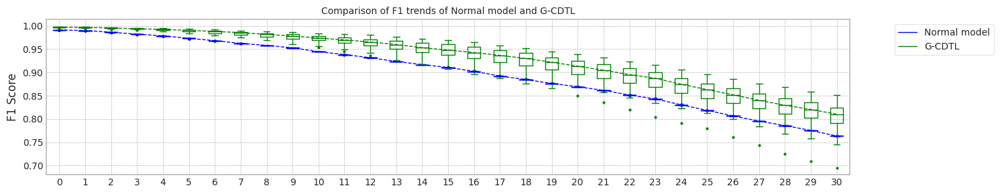

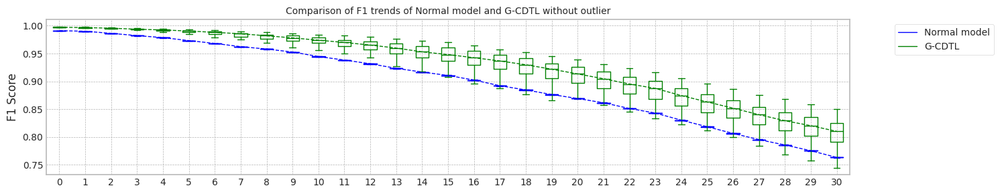

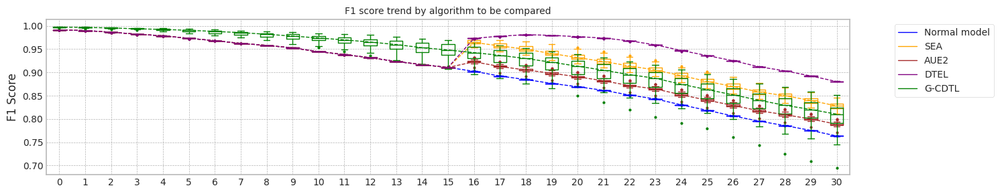

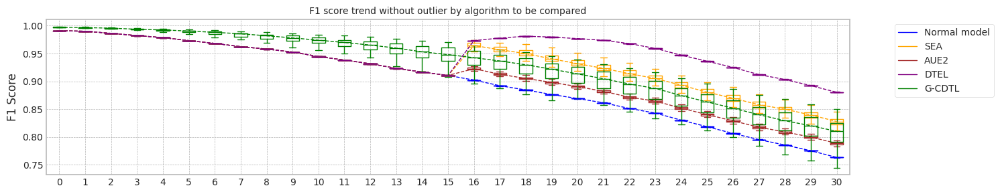

max_mean_trial= 4


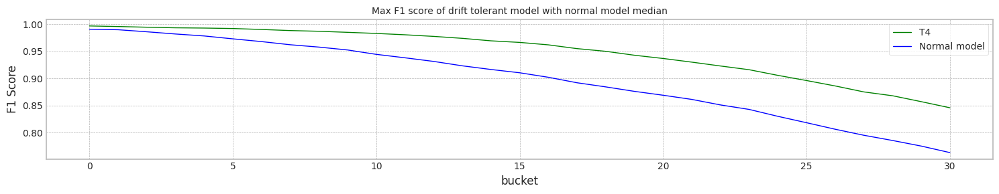

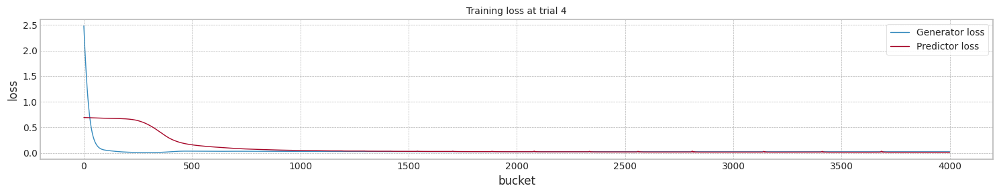

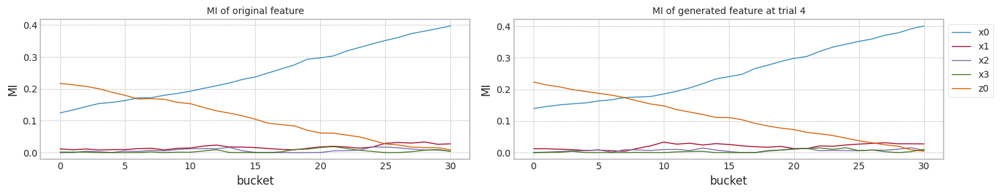

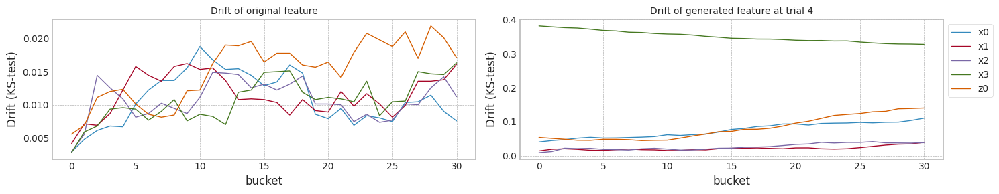

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990993,0.989979,0.898969,0.763477,6.573668
1,1.0,0.990988,0.990165,0.898958,0.763328,5.912051
2,2.0,0.990801,0.989597,0.898363,0.763009,5.872749
3,3.0,0.990994,0.989981,0.898834,0.763397,5.835211
4,4.0,0.990902,0.989794,0.899145,0.763754,5.837460
5,5.0,0.991182,0.989504,0.899165,0.763975,5.932287
6,6.0,0.990991,0.989880,0.898548,0.763139,5.948176
7,7.0,0.991087,0.990073,0.898890,0.763427,5.851864
8,8.0,0.990991,0.990073,0.898687,0.763158,5.856018
9,9.0,0.991087,0.990073,0.898834,0.763427,5.745174


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990993,0.989979,0.930946,0.829274,10.272577
1,1.0,0.990988,0.990165,0.925796,0.819517,10.754245
2,2.0,0.990801,0.989597,0.938111,0.846009,10.725118
3,3.0,0.990994,0.989981,0.927727,0.824061,11.023420
4,4.0,0.990902,0.989794,0.928383,0.825621,10.687608
5,5.0,0.991182,0.989504,0.931804,0.831655,10.736576
6,6.0,0.990991,0.989880,0.937115,0.843567,9.765623
7,7.0,0.991087,0.990073,0.932992,0.833749,10.768924
8,8.0,0.990991,0.990073,0.927732,0.822664,10.390390
9,9.0,0.991087,0.990073,0.934364,0.836856,10.865364


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990993,0.989979,0.909721,0.788955,8.727665
1,1.0,0.990988,0.990165,0.910605,0.791137,10.812537
2,2.0,0.990801,0.989597,0.914044,0.798237,10.167252
3,3.0,0.990994,0.989981,0.908567,0.786969,9.472490
4,4.0,0.990902,0.989794,0.909293,0.788594,10.517575
5,5.0,0.991182,0.989504,0.910437,0.790607,9.740413
6,6.0,0.990991,0.989880,0.914434,0.799057,9.268330
7,7.0,0.991087,0.990073,0.910728,0.791060,10.138470
8,8.0,0.990991,0.990073,0.908426,0.786720,9.253307
9,9.0,0.991087,0.990073,0.909441,0.788582,9.306215


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990993,0.989979,0.951490,0.880177,14.601882
1,1.0,0.990988,0.990165,0.951524,0.880274,15.728390
2,2.0,0.990801,0.989597,0.951230,0.880813,15.730999
3,3.0,0.990994,0.989981,0.951225,0.880371,14.740643
4,4.0,0.990902,0.989794,0.951511,0.880274,15.706680
5,5.0,0.991182,0.989504,0.951318,0.880239,15.486723
6,6.0,0.990991,0.989880,0.951249,0.880327,13.587374
7,7.0,0.991087,0.990073,0.951504,0.880513,15.555195
8,8.0,0.990991,0.990073,0.951289,0.880000,15.413036
9,9.0,0.991087,0.990073,0.951493,0.880671,15.298866


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.995422,0.994374,0.930531,0.809339,5.867946
1,1.0,0.997909,0.997340,0.945702,0.833841,5.835328
2,2.0,0.997056,0.996299,0.919633,0.778381,5.842776
3,3.0,0.997148,0.996293,0.916061,0.777992,5.950222
4,4.0,0.997048,0.996003,0.949160,0.846075,5.946670
5,5.0,0.998004,0.997439,0.916673,0.782943,5.859211
6,6.0,0.998002,0.996957,0.931043,0.811108,5.799862
7,7.0,0.997911,0.997153,0.939321,0.823449,5.838653
8,8.0,0.997148,0.996294,0.948589,0.850879,5.868465
9,9.0,0.998098,0.997243,0.939130,0.820595,5.867128


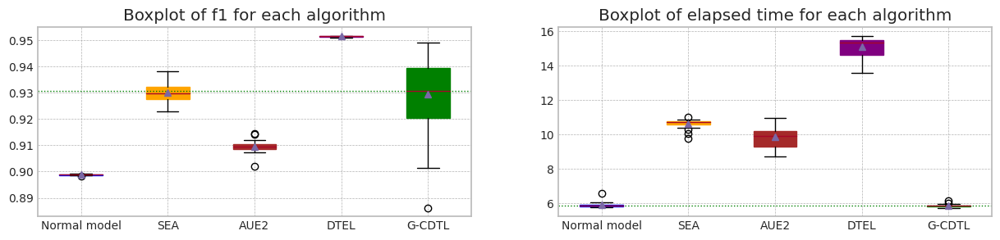

In [44]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20) #np.max(X1['b']+1))

## synthetic data의 생성 (Case #3 MI의 증감(상대적), Drift의 증가)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature $z_0$에 대해서 MI 증가, ks-test 통계량 증가
+ 이에따라 $X_0$의 MI 감소

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift, MI는 고정

### Dataset 준비

In [80]:
import matplotlib.pyplot as plt

cor = np.asarray([2.5, 1.2, 0.9 , 0.7, 1.5])

seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

seed_everything()

y1_array = []
cor_const = cor[0]
for ii in range(x1.shape[0]):
    cor[0] = cor[0] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 1.0)
    e1 = np.random.normal(0.0,  4*ii/40000)
    x1[ii,4] = x1[ii,4] + e1
    y1_array.append(np.sum(cor * x1[ii])+e)

In [81]:
m = np.mean(y1_array)
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
sum(y1)

5.563076837122426


19931

### 실험

MI Analysis MI Max 0.21053, Min 0.00413, Mean 0.06759, Std 0.07940
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


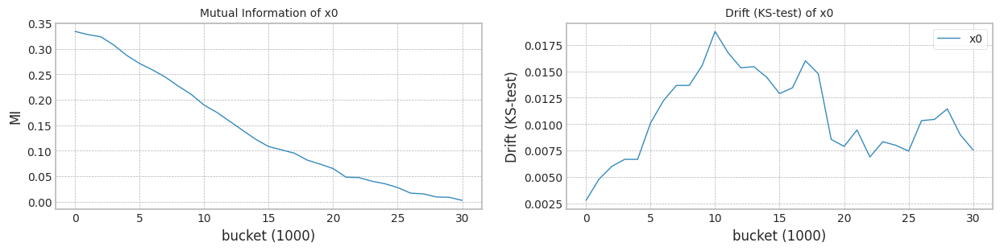

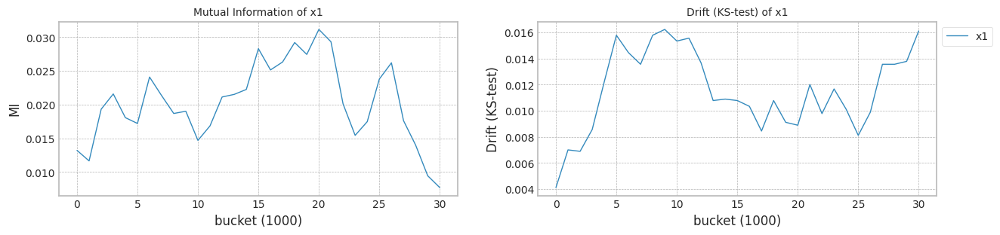

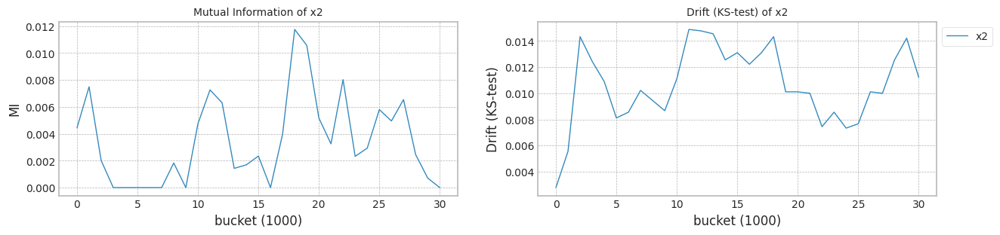

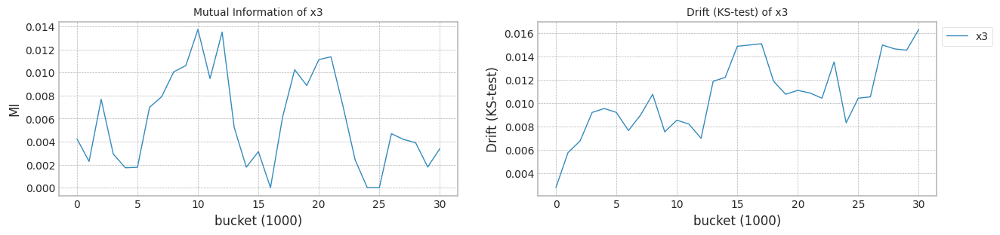

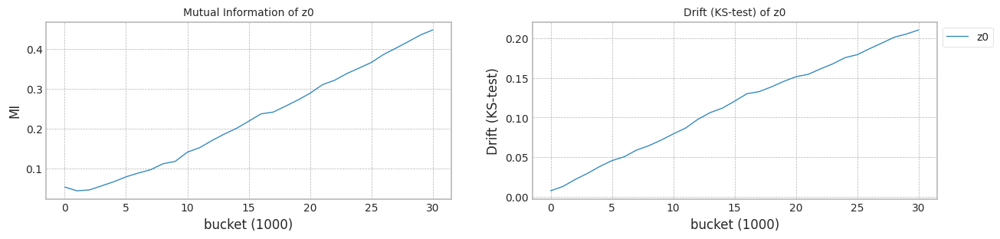

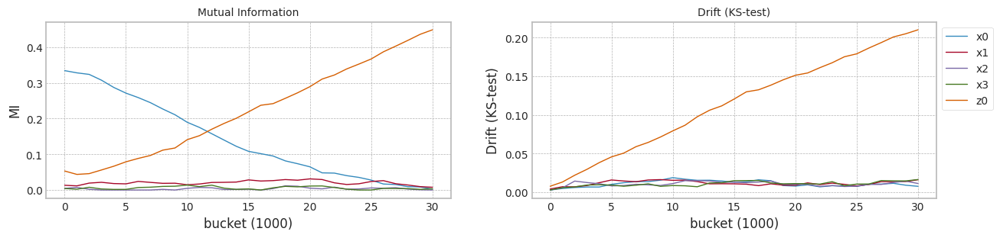

In [82]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)

In [83]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.348766,0
1,0.610533,0.420412,0.508390,0.580336,0.603602,0
2,0.556874,0.464734,0.669603,0.724770,0.452177,0
3,0.344341,0.646524,0.340976,0.528780,0.559737,0
4,0.503142,0.550860,0.598773,0.465698,0.452611,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.612303,39
39996,0.358451,0.483875,0.341855,0.574439,0.395651,39
39997,0.559469,0.343824,0.542547,0.575250,0.268402,39
39998,0.433692,0.530132,0.301231,0.282353,0.347175,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.85it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750341105531221
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.10it/s]


Test f1 score: 0.9527802735349906
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.077337
x1    0.035649
x2    0.013892
x3    0.108161
z0    0.128358
dtype: float64
Mean F1 for all data: 0.9030241437959154
Normal model median        : 0.8750341105531221
Drift tolerant model median: 0.9030241437959154
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.04it/s]


Test f1 score: 0.9519077901430842
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750280335556277
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.11it/s]


Test f1 score: 0.9530642750373691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.059864
x1    0.215405
x2    0.064835
x3    0.085007
z0    0.125652
dtype: float64
Mean F1 for all data: 0.8871834232663434
Normal model median        : 0.8750310720543749
Drift tolerant model median: 0.8951037835311294
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 621.96it/s]


Test f1 score: 0.9523904184474704
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750300297276461
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.70it/s]


Test f1 score: 0.9533771667662881
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.068624
x1    0.050799
x2    0.037315
x3    0.119233
z0    0.121125
dtype: float64
Mean F1 for all data: 0.8985808408576865
Normal model median        : 0.8750300297276461
Drift tolerant model median: 0.8985808408576865
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.51it/s]


Test f1 score: 0.9525134114842042
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8749829532446904
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 261.61it/s]


Test f1 score: 0.9523619693043651
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.081358
x1    0.014204
x2    0.062642
x3    0.012373
z0    0.139047
dtype: float64
Mean F1 for all data: 0.9040043594657216
Normal model median        : 0.8750290316416369
Drift tolerant model median: 0.900802492326801
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.26it/s]


Test f1 score: 0.9520405123622282
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8748040782122101
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.37it/s]


Test f1 score: 0.9535856573705179
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.034014
x1    0.049595
x2    0.032799
x3    0.073581
z0    0.138373
dtype: float64
Mean F1 for all data: 0.884944033155335
Normal model median        : 0.8750280335556277
Drift tolerant model median: 0.8985808408576865
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.17it/s]


Test f1 score: 0.9521540599563232
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.874647382944926
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 260.09it/s]


Test f1 score: 0.9526373516801276
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.070935
x1    0.062642
x2    0.041294
x3    0.046631
z0    0.138000
dtype: float64
Mean F1 for all data: 0.9056149330217873
Normal model median        : 0.8750054934001591
Drift tolerant model median: 0.900802492326801
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.79it/s]


Test f1 score: 0.9522011328629634
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8748543214880757
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.05it/s]


Test f1 score: 0.9530080814127506
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.050860
x1    0.015409
x2    0.016409
x3    0.081326
z0    0.128047
dtype: float64
Mean F1 for all data: 0.8976422693068584
Normal model median        : 0.8749829532446904
Drift tolerant model median: 0.8985808408576865
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.29it/s]


Test f1 score: 0.9520214562431707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.874932808165993
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.21it/s]


Test f1 score: 0.9547529271680889
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.056724
x1    0.023262
x2    0.028283
x3    0.122172
z0    0.125025
dtype: float64
Mean F1 for all data: 0.897492816034086
Normal model median        : 0.8749578807053418
Drift tolerant model median: 0.8981115550822725
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.49it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750563113790598
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.56it/s]


Test f1 score: 0.9545544750942647
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.075824
x1    0.028871
x2    0.412430
x3    0.497140
z0    0.105839
dtype: float64
Mean F1 for all data: 0.8990140791991214
Normal model median        : 0.8749829532446904
Drift tolerant model median: 0.8985808408576865
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.40it/s]


Test f1 score: 0.9526838966202783
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8748734174973044
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.76it/s]


Test f1 score: 0.9534767383691847
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.083491
x1    0.529746
x2    0.060692
x3    0.045065
z0    0.140950
dtype: float64
Mean F1 for all data: 0.7816032373555257
Normal model median        : 0.8749578807053418
Drift tolerant model median: 0.8981115550822725
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.14it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750980706267008
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.11it/s]


Test f1 score: 0.9532542609389018
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.079122
x1    0.028699
x2    0.050527
x3    0.137065
z0    0.129287
dtype: float64
Mean F1 for all data: 0.9093142282674948
Normal model median        : 0.8749829532446904
Drift tolerant model median: 0.8985808408576865
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.97it/s]


Test f1 score: 0.9522391023731507
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8749364507709388
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 262.41it/s]


Test f1 score: 0.9542144638403991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.031154
x1    0.027978
x2    0.010624
x3    0.112846
z0    0.126670
dtype: float64
Mean F1 for all data: 0.8897978719768329
Normal model median        : 0.8749597020078146
Drift tolerant model median: 0.8981115550822725
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.43it/s]


Test f1 score: 0.9519364448857993
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8744977262311201
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.57it/s]


Test f1 score: 0.9534930139720558
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.089326
x1    0.528584
x2    0.082057
x3    0.115961
z0    0.108835
dtype: float64
Mean F1 for all data: 0.7788292459803504
Normal model median        : 0.8749364507709388
Drift tolerant model median: 0.8976422693068584
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.00it/s]


Test f1 score: 0.952399880751267
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8749573813439233
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.58it/s]


Test f1 score: 0.9542327250972181
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.047118
x1    0.015792
x2    0.036444
x3    0.096720
z0    0.132434
dtype: float64
Mean F1 for all data: 0.897421427605099
Normal model median        : 0.874946916057431
Drift tolerant model median: 0.8975675426704722
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.46it/s]


Test f1 score: 0.9519077901430842
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750295276556932
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.73it/s]


Test f1 score: 0.9538583929992045
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.086401
x1    0.026065
x2    0.045581
x3    0.083108
z0    0.134004
dtype: float64
Mean F1 for all data: 0.8989758446941969
Normal model median        : 0.8749573813439233
Drift tolerant model median: 0.8976422693068584
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.46it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.875044532233886
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.55it/s]


Test f1 score: 0.9530642750373691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.071735
x1    0.455505
x2    0.078455
x3    0.069290
z0    0.117821
dtype: float64
Mean F1 for all data: 0.8643109537120346
Normal model median        : 0.8749701672943069
Drift tolerant model median: 0.8975675426704722
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.39it/s]


Test f1 score: 0.9517844716174569
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750645706690515
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 262.48it/s]


Test f1 score: 0.9531218831039298
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.078832
x1    0.403308
x2    0.022946
x3    0.119462
z0    0.139724
dtype: float64
Mean F1 for all data: 0.852624487817591
Normal model median        : 0.8749829532446904
Drift tolerant model median: 0.897492816034086
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.65it/s]


Test f1 score: 0.9524187940796662
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8748428988590549
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.40it/s]


Test f1 score: 0.9543197616683219
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.052495
x1    0.047140
x2    0.048731
x3    0.265176
z0    0.127333
dtype: float64
Mean F1 for all data: 0.8980781882474829
Normal model median        : 0.8749701672943069
Drift tolerant model median: 0.8975675426704722
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.47it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.875044532233886
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.59it/s]


Test f1 score: 0.9531592585210286
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.057208
x1    0.228168
x2    0.037065
x3    0.097369
z0    0.119366
dtype: float64
Mean F1 for all data: 0.8917244010221348
Normal model median        : 0.8749829532446904
Drift tolerant model median: 0.897492816034086
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.86it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750081941637008
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.40it/s]


Test f1 score: 0.9538522874514105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.097219
x1    0.037624
x2    0.045229
x3    0.059434
z0    0.139882
dtype: float64
Mean F1 for all data: 0.8977837853128813
Normal model median        : 0.8749955737041957
Drift tolerant model median: 0.8975675426704722
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.77it/s]


Early stop at  2078.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8965739888224381
SEA median: 0.8965739888224381
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.95it/s]


Early stop at  1803.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8851816817910918
AUE median: 0.8851816817910918
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.54it/s]


Early stop at  1584.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9213477129648532
DTEL median: 0.9213477129648532
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.27it/s]


Early stop at  1240.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8961448309240391
SEA median: 0.8963594098732386
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.49it/s]


Early stop at  2610.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.885049376586353
AUE median: 0.8851155291887224
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.37it/s]


Early stop at  2358.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9213811901752037
DTEL median: 0.9213644515700284
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.08it/s]


Early stop at  1429.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8954096064592028
SEA median: 0.8961448309240391
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.00it/s]


Early stop at  1629.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8851337637530371
AUE median: 0.8851337637530371
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.35it/s]


Early stop at  2381.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9213686015651974
DTEL median: 0.9213686015651974
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.25it/s]


Early stop at  3129.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.892932525246006
SEA median: 0.8957772186916209
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.91it/s]


Early stop at  1744.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8864665125479879
AUE median: 0.8851577227720644
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.57it/s]


Early stop at  1397.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9200953377682212
DTEL median: 0.9213581572650253
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.72it/s]


Early stop at  2198.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.900549422435996
SEA median: 0.8961448309240391
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.60it/s]


Early stop at  2417.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8862927275786076
AUE median: 0.8851816817910918
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.51it/s]


Early stop at  1615.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9207852143719452
DTEL median: 0.9213477129648532
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


Early stop at  174.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8747865844887441
SEA median: 0.8957772186916209
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.74it/s]


Early stop at  2134.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8859900740662715
AUE median: 0.8855858779286816
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.06it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.918764403795049
DTEL median: 0.9210664636683992
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.89it/s]


Early stop at  1981.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9008233901200025
SEA median: 0.8961448309240391
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.12it/s]


Early stop at  1429.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8865160188685551
AUE median: 0.8859900740662715
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.50it/s]


Early stop at  1556.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9204290347874935
DTEL median: 0.9207852143719452
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.27it/s]


Early stop at  1252.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8955496944703759
SEA median: 0.8958472626972075
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.99it/s]


Early stop at  1638.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.884959801858087
AUE median: 0.8855858779286816
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.59it/s]


Early stop at  1375.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9214266142854343
DTEL median: 0.9210664636683992
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.53it/s]


Early stop at  2655.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8968014178900008
SEA median: 0.8961448309240391
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.62it/s]


Early stop at  2347.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8850523111026659
AUE median: 0.8851816817910918
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.40it/s]


Early stop at  2089.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9214253981446512
DTEL median: 0.9213477129648532
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.93it/s]


Early stop at  1718.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8959885559502375
SEA median: 0.8960666934371383
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.59it/s]


Early stop at  2388.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8851998852906982
AUE median: 0.885190783540895
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.58it/s]


Early stop at  1451.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9214344730740331
DTEL median: 0.9213581572650253
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.06it/s]


Early stop at  3570.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.896852303394271
SEA median: 0.8961448309240391
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.93it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8842323562636741
AUE median: 0.8851816817910918
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.48it/s]


Early stop at  1710.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9211979232526958
DTEL median: 0.9213477129648532
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.63it/s]


Early stop at  2289.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8978292388993577
SEA median: 0.8963594098732386
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.93it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8854150767272977
AUE median: 0.885190783540895
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.40it/s]


Early stop at  2039.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9199896822092575
DTEL median: 0.9212728181087745
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.34it/s]


Early stop at  3051.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9000980358615954
SEA median: 0.8965739888224381
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.95it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8850059152550834
AUE median: 0.8851816817910918
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.42it/s]


Early stop at  2066.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9193754590504972
DTEL median: 0.9211979232526958
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.32it/s]


Early stop at  1164.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8958427271432623
SEA median: 0.8963594098732386
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.93it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8840219586062855
AUE median: 0.8851577227720644
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.53it/s]


Early stop at  1504.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9213435137509353
DTEL median: 0.9212707185018155
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.97it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8967095284809555
SEA median: 0.8965739888224381
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.17it/s]


Early stop at  1247.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8850681465173135
AUE median: 0.8851337637530371
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.36it/s]


Early stop at  2344.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9202023111577996
DTEL median: 0.9211979232526958
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.50it/s]


Early stop at  2565.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8962756884477119
SEA median: 0.896424838635075
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.94it/s]


Early stop at  1759.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8850861789500217
AUE median: 0.8851099713515294
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.34it/s]


Early stop at  2332.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9213369784894166
DTEL median: 0.9212674508710562
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.07it/s]


Early stop at  1524.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8958864466261723
SEA median: 0.8962756884477119
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.73it/s]


Early stop at  2036.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.885110012643518
AUE median: 0.885110012643518
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.40it/s]


Early stop at  2067.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9211504024939653
DTEL median: 0.9211979232526958
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.78it/s]


Early stop at  2050.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8962391245708974
SEA median: 0.8962574065093046
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.78it/s]


Early stop at  2002.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8851659147705289
AUE median: 0.8851218881982775
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.34it/s]


Early stop at  2393.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9207167720096184
DTEL median: 0.9211741628733305
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.71it/s]


Early stop at  2252.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8962756884477119
SEA median: 0.8962756884477119
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.68it/s]


Early stop at  2134.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8850280562910785
AUE median: 0.885110012643518
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.32it/s]


Early stop at  2132.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212504317626182
DTEL median: 0.9211979232526958
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.19it/s]


Early stop at  1215.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8957544409919449
SEA median: 0.8962574065093046
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.52it/s]


Early stop at  2326.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8849961854667228
AUE median: 0.8850980957967698
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.50it/s]


Early stop at  1517.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9200567513733336
DTEL median: 0.9211741628733305


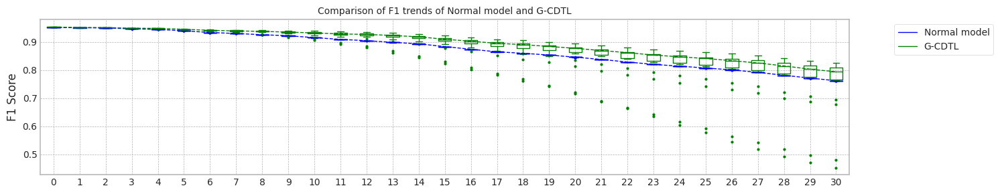

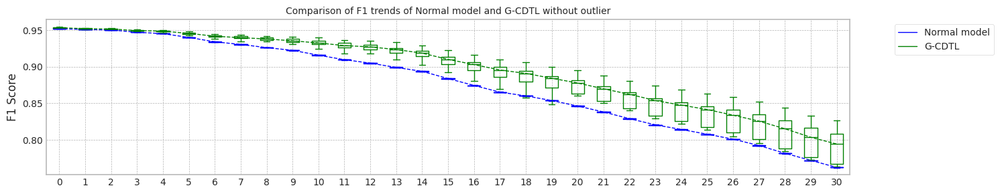

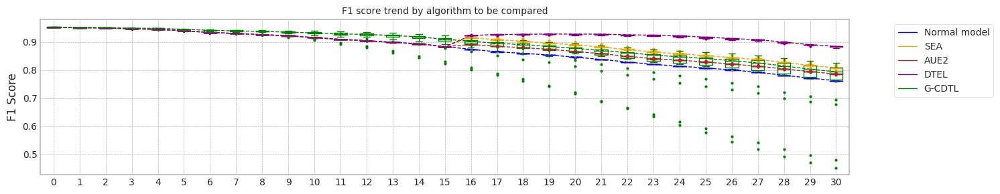

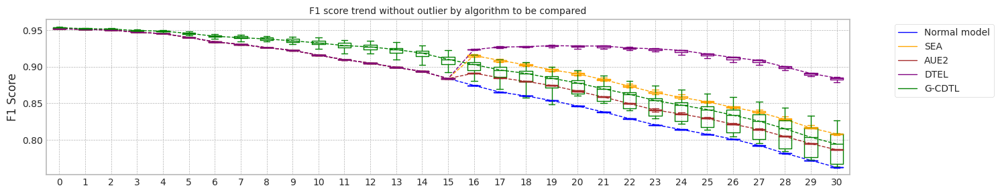

max_mean_trial= 10


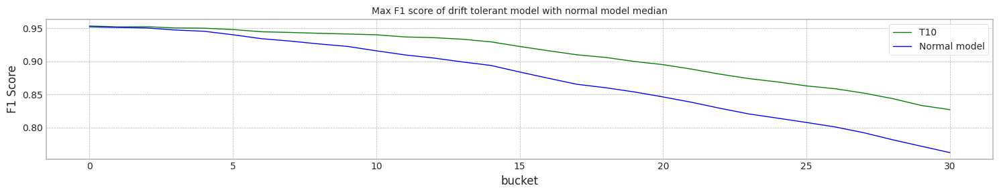

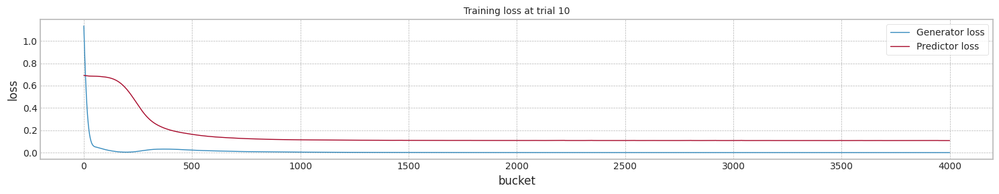

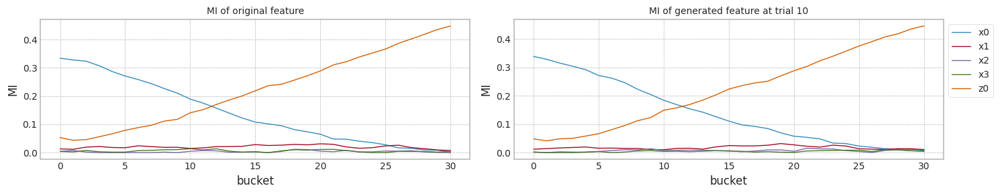

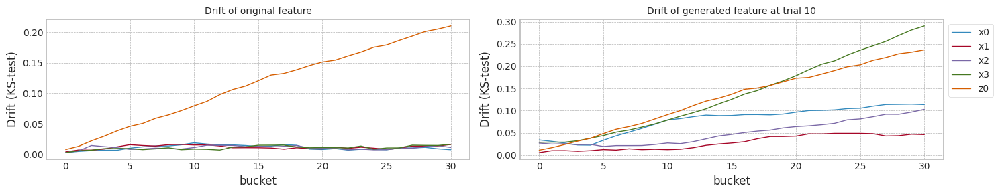

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951813,0.950859,0.875034,0.762416,5.825094
1,1.0,0.951908,0.950953,0.875028,0.762278,5.864233
2,2.0,0.952390,0.951530,0.875030,0.762480,5.739982
3,3.0,0.952513,0.951454,0.874983,0.762395,5.699576
4,4.0,0.952041,0.950982,0.874804,0.762278,5.803733
5,5.0,0.952154,0.950888,0.874647,0.762160,5.716583
6,6.0,0.952201,0.951435,0.874854,0.762033,5.698425
7,7.0,0.952021,0.951161,0.874933,0.762363,5.891667
8,8.0,0.951813,0.950859,0.875056,0.762363,5.745533
9,9.0,0.952684,0.951624,0.874873,0.762171,5.806307


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951813,0.950859,0.896574,0.808237,8.266632
1,1.0,0.951908,0.950953,0.896145,0.807529,7.302684
2,2.0,0.952390,0.951530,0.895410,0.806422,7.634535
3,3.0,0.952513,0.951454,0.892933,0.800410,9.599983
4,4.0,0.952041,0.950982,0.900549,0.817569,8.378173
5,5.0,0.952154,0.950888,0.874787,0.762417,5.969037
6,6.0,0.952201,0.951435,0.900823,0.818097,8.027147
7,7.0,0.952021,0.951161,0.895550,0.806885,7.304932
8,8.0,0.951813,0.950859,0.896801,0.808834,8.834730
9,9.0,0.952684,0.951624,0.895989,0.807529,7.936653


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951813,0.950859,0.885182,0.786423,7.894062
1,1.0,0.951908,0.950953,0.885049,0.786423,8.917188
2,2.0,0.952390,0.951530,0.885134,0.786723,7.794363
3,3.0,0.952513,0.951454,0.886467,0.789195,7.973347
4,4.0,0.952041,0.950982,0.886293,0.788981,8.646538
5,5.0,0.952154,0.950888,0.885990,0.788279,8.341348
6,6.0,0.952201,0.951435,0.886516,0.789375,7.576651
7,7.0,0.952021,0.951161,0.884960,0.786155,7.820144
8,8.0,0.951813,0.950859,0.885052,0.786336,8.605754
9,9.0,0.952684,0.951624,0.885200,0.786556,8.683816


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951813,0.950859,0.921348,0.885566,12.260037
1,1.0,0.951908,0.950953,0.921381,0.885807,13.110948
2,2.0,0.952390,0.951530,0.921369,0.885238,13.256763
3,3.0,0.952513,0.951454,0.920095,0.882113,12.130868
4,4.0,0.952041,0.950982,0.920785,0.883531,12.382456
5,5.0,0.952154,0.950888,0.918764,0.879068,15.128199
6,6.0,0.952201,0.951435,0.920429,0.882565,12.457416
7,7.0,0.952021,0.951161,0.921427,0.885887,12.020808
8,8.0,0.951813,0.950859,0.921425,0.885914,12.952847
9,9.0,0.952684,0.951624,0.921434,0.885969,12.060329


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.952780,0.951334,0.903024,0.809870,5.843318
1,1.0,0.953064,0.951278,0.887183,0.768864,5.821649
2,2.0,0.953377,0.952020,0.898581,0.794462,5.804412
3,3.0,0.952362,0.951108,0.904004,0.812201,5.869190
4,4.0,0.953586,0.952030,0.884944,0.763410,5.986157
5,5.0,0.952637,0.951449,0.905615,0.819708,5.955752
6,6.0,0.953008,0.951972,0.897642,0.795281,5.796166
7,7.0,0.954753,0.953204,0.897493,0.803741,5.782321
8,8.0,0.954554,0.952656,0.899014,0.810954,5.809190
9,9.0,0.953477,0.951158,0.781603,0.481891,5.775014


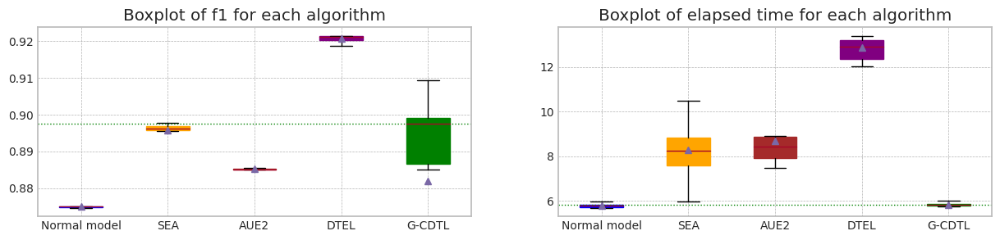

In [84]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #4 MI의 고정, Drift의 증가)

+ $P_t(y|X) = P_{t+w}(y|X)$ and $P_t(X) \ne P_{t+w}(X)$
+ Virtual Drift
+ 즉, Concept (본 Dataset에서 MI의 변화)의 변화는 없고, P(X)만 변함.

### Dataset 준비

In [50]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

y3= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x3 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    '''
    x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)
    '''
    # z0
    if ix == 4:
        for ii in range(len(y3)):
            x3[ii,ix] = y3[ii] + np.random.normal(0.0 + 4*ii/data_size,cor_)
    else:
        x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)


### 실험

MI Analysis MI Max 0.20278, Min 0.05089, Mean 0.11172, Std 0.05282
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


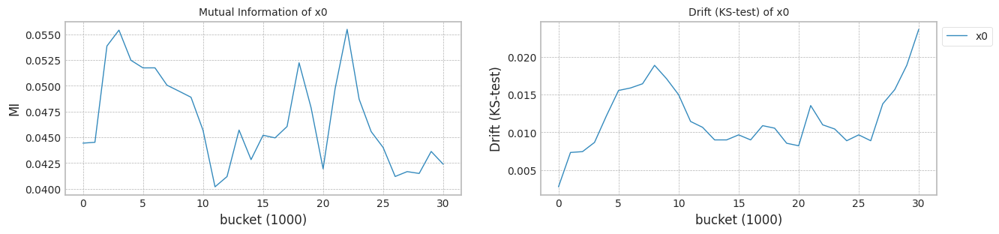

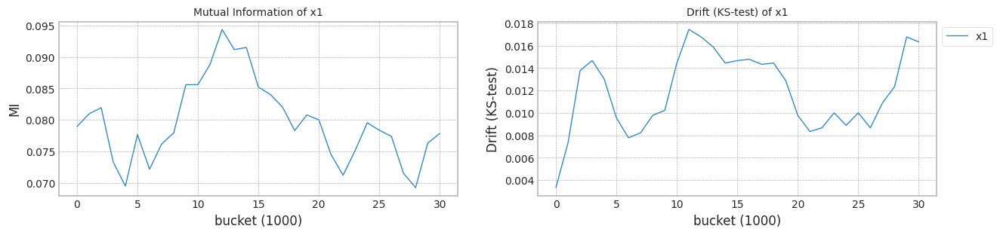

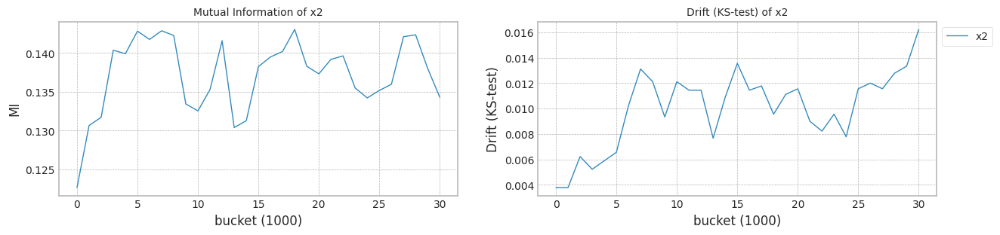

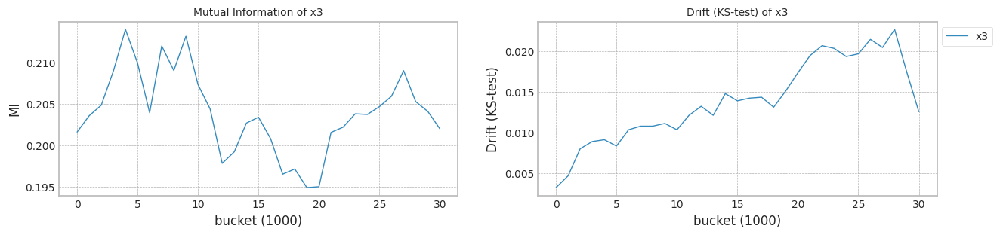

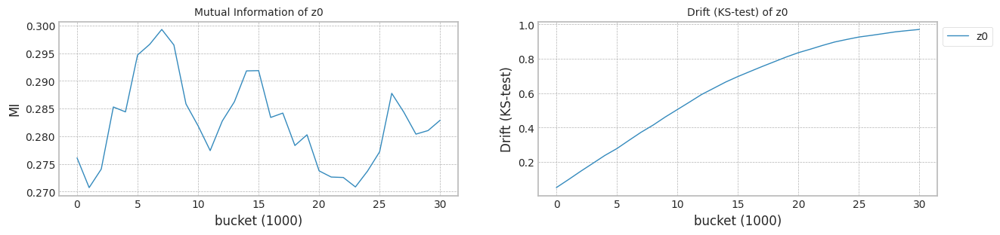

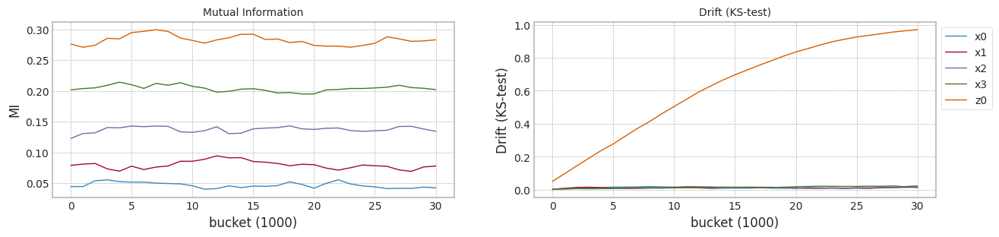

In [51]:
columns=['x0','x1','x2','x3','z0']
X3 = pd.DataFrame(x3,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X3, y3,train_size, test_size)

In [52]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.477486,0
1,0.447230,0.556479,0.629077,0.735705,0.578715,0
2,0.489501,0.704159,0.760582,0.582973,0.354045,0
3,0.581446,0.301839,0.443337,0.515173,0.360338,0
4,0.571642,0.639275,0.524701,0.583380,0.597569,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.989291,39
39996,0.426322,0.302644,0.484909,0.587518,1.004704,39
39997,0.374186,0.587769,0.624447,0.598315,1.321791,39
39998,0.470439,0.265430,0.218971,0.645349,1.148847,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 621.31it/s]


Test f1 score: 0.9121856027753685
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7694158696819199
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.20it/s]


Test f1 score: 0.9206490331184709
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.041742
x1    0.153262
x2    0.593240
x3    0.074774
z0    0.538989
dtype: float64
Mean F1 for all data: 0.7169494580617239
Normal model median        : 0.7694158696819199
Drift tolerant model median: 0.7169494580617239
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.95it/s]


Test f1 score: 0.9113209595137306
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7706523824654755
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.72it/s]


Test f1 score: 0.9225515038008152
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.480498
x1    0.178932
x2    0.179308
x3    0.230674
z0    0.422824
dtype: float64
Mean F1 for all data: 0.9115424803826504
Normal model median        : 0.7700341260736977
Drift tolerant model median: 0.8142459692221872
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.16it/s]


Test f1 score: 0.9125499945951788
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.76878780457723
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.69it/s]


Test f1 score: 0.921467121929728
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.163978
x1    0.192918
x2    0.250602
x3    0.309272
z0    0.363108
dtype: float64
Mean F1 for all data: 0.900115594431291
Normal model median        : 0.7694158696819199
Drift tolerant model median: 0.900115594431291
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.50it/s]


Test f1 score: 0.9117136659436008
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7704631632803813
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.73it/s]


Test f1 score: 0.922211188348229
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.89it/s]


mean of drift:
x0    0.062211
x1    0.607703
x2    0.052760
x3    0.069882
z0    0.403280
dtype: float64
Mean F1 for all data: 0.6564773980623566
Normal model median        : 0.7699395164811507
Drift tolerant model median: 0.8085325262465075
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.22it/s]


Test f1 score: 0.9106678230702515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7651282538395099
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.87it/s]


Test f1 score: 0.9215491559086395
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.056921
x1    0.120183
x2    0.088996
x3    0.139613
z0    0.421473
dtype: float64
Mean F1 for all data: 0.9168986401533207
Normal model median        : 0.7694158696819199
Drift tolerant model median: 0.900115594431291
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.50it/s]


Test f1 score: 0.9116753472222222
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7686716994487134
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.17it/s]


Test f1 score: 0.9225530045040098
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.147778
x1    0.151437
x2    0.155642
x3    0.228065
z0    0.412914
dtype: float64
Mean F1 for all data: 0.88066578946114
Normal model median        : 0.7691018371295749
Drift tolerant model median: 0.8903906919462155
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.06it/s]


Test f1 score: 0.9121021866204807
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.767951437608148
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.51it/s]


Test f1 score: 0.9203520352035204
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.084384
x1    0.050921
x2    0.571315
x3    0.159839
z0    0.571441
dtype: float64
Mean F1 for all data: 0.8836754605017896
Normal model median        : 0.76878780457723
Drift tolerant model median: 0.8836754605017896
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.61it/s]


Test f1 score: 0.911968777103209
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7695908535099439
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.99it/s]


Test f1 score: 0.9216681376875552
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.133889
x1    0.177667
x2    0.170771
x3    0.221172
z0    0.217581
dtype: float64
Mean F1 for all data: 0.918685046568159
Normal model median        : 0.7691018371295749
Drift tolerant model median: 0.8918955274665403
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.74it/s]


Test f1 score: 0.9115956177459594
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7704416385654702
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.33it/s]


Test f1 score: 0.9218441273326016
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.047821
x1    0.032161
x2    0.049319
x3    0.544258
z0    0.590143
dtype: float64
Mean F1 for all data: 0.9049576956624266
Normal model median        : 0.7694158696819199
Drift tolerant model median: 0.900115594431291
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.58it/s]


Test f1 score: 0.9120295042846297
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7707693151138754
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.75it/s]


Test f1 score: 0.922010779892201
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.604659
x1    0.050247
x2    0.088118
x3    0.075613
z0    0.527889
dtype: float64
Mean F1 for all data: 0.9170970204514833
Normal model median        : 0.7695033615959319
Drift tolerant model median: 0.9025366450468588
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.64it/s]


Test f1 score: 0.9117551286225986
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7694860544114435
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.22it/s]


Test f1 score: 0.9216010585511081
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.204713
x1    0.254398
x2    0.166075
x3    0.237996
z0    0.316588
dtype: float64
Mean F1 for all data: 0.9253683746933509
Normal model median        : 0.7694860544114435
Drift tolerant model median: 0.9049576956624266
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.97it/s]


Test f1 score: 0.9109856708640903
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7673924060290571
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 236.80it/s]


Test f1 score: 0.9220950704225351
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.592172
x1    0.106699
x2    0.086742
x3    0.171384
z0    0.543652
dtype: float64
Mean F1 for all data: 0.9077325802674853
Normal model median        : 0.7694509620466816
Drift tolerant model median: 0.9063451379649559
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 615.93it/s]


Test f1 score: 0.6685405725275537
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.03it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.6665410430947298
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.68it/s]


Test f1 score: 0.9227534307215582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.126527
x1    0.391165
x2    0.099437
x3    0.182882
z0    0.527853
dtype: float64
Mean F1 for all data: 0.794661322356215
Normal model median        : 0.7694158696819199
Drift tolerant model median: 0.9049576956624266
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.94it/s]


Test f1 score: 0.9120295042846297
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7701331589898588
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 235.17it/s]


Test f1 score: 0.9222136648696228
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.152878
x1    0.366724
x2    0.201140
x3    0.262556
z0    0.329685
dtype: float64
Mean F1 for all data: 0.8827626804482738
Normal model median        : 0.7694509620466816
Drift tolerant model median: 0.9025366450468588
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.30it/s]


Test f1 score: 0.9104720564297342
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7654475854545305
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.98it/s]


Test f1 score: 0.9217698333885027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.623989
x1    0.049903
x2    0.132057
x3    0.087072
z0    0.554789
dtype: float64
Mean F1 for all data: 0.9171573755710994
Normal model median        : 0.7694158696819199
Drift tolerant model median: 0.9049576956624266
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.85it/s]


Test f1 score: 0.9116561753852832
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.770251674395288
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 237.49it/s]


Test f1 score: 0.9212442091330245
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.125849
x1    0.339401
x2    0.194871
x3    0.254946
z0    0.320771
dtype: float64
Mean F1 for all data: 0.8858617290003589
Normal model median        : 0.7694509620466816
Drift tolerant model median: 0.9025366450468588
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.55it/s]


Test f1 score: 0.9118508077632007
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.769525101327539
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.54it/s]


Test f1 score: 0.9222638185421712
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.166900
x1    0.091685
x2    0.181814
x3    0.273763
z0    0.344222
dtype: float64
Mean F1 for all data: 0.9197601325935676
Normal model median        : 0.7694860544114435
Drift tolerant model median: 0.9049576956624266
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.36it/s]


Test f1 score: 0.9118699186991871
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.76953048458936
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 238.18it/s]


Test f1 score: 0.92099173553719
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.110688
x1    0.194505
x2    0.174039
x3    0.205993
z0    0.302889
dtype: float64
Mean F1 for all data: 0.9205902002191638
Normal model median        : 0.7695055778694913
Drift tolerant model median: 0.9063451379649559
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.01it/s]


Test f1 score: 0.9116753472222222
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7702988306535232
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.00it/s]


Test f1 score: 0.9204845814977973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.168631
x1    0.140290
x2    0.186548
x3    0.318176
z0    0.365283
dtype: float64
Mean F1 for all data: 0.9215901270264424
Normal model median        : 0.769525101327539
Drift tolerant model median: 0.9077325802674853
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 605.31it/s]


Test f1 score: 0.9116147923218739
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7649211096502738
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 239.37it/s]


Test f1 score: 0.9214277820753674
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.151828
x1    0.143004
x2    0.203416
x3    0.279563
z0    0.356857
dtype: float64
Mean F1 for all data: 0.9229856375684294
Normal model median        : 0.7695055778694913
Drift tolerant model median: 0.9096375303250679
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.12it/s]


Early stop at  3471.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8146523960893838
SEA median: 0.8146523960893838
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.79it/s]


Early stop at  1936.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7767545665123073
AUE median: 0.7767545665123073
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.43it/s]


Early stop at  1888.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.857754386364658
DTEL median: 0.857754386364658
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.90it/s]


Early stop at  1728.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8106043531796667
SEA median: 0.8126283746345253
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.28it/s]


Early stop at  1261.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7784048703715412
AUE median: 0.7775797184419242
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.35it/s]


Early stop at  1942.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8589948833666031
DTEL median: 0.8583746348656305
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.82it/s]


Early stop at  1697.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8147210501694535
SEA median: 0.8146523960893838
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.26it/s]


Early stop at  1254.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7761903866741903
AUE median: 0.7767545665123073
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.63it/s]


Early stop at  1119.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8564100993345651
DTEL median: 0.857754386364658
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.98it/s]


Early stop at  1667.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8147849036631818
SEA median: 0.8146867231294186
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.26it/s]


Early stop at  1274.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7785175644009352
AUE median: 0.7775797184419242
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.46it/s]


Early stop at  1791.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8574045546011716
DTEL median: 0.8575794704829147
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.67it/s]


Early stop at  1947.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8087144771164071
SEA median: 0.8146523960893838
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.13it/s]


Early stop at  1265.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.772032595908557
AUE median: 0.7767545665123073
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.48it/s]


Early stop at  1780.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8547368017319973
DTEL median: 0.8574045546011716
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.11it/s]


Early stop at  3550.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8135972977853237
SEA median: 0.8141248469373538
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.83it/s]


Early stop at  1822.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7761431428568164
AUE median: 0.7764724765932488
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.66it/s]


Early stop at  1094.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8573732303832088
DTEL median: 0.8573888924921902
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.98it/s]


Early stop at  1643.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.81398848290485
SEA median: 0.81398848290485
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.07it/s]


Early stop at  1462.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7754823524484655
AUE median: 0.7761903866741903
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.52it/s]


Early stop at  1319.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.856539992892843
DTEL median: 0.8573732303832088
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.14it/s]


Early stop at  1431.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8108351809563485
SEA median: 0.8137928903450868
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.93it/s]


Early stop at  1782.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7767598438626528
AUE median: 0.7764724765932488
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.40it/s]


Early stop at  1943.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8583109735244531
DTEL median: 0.8573888924921902
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.96it/s]


Early stop at  1650.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8123530611554811
SEA median: 0.8135972977853237
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.92it/s]


Early stop at  1623.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7779778678528555
AUE median: 0.7767545665123073
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.38it/s]


Early stop at  1997.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8579255159374695
DTEL median: 0.8574045546011716
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.77it/s]


Early stop at  1841.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8142174357898412
SEA median: 0.8137928903450868
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.97it/s]


Early stop at  1452.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7786412585723264
AUE median: 0.77675720518748
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.29it/s]


Early stop at  2512.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8582049924977836
DTEL median: 0.8575794704829147
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


Early stop at  34.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7692897097544095
SEA median: 0.8135972977853237
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7762159106987477
AUE median: 0.7767545665123073
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.49it/s]


Early stop at  1760.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8584232124903622
DTEL median: 0.857754386364658
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.97it/s]


Early stop at  3809.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8089456831350028
SEA median: 0.8129751794704024
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.79it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7730186098112094
AUE median: 0.7764852386055275
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.68it/s]


Early stop at  949.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8569138442511564
DTEL median: 0.8575794704829147
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.29it/s]


Early stop at  3161.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7676902332704311
SEA median: 0.8123530611554811
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.86it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7438472646248101
AUE median: 0.7762159106987477
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.49it/s]


Early stop at  1701.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7677833808973821
DTEL median: 0.8574045546011716
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.64it/s]


Early stop at  2383.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.813448134698428
SEA median: 0.8129005979269546
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.28it/s]


Early stop at  1079.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7772576987774361
AUE median: 0.7764852386055275
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.44it/s]


Early stop at  1639.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8582283709771986
DTEL median: 0.8575794704829147
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.25it/s]


Early stop at  3071.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8089082996823825
SEA median: 0.8123530611554811
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.09it/s]


Early stop at  1242.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.771857664049033
AUE median: 0.7762159106987477
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.46it/s]


Early stop at  1872.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8550066706637532
DTEL median: 0.8574045546011716
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.99it/s]


Early stop at  1704.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8103662236140324
SEA median: 0.8115941210559148
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.78it/s]


Early stop at  1991.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7775068971663937
AUE median: 0.7764852386055275
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.38it/s]


Early stop at  1768.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8587021399898533
DTEL median: 0.8575794704829147
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.76it/s]


Early stop at  1791.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8108860078723411
SEA median: 0.8108860078723411
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.20it/s]


Early stop at  1368.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7767559276335659
AUE median: 0.7767545665123073
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.52it/s]


Early stop at  1426.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8581224535268878
DTEL median: 0.857754386364658
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.96it/s]


Early stop at  1806.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8112552123417781
SEA median: 0.8110706101070596
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.14it/s]


Early stop at  1383.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7764876853860753
AUE median: 0.7766211259491913
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.32it/s]


Early stop at  2203.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8585332336113413
DTEL median: 0.8578399511510637
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.10it/s]


Early stop at  1541.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8102815858879082
SEA median: 0.8108860078723411
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.93it/s]


Early stop at  1481.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7774085911703954
AUE median: 0.7767545665123073
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.16it/s]


Early stop at  2903.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8586994361778971
DTEL median: 0.8579255159374695
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.69it/s]


Early stop at  2226.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8068562490715451
SEA median: 0.8108605944143448
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.08it/s]


Early stop at  1408.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7712274903156959
AUE median: 0.7766211259491913
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.45it/s]


Early stop at  1709.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.855435151515056
DTEL median: 0.8578399511510637


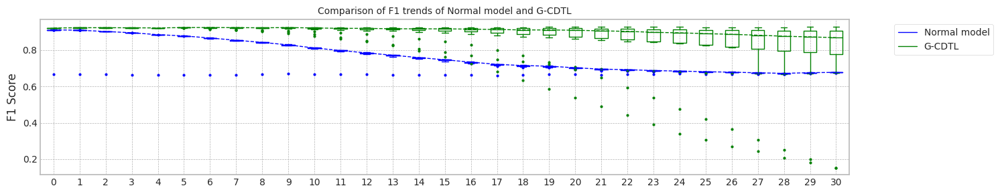

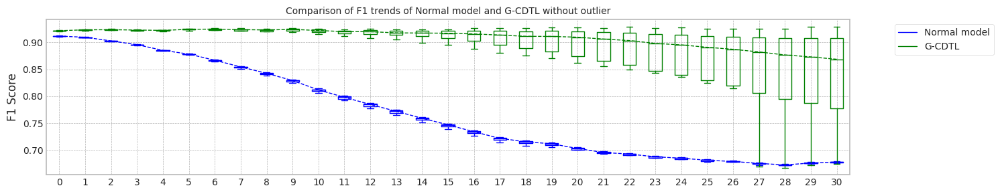

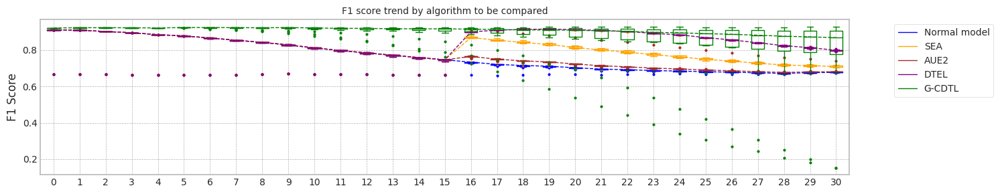

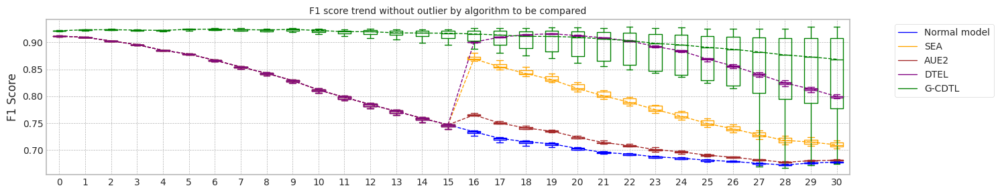

max_mean_trial= 10


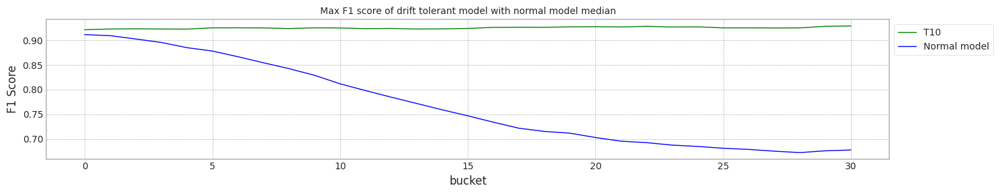

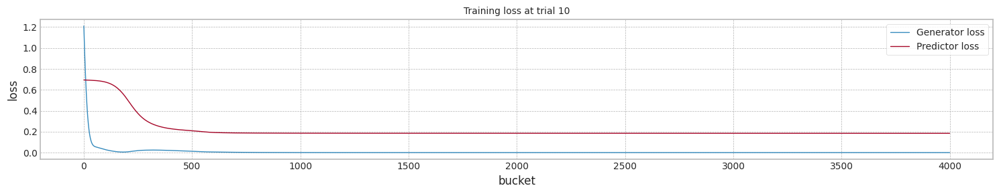

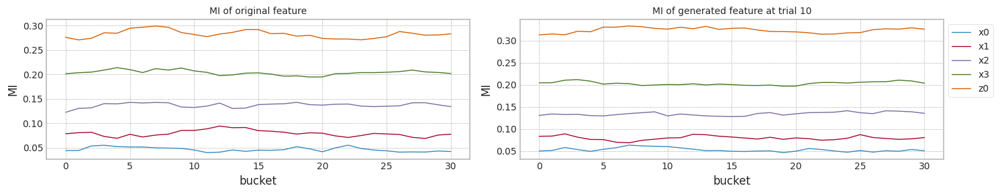

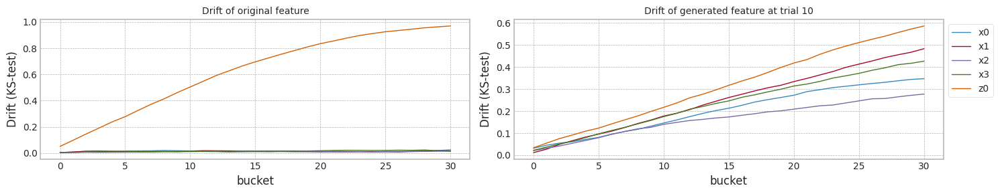

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912186,0.910003,0.769416,0.677622,5.752225
1,1.0,0.911321,0.909324,0.770652,0.677672,5.807793
2,2.0,0.912550,0.909343,0.768788,0.677723,5.847786
3,3.0,0.911714,0.909480,0.770463,0.678979,5.939474
4,4.0,0.910668,0.908722,0.765128,0.676221,5.842838
5,5.0,0.911675,0.909577,0.768672,0.676871,5.711846
6,6.0,0.912102,0.909459,0.767951,0.677221,5.668533
7,7.0,0.911969,0.909790,0.769591,0.677723,5.666984
8,8.0,0.911596,0.909363,0.770442,0.678325,5.724682
9,9.0,0.912030,0.909577,0.770769,0.678828,5.852972


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912186,0.910003,0.814652,0.714386,9.972792
1,1.0,0.911321,0.909324,0.810604,0.706654,7.962313
2,2.0,0.912550,0.909343,0.814721,0.714063,8.129900
3,3.0,0.911714,0.909480,0.814785,0.717478,7.810131
4,4.0,0.910668,0.908722,0.808714,0.709118,8.475488
5,5.0,0.911675,0.909577,0.813597,0.709337,9.997311
6,6.0,0.912102,0.909459,0.813988,0.712551,7.804536
7,7.0,0.911969,0.909790,0.810835,0.708514,7.507755
8,8.0,0.911596,0.909363,0.812353,0.711996,7.849080
9,9.0,0.912030,0.909577,0.814217,0.715291,8.247360


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912186,0.910003,0.776755,0.681051,8.192509
1,1.0,0.911321,0.909324,0.778405,0.681710,7.259207
2,2.0,0.912550,0.909343,0.776190,0.681558,7.306763
3,3.0,0.911714,0.909480,0.778518,0.685077,7.298551
4,4.0,0.910668,0.908722,0.772033,0.679433,7.523658
5,5.0,0.911675,0.909577,0.776143,0.680696,8.126734
6,6.0,0.912102,0.909459,0.775482,0.681051,7.642913
7,7.0,0.911969,0.909790,0.776760,0.681203,7.917581
8,8.0,0.911596,0.909363,0.777978,0.682269,7.939810
9,9.0,0.912030,0.909577,0.778641,0.683491,7.834861


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912186,0.910003,0.857754,0.799335,12.765839
1,1.0,0.911321,0.909324,0.858995,0.800315,13.221399
2,2.0,0.912550,0.909343,0.856410,0.796270,11.824117
3,3.0,0.911714,0.909480,0.857405,0.797590,12.599242
4,4.0,0.910668,0.908722,0.854737,0.793436,12.521132
5,5.0,0.911675,0.909577,0.857373,0.797451,11.685832
6,6.0,0.912102,0.909459,0.856540,0.798776,12.308850
7,7.0,0.911969,0.909790,0.858311,0.800877,12.925033
8,8.0,0.911596,0.909363,0.857926,0.798217,13.057034
9,9.0,0.912030,0.909577,0.858205,0.799230,13.571147


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.920649,0.922201,0.716949,0.152853,6.067827
1,1.0,0.922552,0.924489,0.911542,0.871923,5.965378
2,2.0,0.921467,0.923162,0.900116,0.853383,5.849413
3,3.0,0.922211,0.924254,0.656477,0.152946,6.357723
4,4.0,0.921549,0.923401,0.916899,0.899858,5.856130
5,5.0,0.922553,0.923857,0.880666,0.799231,5.767540
6,6.0,0.920352,0.922260,0.883675,0.777995,5.773129
7,7.0,0.921668,0.923435,0.918685,0.909382,5.923666
8,8.0,0.921844,0.923858,0.904958,0.863104,5.784944
9,9.0,0.922011,0.923213,0.917097,0.909886,5.850436


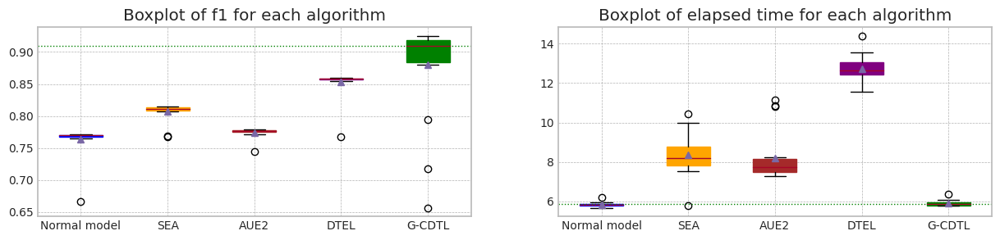

In [53]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #5 - Case #1,2,3,4의 상황이 각 feature에 혼재되어 있는 경우)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ 전체적으로는 Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ $x_0$ : No drift
+ $x_1$ : $P_t(y|X) = P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Virtual Drift
+ $x_2$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 감소, Drift 증가
+ $x_3$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 증가, Drift 증가
+ $z_0$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) = P_{t+w}(X)$ 인 Actual Drift, MI 감소, Drift 고정


### Dataset 준비

In [58]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.5 , 0.7, 2.5])

x4 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x4[:,ix] = np.random.normal(1,cor_,data_size)

y4_array = []
cor_const = cor[4]
cor_const2 = 3/x4.shape[0]
for ii in range(x4.shape[0]):
    # Case #2, MI의 증감(상대적), Drift의 고정 - z0
    cor[4] = cor[4] - cor_const / x4.shape[0]
    e = np.random.normal(0.0, 2.0)
    # Case #3 MI의 증감(상대적), Drift의 증가 - x3
    e1 = np.random.normal(0.0, 3*cor_const2 * ii)
    x4[ii,3] = x4[ii,3] + e1
    y4_array.append(np.sum(cor * x4[ii])+e)

y4 = [1 if y_ > 5 else 0 for y_ in y4_array]

for i in range(len(y4)):
    #Case #1 MI의 감소, Drift의 증가 - x2
    x4[i,2] = y4[i] + np.random.normal(1,0.5+5*(i/data_size))
    #Case #4 MI의 고정, Drift의 증가 - x1
    x4[i,1] = y4[i] + np.random.normal(0.0 + 4*(i/data_size),cor[1])


### 실험

MI Analysis MI Max 0.14553, Min 0.02121, Mean 0.06553, Std 0.04745
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


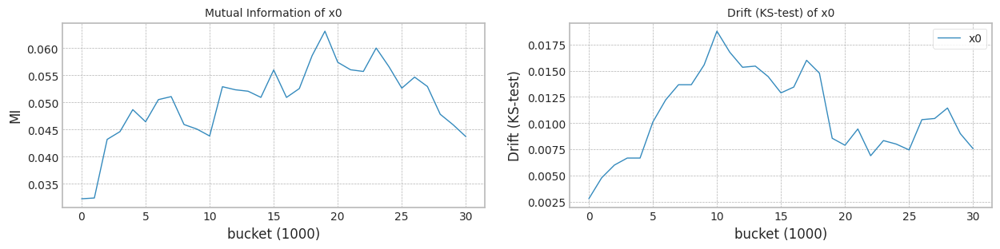

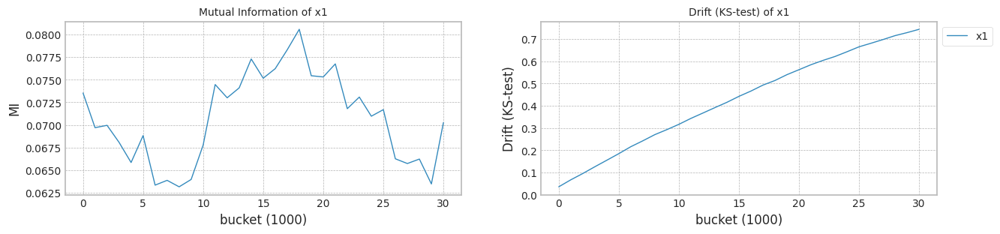

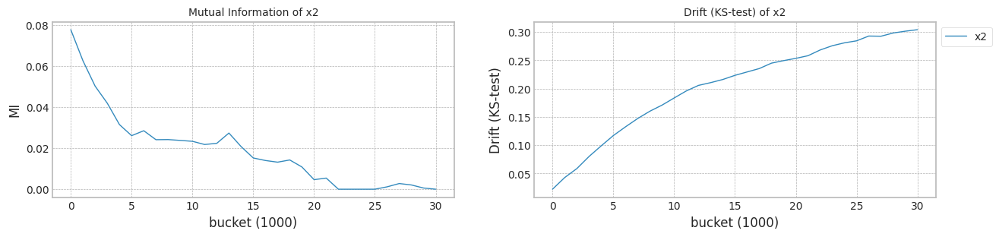

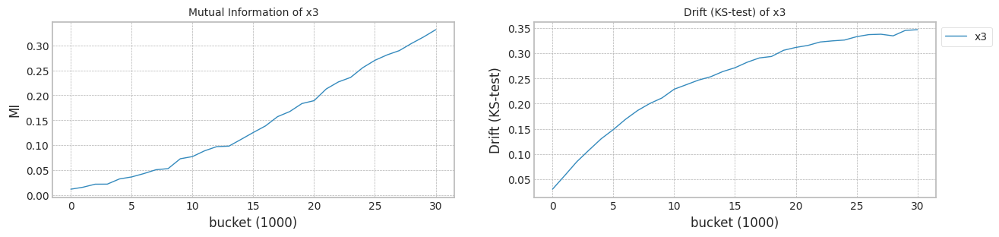

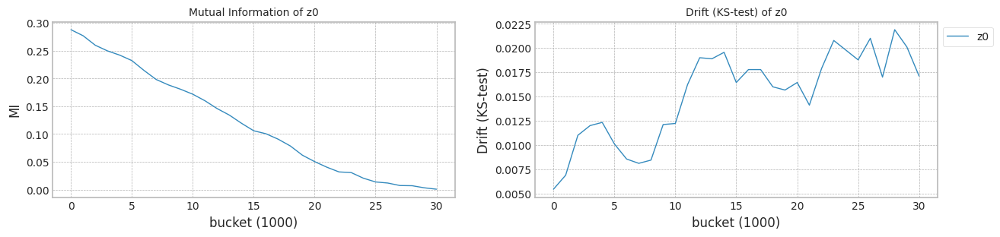

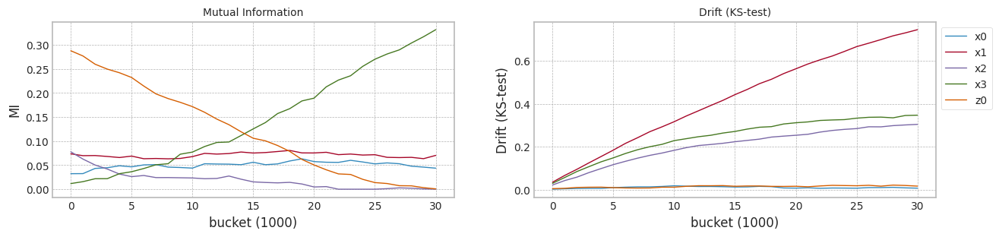

In [59]:
columns=['x0','x1','x2','x3','z0']
X4 = pd.DataFrame(x4,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X4, y4,train_size, test_size)

In [60]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.51it/s]


Test f1 score: 0.8948604716715213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6958917654688134
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.71it/s]


Test f1 score: 0.9125059894585529
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.186785
x1    0.343695
x2    0.313022
x3    0.395090
z0    0.222842
dtype: float64
Mean F1 for all data: 0.7844671750514273
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7844671750514273
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.71it/s]


Test f1 score: 0.8813434890336791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6662806807451164
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.20it/s]


Test f1 score: 0.9160363810435616
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.90it/s]


mean of drift:
x0    0.144452
x1    0.380487
x2    0.157878
x3    0.526968
z0    0.201839
dtype: float64
Mean F1 for all data: 0.7823239551434042
Normal model median        : 0.6810862231069649
Drift tolerant model median: 0.7833955650974158
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 642.20it/s]


Test f1 score: 0.8892273327241343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7290748811339902
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.50it/s]


Test f1 score: 0.9070391268152808
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.142462
x1    0.344061
x2    0.413806
x3    0.606638
z0    0.251892
dtype: float64
Mean F1 for all data: 0.7855493456926144
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7844671750514273
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.81it/s]


Test f1 score: 0.8849449204406364
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.739687385041685
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.87it/s]


Test f1 score: 0.9100984045094105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.154319
x1    0.345918
x2    0.385527
x3    0.539337
z0    0.143254
dtype: float64
Mean F1 for all data: 0.7728453515531976
Normal model median        : 0.7124833233014018
Drift tolerant model median: 0.7833955650974158
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.85it/s]


Test f1 score: 0.8871071790618376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6807693856295407
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.59it/s]


Test f1 score: 0.9111111111111111
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.150491
x1    0.398885
x2    0.416792
x3    0.599229
z0    0.280810
dtype: float64
Mean F1 for all data: 0.756557554631227
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7823239551434042
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.38it/s]


Test f1 score: 0.8847879282218596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7158746519304311
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.32it/s]


Test f1 score: 0.9161067383374928
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.142276
x1    0.302624
x2    0.408025
x3    0.284032
z0    0.193982
dtype: float64
Mean F1 for all data: 0.7979450568706429
Normal model median        : 0.7058832086996223
Drift tolerant model median: 0.7833955650974158
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 619.76it/s]


Test f1 score: 0.8597961037650146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6226082995071437
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.68it/s]


Test f1 score: 0.8944327249380905
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.207480
x1    0.318269
x2    0.216394
x3    0.372004
z0    0.266982
dtype: float64
Mean F1 for all data: 0.7346584156040339
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7823239551434042
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.80it/s]


Test f1 score: 0.890729709605361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6897091451735295
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.36it/s]


Test f1 score: 0.9153322466200019
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.151358
x1    0.343208
x2    0.282796
x3    0.387014
z0    0.190022
dtype: float64
Mean F1 for all data: 0.8153527664797285
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.7833955650974158
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.69it/s]


Test f1 score: 0.9014243939251014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7245279859149888
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.85it/s]


Test f1 score: 0.9180011576307159
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.141308
x1    0.354258
x2    0.169638
x3    0.304993
z0    0.115993
dtype: float64
Mean F1 for all data: 0.819554350874732
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7844671750514273
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.87it/s]


Test f1 score: 0.8794610342316097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6690793015250777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.82it/s]


Test f1 score: 0.9009930785434849
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.180129
x1    0.409358
x2    0.323559
x3    0.373781
z0    0.160667
dtype: float64
Mean F1 for all data: 0.7427890101036791
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.7833955650974158
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.77it/s]


Test f1 score: 0.8707839768514333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6514872611104539
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.78it/s]


Test f1 score: 0.9161141539348515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.148022
x1    0.335351
x2    0.184437
x3    0.339004
z0    0.111753
dtype: float64
Mean F1 for all data: 0.8206608647180219
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.7844671750514273
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.75it/s]


Test f1 score: 0.8886626561776956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6837585090804575
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.90it/s]


Test f1 score: 0.9161427604217042
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.02it/s]


mean of drift:
x0    0.309545
x1    0.358659
x2    0.452394
x3    0.530351
z0    0.254645
dtype: float64
Mean F1 for all data: 0.7836369798852667
Normal model median        : 0.6867338271269936
Drift tolerant model median: 0.784052077468347
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.59it/s]


Test f1 score: 0.8951760635049868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7725863680429726
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.31it/s]


Test f1 score: 0.9108986615678777
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.212366
x1    0.361100
x2    0.213943
x3    0.374272
z0    0.218183
dtype: float64
Mean F1 for all data: 0.771877294577279
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.7836369798852667
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.93it/s]


Test f1 score: 0.8985206821822294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7101282901215146
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.15it/s]


Test f1 score: 0.9139784946236559
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.111176
x1    0.343115
x2    0.353631
x3    0.251269
z0    0.317050
dtype: float64
Mean F1 for all data: 0.8024148750658212
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.784052077468347
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.46it/s]


Test f1 score: 0.8955223880597014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7080777514469699
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.12it/s]


Test f1 score: 0.9186169700471924
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.117004
x1    0.355828
x2    0.216753
x3    0.197484
z0    0.133434
dtype: float64
Mean F1 for all data: 0.8315364468744643
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7844671750514273
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.72it/s]


Test f1 score: 0.9006560449859419
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7223925780472199
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.22it/s]


Test f1 score: 0.9113705972434916
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.142649
x1    0.348857
x2    0.258477
x3    0.585878
z0    0.218778
dtype: float64
Mean F1 for all data: 0.7707397439319874
Normal model median        : 0.7019847584578917
Drift tolerant model median: 0.784052077468347
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.49it/s]


Test f1 score: 0.900196060125105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.71993521509321
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.89it/s]


Test f1 score: 0.9148875059837241
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.127778
x1    0.401000
x2    0.157896
x3    0.538194
z0    0.128308
dtype: float64
Mean F1 for all data: 0.8008542642936393
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.7844671750514273
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.37it/s]


Test f1 score: 0.9029409001221459
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7301103185087935
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.44it/s]


Test f1 score: 0.9144287226874579
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.202290
x1    0.362301
x2    0.394964
x3    0.456692
z0    0.211466
dtype: float64
Mean F1 for all data: 0.7749566656565058
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.784052077468347
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.87it/s]


Test f1 score: 0.8969708302169035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7055537636148667
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.02it/s]


Test f1 score: 0.9147301709237565
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.216459
x1    0.349645
x2    0.309222
x3    0.484129
z0    0.156391
dtype: float64
Mean F1 for all data: 0.7907538814298433
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.7844671750514273
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.22it/s]


Test f1 score: 0.9021708486044544
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7299764330545594
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.27it/s]


Test f1 score: 0.9143783371472158
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.125774
x1    0.366982
x2    0.098061
x3    0.499828
z0    0.239552
dtype: float64
Mean F1 for all data: 0.7918777662231539
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.7850082603720208
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.00it/s]


Early stop at  3689.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.795951188928623
SEA median: 0.795951188928623
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.72it/s]


Early stop at  2025.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7661689039150799
AUE median: 0.7661689039150799
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.54it/s]


Early stop at  1390.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8293394654701081
DTEL median: 0.8293394654701081
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.19it/s]


Early stop at  1313.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7861200097751635
SEA median: 0.7910355993518933
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.24it/s]


Early stop at  3080.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7533033074449859
AUE median: 0.7597361056800329
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.61it/s]


Early stop at  1039.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8171202947970266
DTEL median: 0.8232298801335673
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.07it/s]


Early stop at  1512.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8306364093147826
SEA median: 0.795951188928623
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.06it/s]


Early stop at  1496.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8232789257797212
AUE median: 0.7661689039150799
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.57it/s]


Early stop at  1359.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8408041999565493
DTEL median: 0.8293394654701081
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.78it/s]


Early stop at  2099.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8321695560693195
SEA median: 0.8132937991217029
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.34it/s]


Early stop at  1015.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8233908456824677
AUE median: 0.7947239148474006
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.61it/s]


Early stop at  1205.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8387796806394124
DTEL median: 0.8340595730547602
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.36it/s]


Early stop at  1062.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7960921009722055
SEA median: 0.7960921009722055
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.73it/s]


Early stop at  2047.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7609105267143976
AUE median: 0.7661689039150799
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.57it/s]


Early stop at  1362.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8216962491539566
DTEL median: 0.8293394654701081
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.38it/s]


Early stop at  2748.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8247387466520933
SEA median: 0.8104154238121495
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.41it/s]


Early stop at  923.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8183394385055538
AUE median: 0.7922541712103168
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.40it/s]


Early stop at  2048.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8353520460037488
DTEL median: 0.8323457557369285
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.79it/s]


Early stop at  1974.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.792509538391596
SEA median: 0.7960921009722055
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.56it/s]


Early stop at  2294.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.784663036400487
AUE median: 0.784663036400487
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.33it/s]


Early stop at  2534.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7976159297378836
DTEL median: 0.8293394654701081
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.84it/s]


Early stop at  1879.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7997145286936466
SEA median: 0.797903314832926
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.38it/s]


Early stop at  2757.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7658795808647223
AUE median: 0.7754159701577834
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.49it/s]


Early stop at  1780.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.824627261873715
DTEL median: 0.8269833636719115
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.89it/s]


Early stop at  1817.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8092511964338603
SEA median: 0.7997145286936466
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.56it/s]


Early stop at  2381.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7822525516909736
AUE median: 0.7822525516909736
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.34it/s]


Early stop at  2194.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8385688954038248
DTEL median: 0.8293394654701081
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.14it/s]


Early stop at  1291.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7902382576340804
SEA median: 0.797903314832926
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.98it/s]


Early stop at  1658.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7593984407996485
AUE median: 0.7742107278030268
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.68it/s]


Early stop at  1000.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8164276845192536
DTEL median: 0.8269833636719115
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.23it/s]


Early stop at  3151.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7770316120277394
SEA median: 0.7960921009722055
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.91it/s]


Early stop at  1685.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.755283004352102
AUE median: 0.7661689039150799
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.48it/s]


Early stop at  1756.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8087900489447812
DTEL median: 0.824627261873715
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.07it/s]


Early stop at  3479.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7930171073846064
SEA median: 0.7960216449504143
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7601308276331585
AUE median: 0.7660242423899011
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.32it/s]


Early stop at  2640.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8227201103819077
DTEL median: 0.8236736861278113
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.61it/s]


Early stop at  2343.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8388336451111875
SEA median: 0.7960921009722055
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8359363780272899
AUE median: 0.7661689039150799
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.26it/s]


Early stop at  2679.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8510419864447344
DTEL median: 0.824627261873715
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.82it/s]


Early stop at  1989.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8061876475822914
SEA median: 0.797903314832926
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7717863742750269
AUE median: 0.7689776390950533
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.54it/s]


Early stop at  1733.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8342687207552125
DTEL median: 0.8269833636719115
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.87it/s]


Early stop at  2054.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8030732030882028
SEA median: 0.7997145286936466
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.88it/s]


Early stop at  2062.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.787492263089489
AUE median: 0.7717863742750269
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.44it/s]


Early stop at  1836.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8313188121594942
DTEL median: 0.8293394654701081
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


Early stop at  940.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8068033085044592
SEA median: 0.8013938658909248
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.85it/s]


Early stop at  1966.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7773568580668714
AUE median: 0.7745716161709492
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.42it/s]


Early stop at  2183.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8376790854772894
DTEL median: 0.8303291388148011
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.23it/s]


Early stop at  1324.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8075240689235587
SEA median: 0.8030732030882028
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.86it/s]


Early stop at  1987.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.775289904047569
AUE median: 0.775289904047569
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.69it/s]


Early stop at  1100.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8363811410855394
DTEL median: 0.8313188121594942
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.03it/s]


Early stop at  1587.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8169573195336715
SEA median: 0.8046304253352472
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.55it/s]


Early stop at  975.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7857445804450495
AUE median: 0.7763233810572202
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.44it/s]


Early stop at  2263.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8408355298824225
DTEL median: 0.8327937664573534
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


Early stop at  1034.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7978923627666898
SEA median: 0.8030732030882028
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.60it/s]


Early stop at  2366.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.767851736569656
AUE median: 0.775289904047569
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.24it/s]


Early stop at  2894.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.831915569164933
DTEL median: 0.831915569164933
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.78it/s]


Early stop at  607.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8113301552059816
SEA median: 0.8046304253352472
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.21it/s]


Early stop at  1366.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7871682915750513
AUE median: 0.7763233810572202
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.39it/s]


Early stop at  2366.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8409709818012833
DTEL median: 0.8330921449600728


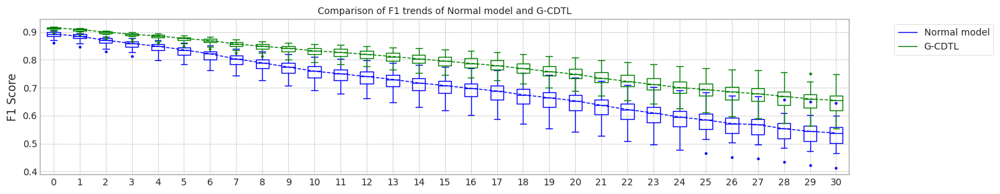

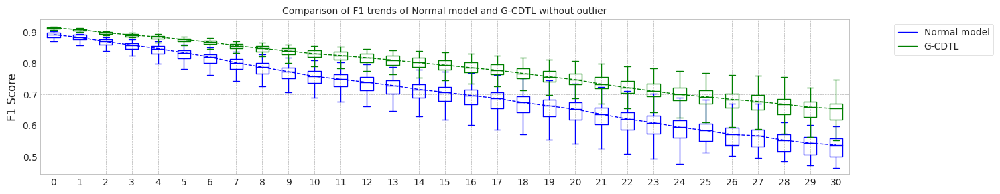

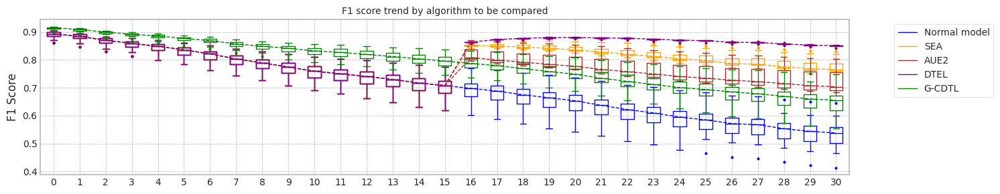

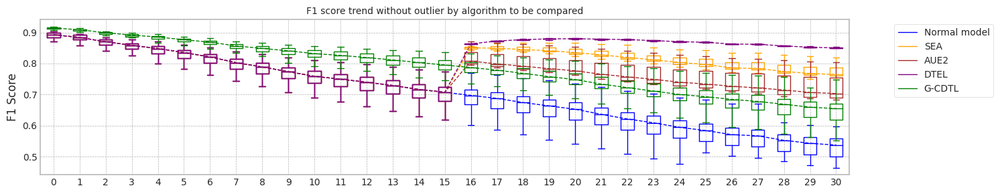

max_mean_trial= 14


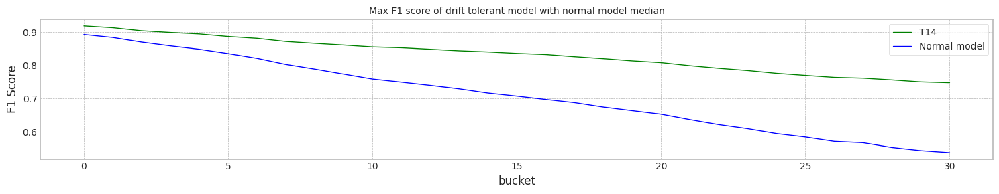

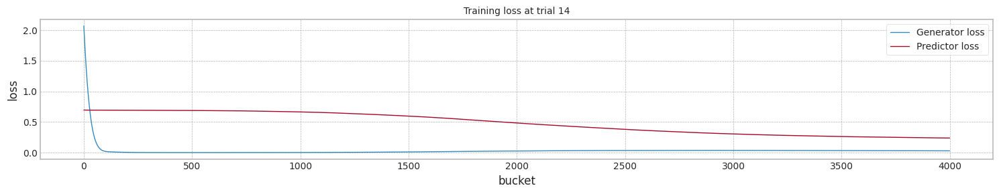

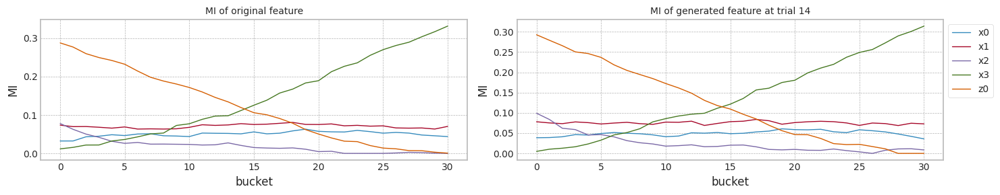

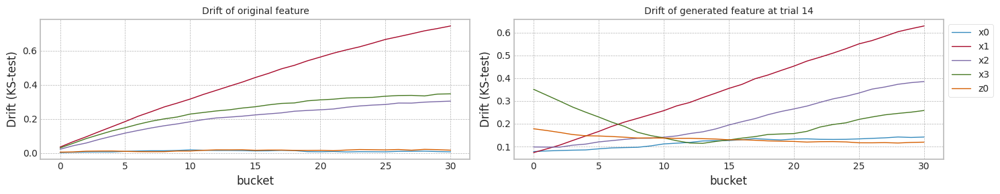

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.894860,0.884669,0.695892,0.512540,5.852745
1,1.0,0.881343,0.869811,0.666281,0.477207,5.922287
2,2.0,0.889227,0.883180,0.729075,0.554807,5.851814
3,3.0,0.884945,0.878742,0.739687,0.598738,5.901434
4,4.0,0.887107,0.875389,0.680769,0.497140,5.981160
5,5.0,0.884788,0.877346,0.715875,0.541218,5.891264
6,6.0,0.859796,0.847444,0.622608,0.413468,5.963115
7,7.0,0.890730,0.880267,0.689709,0.514373,5.886003
8,8.0,0.901424,0.892478,0.724528,0.559178,5.934966
9,9.0,0.879461,0.867450,0.669079,0.487057,5.832640


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.894860,0.884669,0.795951,0.750921,10.380843
1,1.0,0.881343,0.869811,0.786120,0.760965,7.440697
2,2.0,0.889227,0.883180,0.830636,0.820301,7.662443
3,3.0,0.884945,0.878742,0.832170,0.829987,8.248434
4,4.0,0.887107,0.875389,0.796092,0.773735,7.153806
5,5.0,0.884788,0.877346,0.824739,0.818661,9.219571
6,6.0,0.859796,0.847444,0.792510,0.829819,8.231840
7,7.0,0.890730,0.880267,0.799715,0.776878,8.123051
8,8.0,0.901424,0.892478,0.809251,0.761108,8.022220
9,9.0,0.879461,0.867450,0.790238,0.772298,7.528548


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.894860,0.884669,0.766169,0.686416,8.384796
1,1.0,0.881343,0.869811,0.753303,0.687351,9.628468
2,2.0,0.889227,0.883180,0.823279,0.797013,7.685574
3,3.0,0.884945,0.878742,0.823391,0.800998,7.193095
4,4.0,0.887107,0.875389,0.760911,0.690948,8.356105
5,5.0,0.884788,0.877346,0.818339,0.798836,7.081834
6,6.0,0.859796,0.847444,0.784663,0.802326,8.753692
7,7.0,0.890730,0.880267,0.765880,0.697821,9.211263
8,8.0,0.901424,0.892478,0.782253,0.705904,8.752162
9,9.0,0.879461,0.867450,0.759398,0.701035,7.842269


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.894860,0.884669,0.829339,0.850556,12.271563
1,1.0,0.881343,0.869811,0.817120,0.853352,11.927337
2,2.0,0.889227,0.883180,0.840804,0.848589,12.127729
3,3.0,0.884945,0.878742,0.838780,0.849183,11.915942
4,4.0,0.887107,0.875389,0.821696,0.849328,12.112123
5,5.0,0.884788,0.877346,0.835352,0.849299,12.953593
6,6.0,0.859796,0.847444,0.797616,0.842579,13.344585
7,7.0,0.890730,0.880267,0.824627,0.851299,12.486700
8,8.0,0.901424,0.892478,0.838569,0.849766,13.293217
9,9.0,0.879461,0.867450,0.816428,0.853076,11.599065


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912506,0.906633,0.784467,0.653701,5.925142
1,1.0,0.916036,0.910677,0.782324,0.624067,6.379373
2,2.0,0.907039,0.901109,0.785549,0.658361,5.942111
3,3.0,0.910098,0.904270,0.772845,0.622749,5.911144
4,4.0,0.911111,0.904730,0.756558,0.560288,5.869398
5,5.0,0.916107,0.911013,0.797945,0.656588,5.912247
6,6.0,0.894433,0.887155,0.734658,0.553057,5.891971
7,7.0,0.915332,0.909754,0.815353,0.712499,5.984759
8,8.0,0.918001,0.912355,0.819554,0.719175,5.896176
9,9.0,0.900993,0.893331,0.742789,0.552777,5.829248


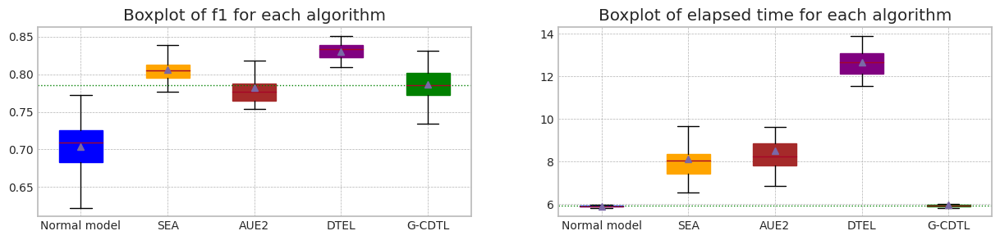

In [61]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20,lr_g=0.0001) #np.max(X1['b'])+1)

## real-world data 의 실험

### Loan data 실험

#### Dataset 준비

##### Data load

In [85]:

if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [86]:

df_accepted = pd.read_csv("/content/drive/MyDrive/Drift/accepted_2007_to_2018Q4.csv")

print(df_accepted.shape)

(2260701, 151)


##### Data 정제

In [87]:
# for the sake of simplicity, let's consider only Fully Paid and Charged Off values:
df_accepted = df_accepted[df_accepted.loan_status.isin(['Fully Paid', 'Charged Off'])]
print(df_accepted.shape)

cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(50).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# maybe we can go further, and eliminate columns up to title:
cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(45).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# Remaining columns have missing data points, but they account for less than 0.2% of the total data. Let's remove the rows that are missing those values in those columns with dropna():
df_accepted = df_accepted.dropna()
print(df_accepted.shape)

# These are constant columns. We can drop it either.
cols_to_drop = ['out_prncp', 'out_prncp_inv', 'policy_code']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# It seems we have many "duplicated" information. Let's drop some columns, based on visual inspection at corr_pairs dataframe:
cols_to_drop = ['fico_range_low', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt_inv', 'total_pymnt', 'installment', 'collection_recovery_fee', 'total_rec_prncp', 'last_fico_range_low']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

values = df_accepted.loan_status.unique()
encode = [1,0]
d = dict(zip(values, encode))
df_accepted['loan_paid'] = df_accepted['loan_status'].map(d)
df_accepted = df_accepted.drop(columns=['loan_status'])

df_accepted

(1345310, 151)
(1345310, 101)
(1345310, 56)
(1341026, 56)
(1341026, 53)
(1341026, 44)


,id,loan_amnt,term,int_rate,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,...,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,loan_paid
0,68407277,3600.0,36 months,13.99,C,C4,MORTGAGE,55000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
1,68355089,24700.0,36 months,11.99,C,C1,MORTGAGE,65000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2,68341763,20000.0,60 months,10.78,B,B4,MORTGAGE,63000.0,Not Verified,Dec-2015,...,Joint App,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
4,68476807,10400.0,60 months,22.45,F,F1,MORTGAGE,104433.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
5,68426831,11950.0,36 months,13.44,C,C3,RENT,34000.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260688,89905081,18000.0,60 months,9.49,B,B2,OWN,130000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260690,88948836,29400.0,60 months,13.99,C,C3,MORTGAGE,180792.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260691,89996426,32000.0,60 months,14.49,C,C4,MORTGAGE,157000.0,Source Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,0
2260692,90006534,16000.0,60 months,12.79,C,C1,RENT,150000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,3.0,0.0,N,Cash,N,1


In [88]:
# droping constant columns
print(df_accepted.pymnt_plan.value_counts())
print(df_accepted.hardship_flag.value_counts())
cols_to_drop = ['id', 'pymnt_plan', 'hardship_flag']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)
cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

print(df_accepted.term.value_counts())

# convert term into either a 36 or 60 integer numeric data type

l1 = df_accepted.term.unique()
l2 = [36, 60]
d = dict(zip(l1, l2))

df_accepted['term'] = df_accepted['term'].map(d)

# as grade is part of sub_grade, so let's just drop the grade feature.

df_accepted = df_accepted.drop(columns='grade')

df_accepted = pd.get_dummies(df_accepted, columns = ['sub_grade'], prefix='', prefix_sep='', drop_first=True)

cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

# for these columns, let's just create dummy variables, concatenate them with the original dataframe and drop original columns.

df_accepted = pd.get_dummies(df_accepted, columns = ['verification_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['application_type'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['initial_list_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['purpose'], prefix='', prefix_sep='', drop_first=True)
print(df_accepted.shape)

df_accepted['home_ownership'] = df_accepted.home_ownership.replace('NONE', 'ANY')
df_accepted = pd.get_dummies(df_accepted, columns = ['home_ownership'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=[ 'url', 'last_pymnt_d', 'last_credit_pull_d'])
df_accepted = df_accepted.drop(columns=['zip_code', 'addr_state'])
df_accepted = pd.get_dummies(df_accepted, columns = ['disbursement_method'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['debt_settlement_flag'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=['earliest_cr_line'])
print(df_accepted.shape)


df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jan','01')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Feb','02')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Mar','03')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Apr','04')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('May','05')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jun','06')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jul','07')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Aug','08')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Sep','09')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Oct','10')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Dec','11')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Nov','12')

def reorder_issue_d(dt):
    a = dt.split('-')
    return a[1]+a[0]

reorder_issue_d('01-2009')

df_accepted['issue_d'] = df_accepted['issue_d'].apply(reorder_issue_d)
df_accepted = df_accepted.sort_values(by='issue_d')
df_accepted.reset_index(drop=True, inplace=True)

df_accepted.info()

n    1341026
Name: pymnt_plan, dtype: int64
N    1341026
Name: hardship_flag, dtype: int64
(1341026, 41)
Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'url', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'initial_list_status', 'last_pymnt_d',
       'last_credit_pull_d', 'application_type', 'disbursement_method',
       'debt_settlement_flag'],
      dtype='object')
 36 months    1017398
 60 months     323628
Name: term, dtype: int64
Index(['home_ownership', 'verification_status', 'issue_d', 'url', 'purpose',
       'zip_code', 'addr_state', 'earliest_cr_line', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'disbursement_method', 'debt_settlement_flag'],
      dtype='object')
(1341026, 86)
(1341026, 83)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1341026 entries, 0 to 1341025
Data columns (total 83 columns):
 #   Column                      Non-Null Count    Dtype  

##### Dataset 만들기

In [89]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [90]:

X[2010].shape

(11497, 81)

In [91]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'dti', 'delinq_2yrs',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'last_pymnt_amnt', 'last_fico_range_high',
       'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],
      dtype

In [92]:
seed_everything(12)

X_df = pd.DataFrame(X[2010],columns=COLUMNS)
mi_scores = make_mi_scores(X_df, Y[2010], discrete_features="auto")
print(mi_scores)

recoveries                  0.375327
last_fico_range_high        0.090427
last_pymnt_amnt             0.085496
total_rec_late_fee          0.038954
int_rate                    0.016850
                              ...   
F2                          0.000000
chargeoff_within_12_mths    0.000000
G1                          0.000000
G3                          0.000000
D3                          0.000000
Name: MI Scores, Length: 81, dtype: float64


In [93]:
# MI Top 5, columns
top_columns = list(mi_scores[0:5].index)
top_columns

['recoveries',
 'last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate']

#### 실험

In [103]:
# 1/10 로 사이즈 줄이기...
seed_everything()

X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = pd.DataFrame(X2[s],columns=COLUMNS)
Y3 = Y2[s]



#### do

columns: ['recoveries', 'last_fico_range_high', 'last_pymnt_amnt', 'total_rec_late_fee', 'int_rate']
MI Analysis MI Max 0.28468, Min 0.02064, Mean 0.17477, Std 0.11951
Dataset structure X_train, (20000, 5) X_test, (20000, 5) X_live (123968, 5)
Truncate 19968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (26, 20000, 5)


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


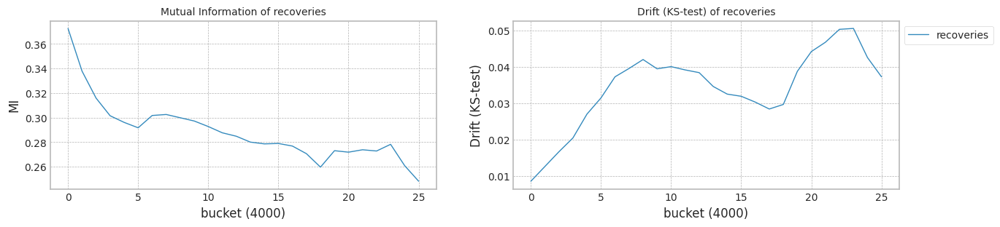

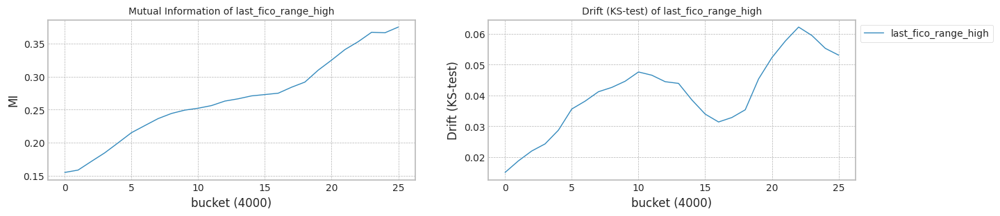

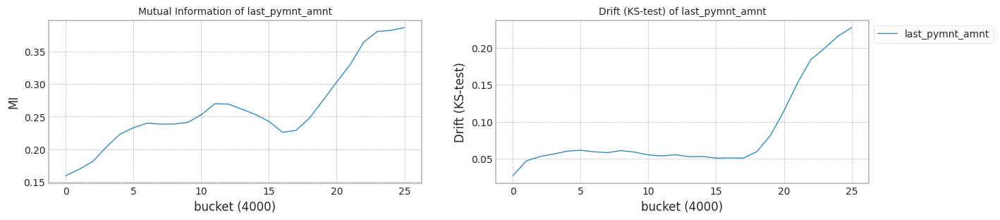

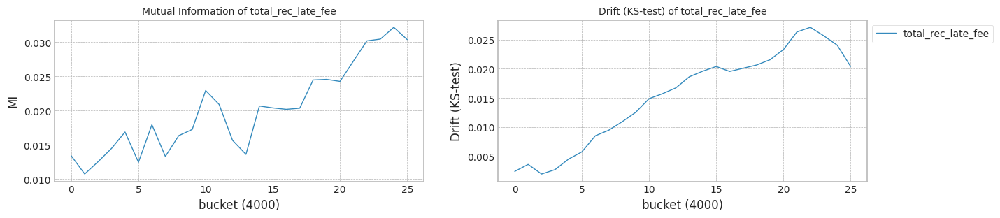

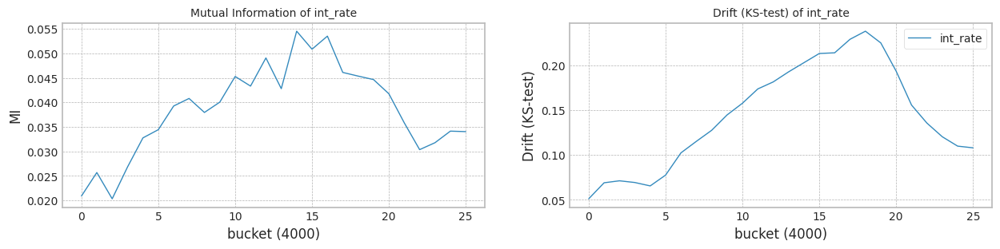

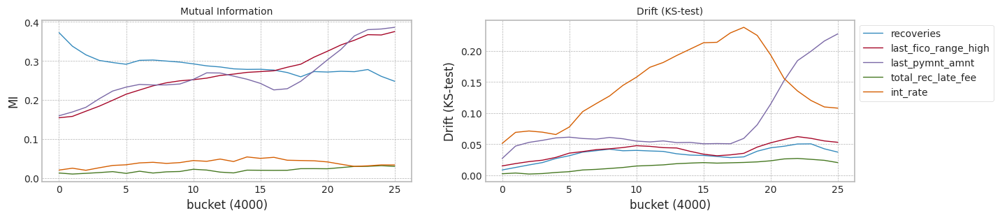

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.24it/s]


Test f1 score: 0.9315357887421821
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9116853036009894
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.65it/s]


Test f1 score: 0.9629099650849979
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.870098
last_fico_range_high    0.133927
last_pymnt_amnt         0.489763
total_rec_late_fee      0.945494
int_rate                0.153321
dtype: float64
Mean F1 for all data: 0.8996872581697285
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.8996872581697285
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.09it/s]


Test f1 score: 0.9149358956909927
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8892937557842946
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.45it/s]


Test f1 score: 0.973440574007638
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.859758
last_fico_range_high    0.114825
last_pymnt_amnt         0.489075
total_rec_late_fee      0.965750
int_rate                0.153598
dtype: float64
Mean F1 for all data: 0.9622513322839512
Normal model median        : 0.9004895296926421
Drift tolerant model median: 0.9309692952268398
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.91it/s]


Test f1 score: 0.9483997387328544
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9375235777252146
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.01it/s]


Test f1 score: 0.9734702733979459
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.860879
last_fico_range_high    0.165769
last_pymnt_amnt         0.083958
total_rec_late_fee      0.965721
int_rate                0.149587
dtype: float64
Mean F1 for all data: 0.9611210686444471
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.9611210686444471
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.74it/s]


Test f1 score: 0.9299447881696862
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9093841469423276
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.32it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.790958
last_fico_range_high    0.402056
last_pymnt_amnt         0.498523
total_rec_late_fee      0.923838
int_rate                0.135475
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model median        : 0.9105347252716585
Drift tolerant model median: 0.9304041634070879
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.46it/s]


Test f1 score: 0.9438628260992586
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9316019571171616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.59it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.887754
last_fico_range_high    0.105502
last_pymnt_amnt         0.493342
total_rec_late_fee      0.965750
int_rate                0.160677
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.8996872581697285
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.23it/s]


Test f1 score: 0.9339622641509433
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9151424942160997
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.07it/s]


Test f1 score: 0.9727900991816788
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.847850
last_fico_range_high    0.162983
last_pymnt_amnt         0.485815
total_rec_late_fee      0.921894
int_rate                0.154917
dtype: float64
Mean F1 for all data: 0.9589199045718734
Normal model median        : 0.9134138989085445
Drift tolerant model median: 0.9293035813708009
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 648.04it/s]


Test f1 score: 0.9137813985064493
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867861910860791
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.77it/s]


Test f1 score: 0.972732267298962
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.896958
last_fico_range_high    0.175465
last_pymnt_amnt         0.482092
total_rec_late_fee      0.946063
int_rate                0.151538
dtype: float64
Mean F1 for all data: 0.944534082862468
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.944534082862468
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.86it/s]


Test f1 score: 0.9304714833120453
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9096420996103313
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.21it/s]


Test f1 score: 0.9734016381580852
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.860069
last_fico_range_high    0.101585
last_pymnt_amnt         0.489681
total_rec_late_fee      0.946879
int_rate                0.141812
dtype: float64
Mean F1 for all data: 0.9331119888460393
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9388230358542536
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.83it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.25it/s]


Test f1 score: 0.9735296670234617
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.827917
last_fico_range_high    0.060956
last_pymnt_amnt         0.244265
total_rec_late_fee      0.965725
int_rate                0.151890
dtype: float64
Mean F1 for all data: 0.9641003331109237
Normal model median        : 0.9096420996103313
Drift tolerant model median: 0.944534082862468
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.12it/s]


Test f1 score: 0.9341360760375729
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9162468130034456
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.57it/s]


Test f1 score: 0.9731027302174918
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.848060
last_fico_range_high    0.133235
last_pymnt_amnt         0.495387
total_rec_late_fee      0.965750
int_rate                0.165944
dtype: float64
Mean F1 for all data: 0.9642193953762479
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9517269937171706
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.53it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.71it/s]


Test f1 score: 0.9733765482115985
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.860127
last_fico_range_high    0.120423
last_pymnt_amnt         0.477862
total_rec_late_fee      0.945490
int_rate                0.160298
dtype: float64
Mean F1 for all data: 0.9290023814188437
Normal model median        : 0.9096420996103313
Drift tolerant model median: 0.944534082862468
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.74it/s]


Test f1 score: 0.9385191652350241
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9233479736340093
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.57it/s]


Test f1 score: 0.9739996525566044
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.859979
last_fico_range_high    0.141852
last_pymnt_amnt         0.476050
total_rec_late_fee      0.993244
int_rate                0.157838
dtype: float64
Mean F1 for all data: 0.9562770077056872
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9504055452840776
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.36it/s]


Test f1 score: 0.9386105263157895
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9236263800175257
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.14it/s]


Test f1 score: 0.9729651583056239
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.860463
last_fico_range_high    0.113460
last_pymnt_amnt         0.488113
total_rec_late_fee      0.946233
int_rate                0.169529
dtype: float64
Mean F1 for all data: 0.932463087188154
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.944534082862468
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.32it/s]


Test f1 score: 0.9179459164162797
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.31it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8935746324871745
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.79it/s]


Test f1 score: 0.9730761444807542
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.828319
last_fico_range_high    0.139044
last_pymnt_amnt         0.490571
total_rec_late_fee      0.939117
int_rate                0.153769
dtype: float64
Mean F1 for all data: 0.9598656107093892
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9504055452840776
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.40it/s]


Test f1 score: 0.9171261669487363
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8928071580545702
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.47it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.860679
last_fico_range_high    0.140956
last_pymnt_amnt         0.504523
total_rec_late_fee      0.941290
int_rate                0.142762
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model median        : 0.9096420996103313
Drift tolerant model median: 0.944534082862468
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.14it/s]


Test f1 score: 0.9412096592191379
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9274718720234378
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.49it/s]


Test f1 score: 0.9729948534088937
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.862281
last_fico_range_high    0.123673
last_pymnt_amnt         0.486562
total_rec_late_fee      0.965750
int_rate                0.156248
dtype: float64
Mean F1 for all data: 0.9629926266992987
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9504055452840776
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.10it/s]


Test f1 score: 0.9374297910581891
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.29it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9220949808842456
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.32it/s]


Test f1 score: 0.9731605738084221
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.895225
last_fico_range_high    0.122113
last_pymnt_amnt         0.484865
total_rec_late_fee      0.945437
int_rate                0.153040
dtype: float64
Mean F1 for all data: 0.931010713185035
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.944534082862468
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.68it/s]


Test f1 score: 0.9355397774920334
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9176229150724697
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.41it/s]


Test f1 score: 0.9679516685845799
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.894488
last_fico_range_high    0.102808
last_pymnt_amnt         0.487221
total_rec_late_fee      0.948494
int_rate                0.147912
dtype: float64
Mean F1 for all data: 0.9028366095822324
Normal model median        : 0.9134138989085445
Drift tolerant model median: 0.9388230358542536
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.53it/s]


Test f1 score: 0.922117866754545
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8991483356899502
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.71it/s]


Test f1 score: 0.9725385905070243
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.832350
last_fico_range_high    0.148819
last_pymnt_amnt         0.493812
total_rec_late_fee      0.926692
int_rate                0.158056
dtype: float64
Mean F1 for all data: 0.9605215715432883
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.944534082862468
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.97it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.30it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.92it/s]


Test f1 score: 0.9729870430356315
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.878879
last_fico_range_high    0.140008
last_pymnt_amnt         0.492702
total_rec_late_fee      0.965750
int_rate                0.154169
dtype: float64
Mean F1 for all data: 0.9705772853503702
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9504055452840776
######################### Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9423881821797414
SEA median: 0.9423881821797414
######################### Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  3845.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9417539117668141
AUE median: 0.9417539117668141
######################### Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9457371559835414
DTEL median: 0.9457371559835414
######################### Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.60it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9299702722767407
SEA median: 0.936179227228241
######################### Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9310634610571124
AUE median: 0.9364086864119632
######################### Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9350062138895063
DTEL median: 0.9403716849365238
######################### Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.66it/s]


Early stop at  3897.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9563688828443475
SEA median: 0.9423881821797414
######################### Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  3970.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9545981634906476
AUE median: 0.9417539117668141
######################### Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.29it/s]


Early stop at  3659.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9588455945331561
DTEL median: 0.9457371559835414
######################### Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.65it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9406694952561414
SEA median: 0.9415288387179415
######################### Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:14<00:00,  1.75it/s]


Early stop at  3229.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9407233698247359
AUE median: 0.941238640795775
######################### Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448467746445495
DTEL median: 0.9452919653140455
######################### Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.57it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9531810954466562
SEA median: 0.9423881821797414
######################### Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  3727.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9515799692815418
AUE median: 0.9417539117668141
######################### Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:19<00:00,  1.33it/s]


Early stop at  2942.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9555970116116221
DTEL median: 0.9457371559835414
######################### Trial 5 for Normal model ###########################
retrain_interval: 14
######################### Trial 5 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9439759669307192
SEA median: 0.9431820745552303
######################### Trial 5 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9435089359588402
AUE median: 0.9426314238628272
######################### Trial 5 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:19<00:00,  1.35it/s]


Early stop at  2908.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9478021343341667
DTEL median: 0.9467696451588541
######################### Trial 6 for Normal model ###########################
retrain_interval: 14
######################### Trial 6 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.67it/s]


Early stop at  3681.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9281829018148964
SEA median: 0.9423881821797414
######################### Trial 6 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9291603643085631
AUE median: 0.9417539117668141
######################### Trial 6 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.29it/s]


Early stop at  3723.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9338106729701277
DTEL median: 0.9457371559835414
######################### Trial 7 for Normal model ###########################
retrain_interval: 14
######################### Trial 7 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9408162424062934
SEA median: 0.9416022122930174
######################### Trial 7 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9396251308331733
AUE median: 0.941238640795775
######################### Trial 7 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.26it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448387903583757
DTEL median: 0.9452919653140455
######################### Trial 8 for Normal model ###########################
retrain_interval: 14
######################### Trial 8 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:14<00:00,  1.75it/s]


Early stop at  2738.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9301159612533076
SEA median: 0.9408162424062934
######################### Trial 8 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.60it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9293990344552058
AUE median: 0.9407233698247359
######################### Trial 8 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9343747243111851
DTEL median: 0.9448467746445495
######################### Trial 9 for Normal model ###########################
retrain_interval: 14
######################### Trial 9 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448714108595353
SEA median: 0.9416022122930174
######################### Trial 9 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.60it/s]


Early stop at  3867.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9439420975618575
AUE median: 0.941238640795775
######################### Trial 9 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.29it/s]


Early stop at  3572.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9481250379644144
DTEL median: 0.9452919653140455
######################### Trial 10 for Normal model ###########################
retrain_interval: 14
######################### Trial 10 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9292330845870379
SEA median: 0.9408162424062934
######################### Trial 10 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.60it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9301540666797729
AUE median: 0.9407233698247359
######################### Trial 10 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.26it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9337936583976619
DTEL median: 0.9448467746445495
######################### Trial 11 for Normal model ###########################
retrain_interval: 14
######################### Trial 11 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9484871542651742
SEA median: 0.9416022122930174
######################### Trial 11 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9455581195978865
AUE median: 0.941238640795775
######################### Trial 11 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.24it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9517482350837998
DTEL median: 0.9452919653140455
######################### Trial 12 for Normal model ###########################
retrain_interval: 14
######################### Trial 12 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  3737.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9491201456191385
SEA median: 0.9423881821797414
######################### Trial 12 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  3826.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9480181765706004
AUE median: 0.9417539117668141
######################### Trial 12 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  3715.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9516174878119306
DTEL median: 0.9457371559835414
######################### Trial 13 for Normal model ###########################
retrain_interval: 14
######################### Trial 13 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.68it/s]


Early stop at  3461.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9326450691172934
SEA median: 0.9416022122930174
######################### Trial 13 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9318325721756584
AUE median: 0.941238640795775
######################### Trial 13 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9370397894637189
DTEL median: 0.9452919653140455
######################### Trial 14 for Normal model ###########################
retrain_interval: 14
######################### Trial 14 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.66it/s]


Early stop at  3684.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.932199501187272
SEA median: 0.9408162424062934
######################### Trial 14 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9324553333110277
AUE median: 0.9407233698247359
######################### Trial 14 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9370408987847886
DTEL median: 0.9448467746445495
######################### Trial 15 for Normal model ###########################
retrain_interval: 14
######################### Trial 15 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9506924608612907
SEA median: 0.9416022122930174
######################### Trial 15 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9481558145417299
AUE median: 0.941238640795775
######################### Trial 15 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9536041805779607
DTEL median: 0.9452919653140455
######################### Trial 16 for Normal model ###########################
retrain_interval: 14
######################### Trial 16 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9480089658696854
SEA median: 0.9423881821797414
######################### Trial 16 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9466324878161967
AUE median: 0.9417539117668141
######################### Trial 16 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9509377910220423
DTEL median: 0.9457371559835414
######################### Trial 17 for Normal model ###########################
retrain_interval: 14
######################### Trial 17 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9452996272734898
SEA median: 0.9431820745552303
######################### Trial 17 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448030526605002
AUE median: 0.9426314238628272
######################### Trial 17 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.948739975156626
DTEL median: 0.9467696451588541
######################### Trial 18 for Normal model ###########################
retrain_interval: 14
######################### Trial 18 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.935473949825933
SEA median: 0.9423881821797414
######################### Trial 18 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9357171482552211
AUE median: 0.9417539117668141
######################### Trial 18 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:19<00:00,  1.30it/s]


Early stop at  3620.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9398139348106417
DTEL median: 0.9457371559835414
######################### Trial 19 for Normal model ###########################
retrain_interval: 14
######################### Trial 19 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9295661814036754
SEA median: 0.9416022122930174
######################### Trial 19 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9304316777321889
AUE median: 0.941238640795775
######################### Trial 19 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9339312963134089
DTEL median: 0.9452919653140455


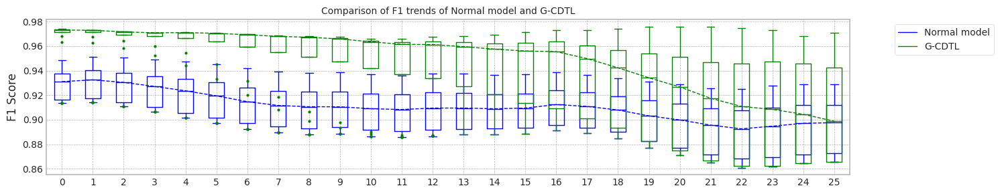

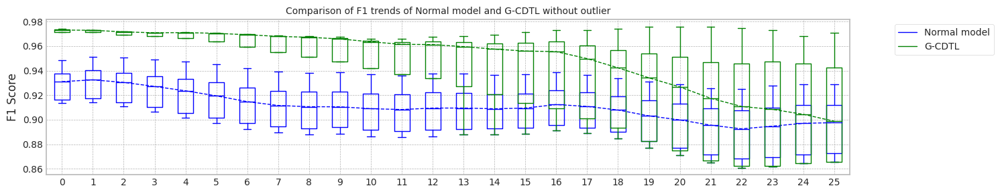

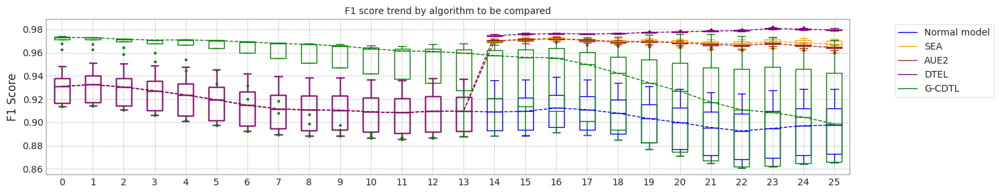

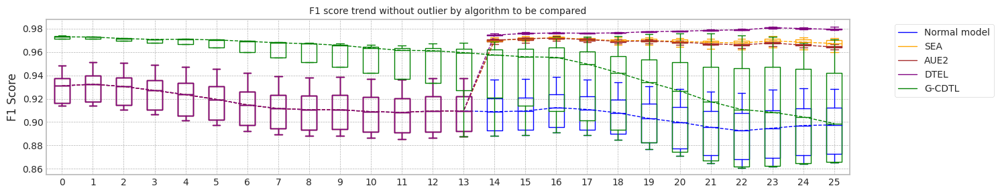

max_mean_trial= 19


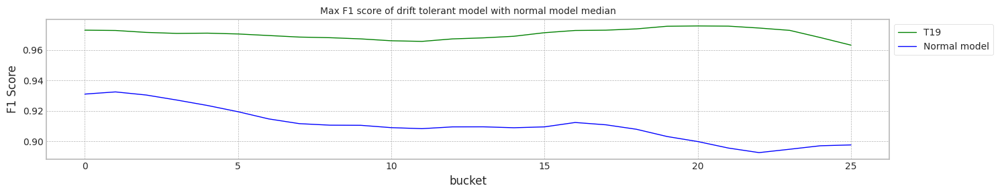

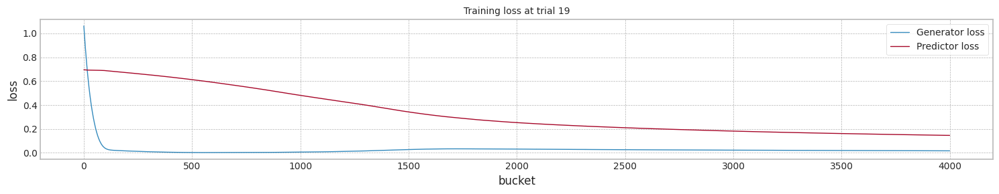

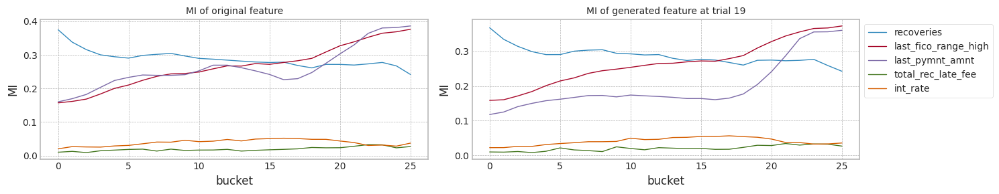

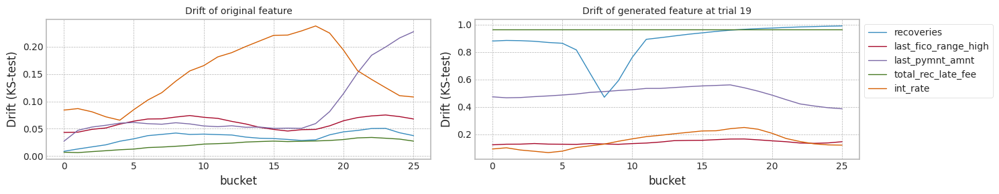

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.911685,0.899187,10.943624
1,1.0,0.914936,0.915483,0.889294,0.869137,11.107749
2,2.0,0.948400,0.951299,0.937524,0.928591,11.077107
3,3.0,0.929945,0.931279,0.909384,0.895627,11.014527
4,4.0,0.943863,0.946336,0.931602,0.923030,10.938602
5,5.0,0.933962,0.935815,0.915142,0.902838,10.936441
6,6.0,0.913781,0.914224,0.886786,0.865555,11.017387
7,7.0,0.930471,0.931903,0.909642,0.896045,10.814813
8,8.0,0.913811,0.914253,0.886793,0.865538,11.104182
9,9.0,0.934136,0.936079,0.916247,0.904848,10.934622


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.942388,0.967395,15.860427
1,1.0,0.914936,0.915483,0.929970,0.962654,16.234294
2,2.0,0.948400,0.951299,0.956369,0.971768,15.724613
3,3.0,0.929945,0.931279,0.940669,0.965399,15.817159
4,4.0,0.943863,0.946336,0.953181,0.971045,16.579235
5,5.0,0.933962,0.935815,0.943976,0.967145,15.968711
6,6.0,0.913781,0.914224,0.928183,0.959821,15.602455
7,7.0,0.930471,0.931903,0.940816,0.968185,15.858483
8,8.0,0.913811,0.914253,0.930116,0.967226,14.895895
9,9.0,0.934136,0.936079,0.944871,0.968814,16.193104


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.941754,0.965576,16.039106
1,1.0,0.914936,0.915483,0.931063,0.965843,16.172135
2,2.0,0.948400,0.951299,0.954598,0.963901,15.951674
3,3.0,0.929945,0.931279,0.940723,0.963867,14.912916
4,4.0,0.943863,0.946336,0.951580,0.965454,16.201480
5,5.0,0.933962,0.935815,0.943509,0.963820,16.070765
6,6.0,0.913781,0.914224,0.929160,0.963746,15.987134
7,7.0,0.930471,0.931903,0.939625,0.962591,15.876507
8,8.0,0.913811,0.914253,0.929399,0.964140,16.292897
9,9.0,0.934136,0.936079,0.943942,0.964903,16.292020


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.945737,0.979266,20.757053
1,1.0,0.914936,0.915483,0.935006,0.980171,20.840945
2,2.0,0.948400,0.951299,0.958846,0.979283,20.163856
3,3.0,0.929945,0.931279,0.944847,0.980001,20.485422
4,4.0,0.943863,0.946336,0.955597,0.978593,19.628727
5,5.0,0.933962,0.935815,0.947802,0.980019,19.228904
6,6.0,0.913781,0.914224,0.933811,0.978918,20.207744
7,7.0,0.930471,0.931903,0.944839,0.979096,20.619964
8,8.0,0.913811,0.914253,0.934375,0.981346,20.760953
9,9.0,0.934136,0.936079,0.948125,0.979233,20.188892


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.962910,0.962584,0.899687,0.865538,10.613886
1,1.0,0.973441,0.973042,0.962251,0.948283,10.678942
2,2.0,0.973470,0.973071,0.961121,0.940375,10.822562
3,3.0,0.913811,0.914253,0.886793,0.865538,10.750808
4,4.0,0.913811,0.914253,0.886793,0.865538,10.761098
5,5.0,0.972790,0.972505,0.958920,0.935090,10.788019
6,6.0,0.972732,0.972533,0.944534,0.883945,10.728482
7,7.0,0.973402,0.973062,0.933112,0.867055,10.688682
8,8.0,0.973530,0.973131,0.964100,0.970981,10.669811
9,9.0,0.973103,0.972929,0.964219,0.958420,10.765936


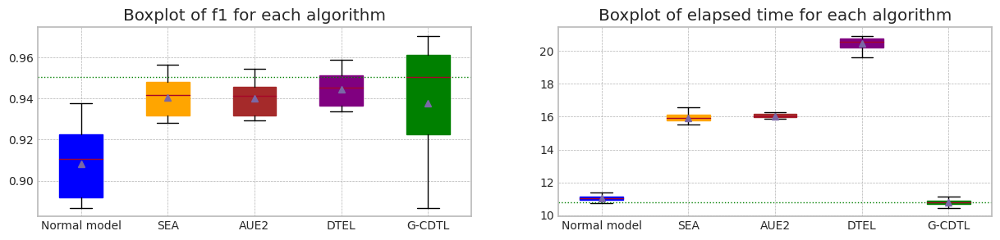

In [104]:
seed_everything()

#s = np.sort(np.random.choice(len(COLUMNS),2,replace= False))
top_columns = list(mi_scores[0:5].index)
top_columns
print('columns:',top_columns)
#print(s.shape)
X4 = X3[top_columns]

train_size = 10000*2
test_size = 2000*2

X1,Y1 = check_mi_drift(X4, Y3, train_size, test_size)

bucket_size = 500*2
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 600,trial_count=20,lr_g=0.0001,weight_init= True)

### #2 날짜 단위로 bucket 만들기

#### data 정제

In [105]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
#df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    #df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values


2010
2011
2012
2013
2014
2015
2016
2017
2018


In [106]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'issue_d', 'dti',
       'delinq_2yrs', 'fico_range_high', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'last_pymnt_amnt',
       'last_fico_range_high', 'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],


In [107]:
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = list(COLUMNS))#[top_columns+['issue_d']]

In [108]:
X2

,loan_amnt,term,int_rate,annual_inc,issue_d,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,...,renewable_energy,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y
0,12000.0,36,13.57,42000.0,201001,21.77,0.0,684.0,2.0,10.0,...,0,0,0,0,0,0,0,1,0,0
1,7500.0,36,12.18,26000.0,201001,0.0,0.0,764.0,3.0,5.0,...,0,0,0,0,0,0,0,1,0,0
2,10000.0,36,14.61,62400.0,201001,8.46,0.0,714.0,1.0,7.0,...,0,0,0,0,1,0,0,0,0,0
3,15000.0,36,16.0,96000.0,201001,11.13,2.0,664.0,2.0,13.0,...,0,0,0,0,0,0,0,1,0,0
4,20000.0,36,11.83,105000.0,201001,13.87,0.0,759.0,0.0,9.0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279675,4800.0,36,9.93,90000.0,201712,20.81,0.0,704.0,0.0,11.0,...,0,0,0,0,0,0,0,1,0,0
1279676,15000.0,36,9.93,150000.0,201712,10.16,0.0,739.0,0.0,6.0,...,0,0,0,0,1,0,0,0,0,0
1279677,9600.0,36,7.97,40500.0,201712,13.75,0.0,709.0,1.0,21.0,...,0,0,0,0,0,0,0,1,0,0
1279678,32000.0,36,5.32,45000.0,201712,28.96,0.0,779.0,0.0,17.0,...,0,0,0,0,1,0,0,0,0,0


In [109]:
from datetime import date
from datetime import datetime

def date_bucket_num(d,start_day='20100101'):
    date1 = datetime.strptime(start_day, '%Y%m%d')
    date2 = datetime.strptime(str(d)+'01', '%Y%m%d')
    delta = date2 - date1
    return int(delta.days/30)

In [110]:
X2['b'] = [date_bucket_num(d) for d in X2['issue_d']]

In [111]:
b_cnt = X2.groupby(['b'])['b'].count()

In [112]:
# 1/10 로 사이즈 줄이기...
seed_everything()
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = X2.iloc[s,:]
Y3 = Y2[s]

In [113]:
b_cnt2 = X3.groupby(['b'])['b'].count()

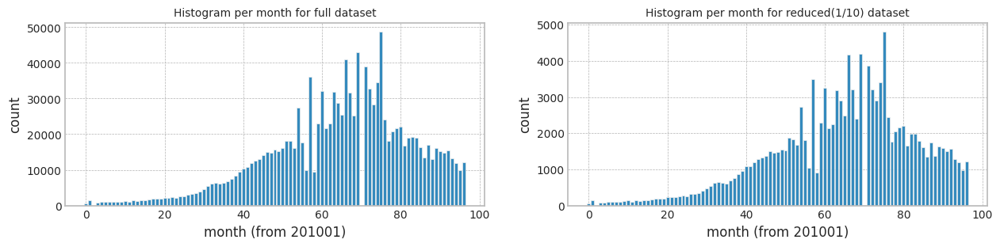

In [114]:
fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
ax[0].bar(b_cnt.index,b_cnt.values)
ax[0].set_ylabel('count')
ax[0].set_xlabel('month (from 201001)')
ax[0].set_title(f'Histogram per month for full dataset',fontdict={'fontsize':10})

ax[1].bar(b_cnt2.index,b_cnt2.values)
ax[1].set_ylabel('count')
ax[1].set_xlabel('month (from 201001)')
ax[1].set_title(f'Histogram per month for reduced(1/10) dataset',fontdict={'fontsize':10})

plt.show()

In [115]:
X3.drop(columns=['issue_d'],inplace=True)

In [116]:
X3

,loan_amnt,term,int_rate,annual_inc,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,pub_rec,...,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y,b
8,9000.0,36,8.94,44000.0,8.97,0.0,749.0,1.0,14.0,0.0,...,0,0,0,0,0,0,1,0,0,0
19,21125.0,36,13.92,87000.0,18.33,0.0,704.0,1.0,9.0,0.0,...,0,0,0,1,0,0,0,0,0,0
41,24250.0,36,12.53,287000.0,13.89,0.0,729.0,2.0,15.0,0.0,...,0,0,0,0,0,0,1,0,0,0
43,5000.0,36,13.92,38000.0,5.68,0.0,689.0,1.0,5.0,0.0,...,0,0,0,0,0,0,1,0,0,0
52,13000.0,36,8.59,100000.0,18.35,0.0,784.0,2.0,18.0,0.0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279596,8000.0,36,7.35,27000.0,22.36,0.0,719.0,0.0,14.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279609,29375.0,60,30.75,90000.0,44.94,0.0,689.0,1.0,20.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279627,2500.0,36,10.42,48000.0,25.23,0.0,794.0,1.0,9.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279639,18500.0,36,13.59,45000.0,35.71,1.0,709.0,0.0,14.0,0.0,...,0,0,0,1,0,0,0,0,0,96


#### Drift tolerant 학습

In [117]:
from more_itertools import locate
def find_indices(list_to_check, item_to_find):
    indices = locate(list_to_check, lambda x: x == item_to_find)
    return list(indices)

In [118]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    columns = X.columns
    is_Has_bucket = False
    # 'b' 즉, bucket count 가 있으며, 'b'를 제외 시킨다.
    if 'b' in columns:
        print('Dataset has buckets!')
        columns = columns[0:-1]
        buckets = list(X['b'])
        X = X[columns]
        is_Has_bucket = True

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    if is_Has_bucket:
        b_min = min(buckets[-X_live.shape[0]:])
        b_max = max(buckets[-X_live.shape[0]:])
        print(f'bucket range in live set {b_min}~{b_max}')
        for i in range(b_min,b_max+1):
            s = find_indices(buckets,i)
            if len(s) > 0:
                xl = X.iloc[s]
                yl = Y[s]
                X_live_set.append(xl)
                Y_live_set.append(yl)
    else:
        for i in range(int(X_live.shape[0]/test_size)):
            xl = X_live[i*test_size:i*test_size+train_size]
            yl = Y_live[i*test_size:i*test_size+train_size]

            if len(xl) ==  train_size:
                X_live_set.append(xl)
                Y_live_set.append(yl)
            else:
                #print(xl.shape)
                truncate_count = xl.shape[0] #truncate_count + len(xl)
                break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    if is_Has_bucket:
        X['b'] = buckets
    return X,Y

train_size 19361
Dataset has buckets!
MI Analysis MI Max 0.28519, Min 0.01947, Mean 0.17442, Std 0.12009
Dataset structure X_train, (19361, 5) X_test, (19361, 5) X_live (123968, 5)
bucket range in live set 26~96
Truncate 0 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (70,)


100%|██████████| 70/70 [00:03<00:00, 21.40it/s]


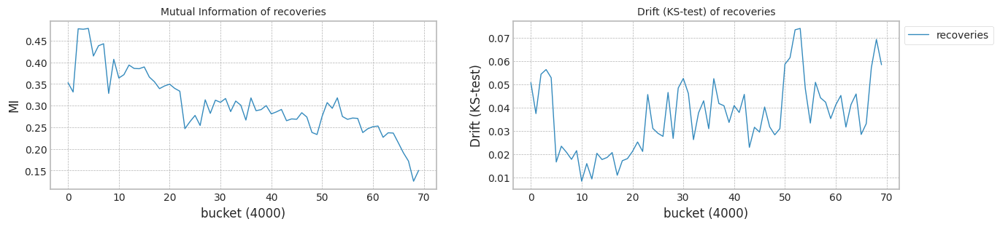

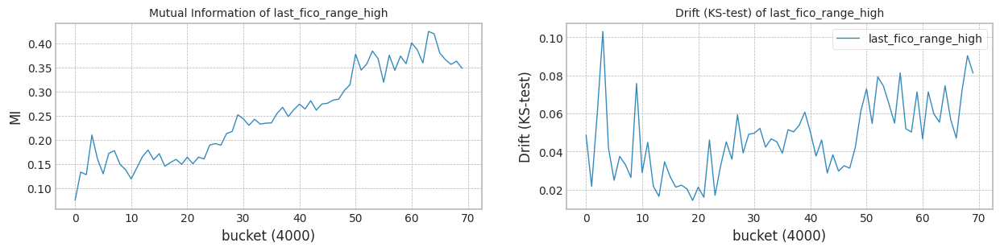

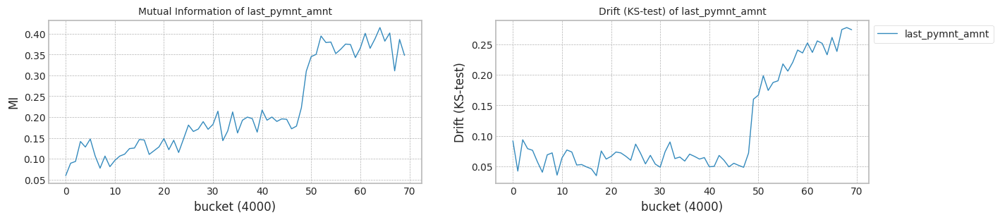

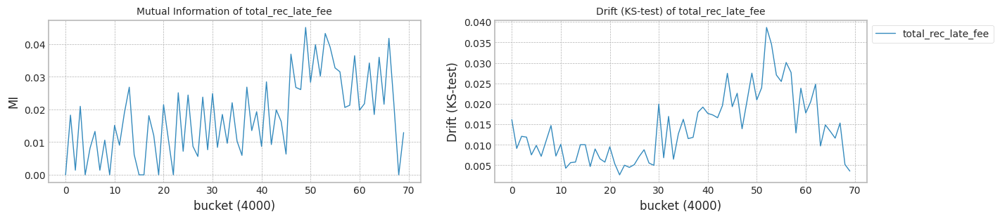

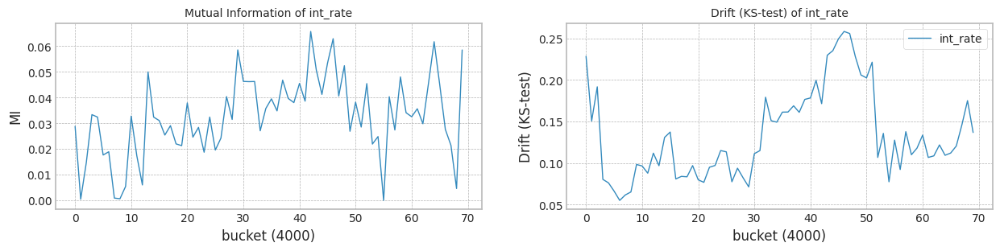

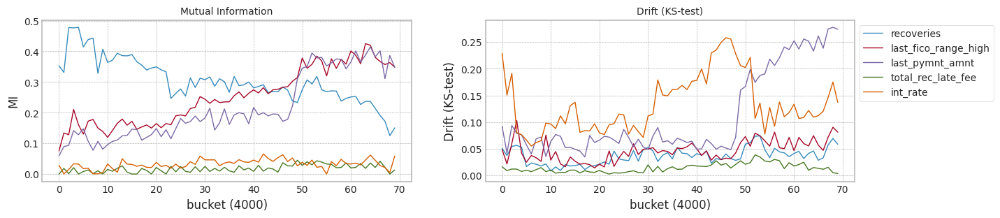

In [119]:
top_columns = list(mi_scores[0:5].index)
top_columns

train_size = X3[X3['b'] < 46].shape[0] # 2010년 1월에서 39개월 (약 3년6개월간의 data)
print('train_size',train_size)
test_size = 4000

X1,Y1 = check_mi_drift(X3[top_columns+['b']], Y3, train_size, test_size)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.76it/s]


Test f1 score: 0.9315611184474939
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9115340040966659
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.03it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.839190
last_fico_range_high    0.118193
last_pymnt_amnt         0.456381
total_rec_late_fee      0.923097
int_rate                0.150386
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.8863519677174436
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.05it/s]


Test f1 score: 0.9149169407201282
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8886184249459659
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.16it/s]


Test f1 score: 0.9734703632887189
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.860508
last_fico_range_high    0.211504
last_pymnt_amnt         0.443587
total_rec_late_fee      0.966117
int_rate                0.145680
dtype: float64
Mean F1 for all data: 0.9604134556403301
Normal model median        : 0.9000762145213159
Drift tolerant model median: 0.9233827116788869
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.66it/s]


Test f1 score: 0.9479673842904911
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9373019960239893
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.60it/s]


Test f1 score: 0.9735576204846276
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.861336
last_fico_range_high    0.061978
last_pymnt_amnt         0.090937
total_rec_late_fee      0.912908
int_rate                0.145516
dtype: float64
Mean F1 for all data: 0.9603925493741498
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9603925493741498
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.57it/s]


Test f1 score: 0.929940685979541
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9092146159188006
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.07it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860355
last_fico_range_high    0.226174
last_pymnt_amnt         0.448863
total_rec_late_fee      0.910412
int_rate                0.145422
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9103743100077333
Drift tolerant model median: 0.9233722585457966
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.34it/s]


Test f1 score: 0.9436553860541235
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315481678177596
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.60it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.884093
last_fico_range_high    0.117435
last_pymnt_amnt         0.447276
total_rec_late_fee      0.966117
int_rate                0.148990
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.8863519677174436
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.61it/s]


Test f1 score: 0.9365424160801692
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9198724335082643
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.31it/s]


Test f1 score: 0.9727712426106168
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860938
last_fico_range_high    0.234798
last_pymnt_amnt         0.447830
total_rec_late_fee      0.965842
int_rate                0.148211
dtype: float64
Mean F1 for all data: 0.9598060923729962
Normal model median        : 0.9157032188024651
Drift tolerant model median: 0.9230790300452199
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.36it/s]


Test f1 score: 0.9139202872128572
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8864040052053528
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.32it/s]


Test f1 score: 0.9729439168607776
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.48it/s]


mean of drift:
recoveries              0.837472
last_fico_range_high    0.156647
last_pymnt_amnt         0.445722
total_rec_late_fee      0.966117
int_rate                0.144360
dtype: float64
Mean F1 for all data: 0.9602900009592165
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9598060923729962
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.56it/s]


Test f1 score: 0.9305260742355573
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9097677221480565
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.95it/s]


Test f1 score: 0.9735756561248281
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860550
last_fico_range_high    0.129273
last_pymnt_amnt         0.448609
total_rec_late_fee      0.913465
int_rate                0.138646
dtype: float64
Mean F1 for all data: 0.9604171040568438
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9600480466661063
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.77it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.96it/s]


Test f1 score: 0.973677134064358
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.831440
last_fico_range_high    0.060544
last_pymnt_amnt         0.107828
total_rec_late_fee      0.966091
int_rate                0.146404
dtype: float64
Mean F1 for all data: 0.9624386393298676
Normal model median        : 0.9097677221480565
Drift tolerant model median: 0.9602900009592165
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.76it/s]


Test f1 score: 0.9341893136803316
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9161468347742108
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.51it/s]


Test f1 score: 0.9733524526498177
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860564
last_fico_range_high    0.121152
last_pymnt_amnt         0.443411
total_rec_late_fee      0.966117
int_rate                0.148492
dtype: float64
Mean F1 for all data: 0.9602839030315502
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.96it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.37it/s]


Test f1 score: 0.9736983681032937
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860521
last_fico_range_high    0.122137
last_pymnt_amnt         0.436490
total_rec_late_fee      0.911517
int_rate                0.149409
dtype: float64
Mean F1 for all data: 0.9606837719568625
Normal model median        : 0.9097677221480565
Drift tolerant model median: 0.9602900009592165
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.28it/s]


Test f1 score: 0.9384727272727272
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9232970825838207
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.69it/s]


Test f1 score: 0.9731732090577763
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860891
last_fico_range_high    0.166165
last_pymnt_amnt         0.444770
total_rec_late_fee      0.918991
int_rate                0.149887
dtype: float64
Mean F1 for all data: 0.9602263361246611
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.36it/s]


Test f1 score: 0.9384512799698489
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9236456501804697
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.13it/s]


Test f1 score: 0.9730924294460205
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.860906
last_fico_range_high    0.195657
last_pymnt_amnt         0.449644
total_rec_late_fee      0.911523
int_rate                0.153141
dtype: float64
Mean F1 for all data: 0.9602412325308487
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9602839030315502
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.55it/s]


Test f1 score: 0.917968970380818
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8931200994189447
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.19it/s]


Test f1 score: 0.9731796188997073
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.860740
last_fico_range_high    0.125030
last_pymnt_amnt         0.442625
total_rec_late_fee      0.966117
int_rate                0.145898
dtype: float64
Mean F1 for all data: 0.9602908523073636
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.14it/s]


Test f1 score: 0.9172563502579572
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8923747009005883
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.54it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860814
last_fico_range_high    0.135563
last_pymnt_amnt         0.459195
total_rec_late_fee      0.910511
int_rate                0.143804
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9097677221480565
Drift tolerant model median: 0.9602839030315502
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.78it/s]


Test f1 score: 0.9429746521599627
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9299428898111048
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.27it/s]


Test f1 score: 0.9732409509019233
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.834002
last_fico_range_high    0.084274
last_pymnt_amnt         0.445078
total_rec_late_fee      0.966117
int_rate                0.148018
dtype: float64
Mean F1 for all data: 0.9603434862606328
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.80it/s]


Test f1 score: 0.9375380776929995
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9221737411901783
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.62it/s]


Test f1 score: 0.9732668239792107
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.830893
last_fico_range_high    0.135467
last_pymnt_amnt         0.451978
total_rec_late_fee      0.909254
int_rate                0.145728
dtype: float64
Mean F1 for all data: 0.960804547658361
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9602900009592165
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.93it/s]


Test f1 score: 0.9355006351772721
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9174538788626201
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.29it/s]


Test f1 score: 0.9667675508871877
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.829677
last_fico_range_high    0.117879
last_pymnt_amnt         0.436873
total_rec_late_fee      0.912552
int_rate                0.150631
dtype: float64
Mean F1 for all data: 0.9447252871807236
Normal model median        : 0.9138404194354384
Drift tolerant model median: 0.9602869519953834
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.16it/s]


Test f1 score: 0.9221040691904154
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8986969130456073
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.03it/s]


Test f1 score: 0.9730020308206905
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


mean of drift:
recoveries              0.861000
last_fico_range_high    0.152537
last_pymnt_amnt         0.450206
total_rec_late_fee      0.966117
int_rate                0.148483
dtype: float64
Mean F1 for all data: 0.9601253802381764
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9602839030315502
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.30it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.37it/s]


Test f1 score: 0.9730843913368187
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860782
last_fico_range_high    0.134715
last_pymnt_amnt         0.447058
total_rec_late_fee      0.966117
int_rate                0.147071
dtype: float64
Mean F1 for all data: 0.9640498487249046
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9434372175874329
SEA median: 0.9434372175874329
######################### Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9427118678737009
AUE median: 0.9427118678737009
######################### Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9469126677472031
DTEL median: 0.9469126677472031
######################### Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315806279513832
SEA median: 0.937508922769408
######################### Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9324359392321002
AUE median: 0.9375739035529005
######################### Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.936420709499617
DTEL median: 0.94166668862341
######################### Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.72it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9569764865466575
SEA median: 0.9434372175874329
######################### Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  3946.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9550165232138966
AUE median: 0.9427118678737009
######################### Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.34it/s]


Early stop at  3690.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9594066711429882
DTEL median: 0.9469126677472031
######################### Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9421074854913221
SEA median: 0.9427723515393776
######################### Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:14<00:00,  1.81it/s]


Early stop at  3269.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9420176664530663
AUE median: 0.9423647671633836
######################### Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.33it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9461391703462567
DTEL median: 0.9465259190467299
######################### Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9538313866175009
SEA median: 0.9434372175874329
######################### Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.75it/s]


Early stop at  3650.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.952187059519167
AUE median: 0.9427118678737009
######################### Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9564025409267808
DTEL median: 0.9469126677472031
######################### Trial 5 for Normal model ###########################
retrain_interval: 14
######################### Trial 5 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.77it/s]


Early stop at  3528.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9475162616355332
SEA median: 0.945476739611483
######################### Trial 5 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.946717421467241
AUE median: 0.944714644670471
######################### Trial 5 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:19<00:00,  1.38it/s]


Early stop at  3433.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9510743267390125
DTEL median: 0.9489934972431078
######################### Trial 6 for Normal model ###########################
retrain_interval: 14
######################### Trial 6 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.76it/s]


Early stop at  3619.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9305260838952056
SEA median: 0.9434372175874329
######################### Trial 6 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9306094657016183
AUE median: 0.9427118678737009
######################### Trial 6 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:18<00:00,  1.45it/s]


Early stop at  2639.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.935475450892014
DTEL median: 0.9469126677472031
######################### Trial 7 for Normal model ###########################
retrain_interval: 14
######################### Trial 7 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.942008107484213
SEA median: 0.9427723515393776
######################### Trial 7 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9406764532397117
AUE median: 0.9423647671633836
######################### Trial 7 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9461982978843603
DTEL median: 0.9465554828157816
######################### Trial 8 for Normal model ###########################
retrain_interval: 14
######################### Trial 8 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.72it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9317845526448318
SEA median: 0.9421074854913221
######################### Trial 8 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9308501150464421
AUE median: 0.9420176664530663
######################### Trial 8 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9359139187835843
DTEL median: 0.9461982978843603
######################### Trial 9 for Normal model ###########################
retrain_interval: 14
######################### Trial 9 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9457952957868749
SEA median: 0.9427723515393776
######################### Trial 9 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.77it/s]


Early stop at  3475.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9448210070744087
AUE median: 0.9423647671633836
######################### Trial 9 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.94917462558209
DTEL median: 0.9465554828157816
######################### Trial 10 for Normal model ###########################
retrain_interval: 14
######################### Trial 10 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9306513084101695
SEA median: 0.9421074854913221
######################### Trial 10 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.73it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315662820151738
AUE median: 0.9420176664530663
######################### Trial 10 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9355115015239918
DTEL median: 0.9461982978843603
######################### Trial 11 for Normal model ###########################
retrain_interval: 14
######################### Trial 11 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.75it/s]


Early stop at  3652.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9496001424725632
SEA median: 0.9427723515393776
######################### Trial 11 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9463950642864886
AUE median: 0.9423647671633836
######################### Trial 11 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9525449576021937
DTEL median: 0.9465554828157816
######################### Trial 12 for Normal model ###########################
retrain_interval: 14
######################### Trial 12 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.78it/s]


Early stop at  3378.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9499718199737395
SEA median: 0.9434372175874329
######################### Trial 12 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  3875.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9485428821951696
AUE median: 0.9427118678737009
######################### Trial 12 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:19<00:00,  1.39it/s]


Early stop at  3226.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9527050009564293
DTEL median: 0.9469126677472031
######################### Trial 13 for Normal model ###########################
retrain_interval: 14
######################### Trial 13 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  3916.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9343424077103123
SEA median: 0.9427723515393776
######################### Trial 13 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.67it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9333091907547976
AUE median: 0.9423647671633836
######################### Trial 13 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9385764663011004
DTEL median: 0.9465554828157816
######################### Trial 14 for Normal model ###########################
retrain_interval: 14
######################### Trial 14 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9338212786420397
SEA median: 0.9421074854913221
######################### Trial 14 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9338030503980634
AUE median: 0.9420176664530663
######################### Trial 14 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9384694052188743
DTEL median: 0.9461982978843603
######################### Trial 15 for Normal model ###########################
retrain_interval: 14
######################### Trial 15 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9527689810184283
SEA median: 0.9427723515393776
######################### Trial 15 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9500320997895386
AUE median: 0.9423647671633836
######################### Trial 15 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.955808106952902
DTEL median: 0.9465554828157816
######################### Trial 16 for Normal model ###########################
retrain_interval: 14
######################### Trial 16 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.948969997656747
SEA median: 0.9434372175874329
######################### Trial 16 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9475597986263469
AUE median: 0.9427118678737009
######################### Trial 16 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.34it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9519216633367501
DTEL median: 0.9469126677472031
######################### Trial 17 for Normal model ###########################
retrain_interval: 14
######################### Trial 17 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.72it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9461353536503341
SEA median: 0.9446162566871539
######################### Trial 17 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.73it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9457556529523904
AUE median: 0.9437664374740549
######################### Trial 17 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.34it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9498098434309357
DTEL median: 0.9480436466646465
######################### Trial 18 for Normal model ###########################
retrain_interval: 14
######################### Trial 18 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9366234069379338
SEA median: 0.9434372175874329
######################### Trial 18 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9367770884818413
AUE median: 0.9427118678737009
######################### Trial 18 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:19<00:00,  1.36it/s]


Early stop at  3454.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9409907863747304
DTEL median: 0.9469126677472031
######################### Trial 19 for Normal model ###########################
retrain_interval: 14
######################### Trial 19 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  3956.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9310201869915851
SEA median: 0.9427723515393776
######################### Trial 19 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.67it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9317932869869191
AUE median: 0.9423647671633836
######################### Trial 19 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.33it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9356282927391766
DTEL median: 0.9465554828157816


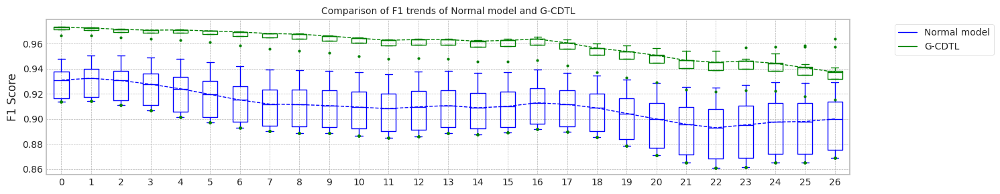

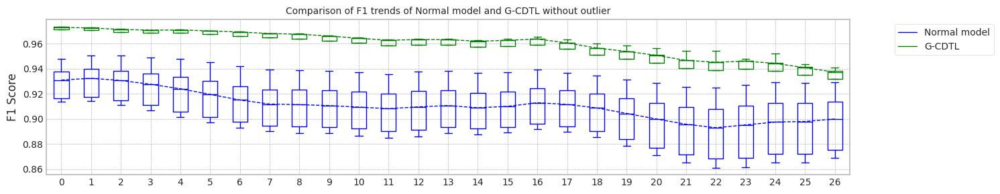

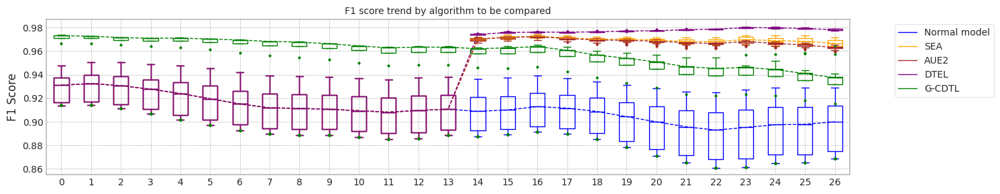

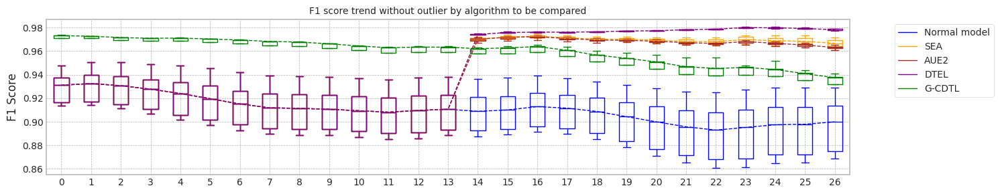

max_mean_trial= 19


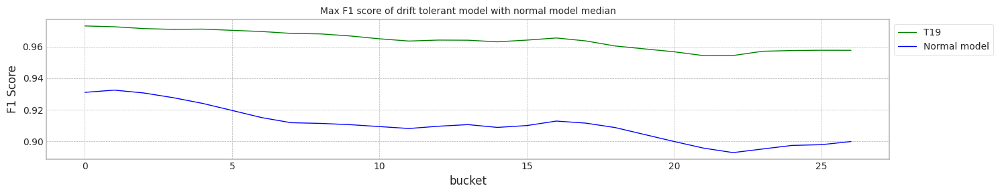

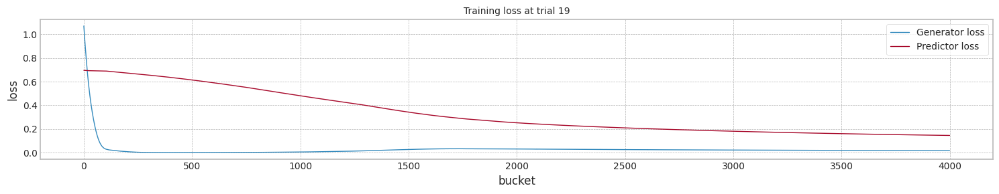

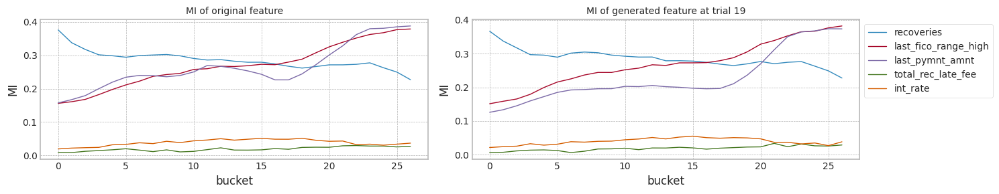

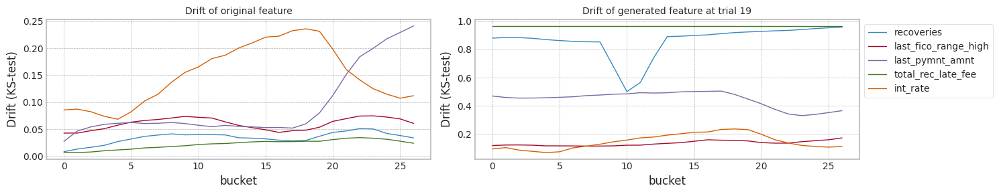

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.911534,0.901259,11.379239
1,1.0,0.914917,0.915411,0.888618,0.871554,11.276924
2,2.0,0.947967,0.950835,0.937302,0.929225,11.182854
3,3.0,0.929941,0.931322,0.909215,0.897891,11.221706
4,4.0,0.943655,0.946107,0.931548,0.924324,11.228681
5,5.0,0.936542,0.938706,0.919872,0.910125,11.439250
6,6.0,0.913920,0.914225,0.886404,0.869075,11.079628
7,7.0,0.930526,0.931928,0.909768,0.898559,11.368684
8,8.0,0.913981,0.914286,0.886352,0.868803,11.125999
9,9.0,0.934189,0.936073,0.916147,0.906747,11.135548


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.943437,0.965954,15.998663
1,1.0,0.914917,0.915411,0.931581,0.962783,15.982797
2,2.0,0.947967,0.950835,0.956976,0.971848,15.749534
3,3.0,0.929941,0.931322,0.942107,0.965733,15.936639
4,4.0,0.943655,0.946107,0.953831,0.969756,16.015630
5,5.0,0.936542,0.938706,0.947516,0.967866,15.249601
6,6.0,0.913920,0.914225,0.930526,0.960847,15.366096
7,7.0,0.930526,0.931928,0.942008,0.967109,15.960129
8,8.0,0.913981,0.914286,0.931785,0.966218,15.760332
9,9.0,0.934189,0.936073,0.945795,0.968102,15.885425


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.942712,0.963624,16.006109
1,1.0,0.914917,0.915411,0.932436,0.964399,16.079503
2,2.0,0.947967,0.950835,0.955017,0.962696,15.924646
3,3.0,0.929941,0.931322,0.942018,0.963589,14.945316
4,4.0,0.943655,0.946107,0.952187,0.964002,15.436364
5,5.0,0.936542,0.938706,0.946717,0.962677,15.864585
6,6.0,0.913920,0.914225,0.930609,0.962097,15.896803
7,7.0,0.930526,0.931928,0.940676,0.960976,15.894116
8,8.0,0.913981,0.914286,0.930850,0.962658,15.799155
9,9.0,0.934189,0.936073,0.944821,0.963314,15.286578


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.946913,0.978014,20.634893
1,1.0,0.914917,0.915411,0.936421,0.979074,20.720251
2,2.0,0.947967,0.950835,0.959407,0.977594,20.119611
3,3.0,0.929941,0.931322,0.946139,0.979047,20.406431
4,4.0,0.943655,0.946107,0.956403,0.977791,20.461607
5,5.0,0.936542,0.938706,0.951074,0.978112,19.575822
6,6.0,0.913920,0.914225,0.935475,0.978087,18.689498
7,7.0,0.930526,0.931928,0.946198,0.977757,20.480794
8,8.0,0.913981,0.914286,0.935914,0.979131,20.451813
9,9.0,0.934189,0.936073,0.949175,0.977773,20.507424


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.913981,0.914286,0.886352,0.868803,11.034705
1,1.0,0.973470,0.972963,0.960413,0.937697,11.098545
2,2.0,0.973558,0.972963,0.960393,0.937372,11.050986
3,3.0,0.913981,0.914286,0.886352,0.868803,11.005542
4,4.0,0.913981,0.914286,0.886352,0.868803,11.009916
5,5.0,0.972771,0.972267,0.959806,0.937461,11.029070
6,6.0,0.972944,0.972438,0.960290,0.939589,10.915220
7,7.0,0.973576,0.972955,0.960417,0.938137,11.038248
8,8.0,0.973677,0.973025,0.962439,0.964127,11.097866
9,9.0,0.973352,0.972875,0.960284,0.937250,11.059224


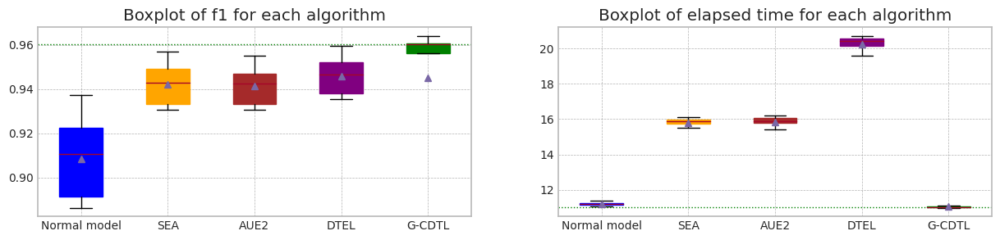

In [120]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 600,trial_count=20,lr_g=0.0001,weight_init=True)